In [41]:
import numpy as np
import matplotlib.pyplot as plt
import pyute as ut
import glob
import calnet.utils
import sim_utils
import sklearn.linear_model as sklm
import scipy.stats as sst
%matplotlib notebook

In [2]:
basefold = '/Users/dan/Documents/notebooks/mossing-PC/shared_data/calnet_data/'
subfold = 'weights_200903b/'
plots_fold = basefold + 'fit_graphics/' + subfold
ut.mkdir(plots_fold)
weights_fold = basefold + 'weights/' + subfold
weights_files = glob.glob(weights_fold+'*.npy')
weights_files.sort()

In [3]:
nN,nP,nQ,nS,nT = 36,2,4,2,2
nfiles = len(weights_files)
Ts = np.zeros((nfiles,nQ))
Ks = np.zeros((nfiles,nQ))
Wmys = np.zeros((nfiles,nQ,nQ))
Wmxs = np.zeros((nfiles,nP,nQ))
s02s = np.zeros((nfiles,nQ))
YYs = np.zeros((nfiles,6,6,nQ*nS*nT))
XXs = np.zeros((nfiles,6,6,nP*nS*nT))
Etas = np.zeros((nfiles,6,6,nQ*nS*nT))
# Eta1s = np.zeros((nfiles,6,6,nQ*nS*nT))
# Eta2s = np.zeros((nfiles,6,6,nQ*nS*nT))
h1s = np.zeros((nfiles,))
h2s = np.zeros((nfiles,))
losses = np.zeros((nfiles,))
couplings = np.zeros((nfiles,6,6,nQ*nS*nT,nQ*nS*nT))
# couplings with phiPV = phiPC fixed
couplings_pcpv = np.zeros((nfiles,6,6,nQ*nS*nT,nQ*nS*nT))
Xcouplings = np.zeros((nfiles,6,6,nP*nS*nT,nQ*nS*nT))
phis = np.zeros((nfiles,6,6,nQ*nS*nT))
for iwt,weights_file in enumerate(weights_files):
    Wstar_dict = np.load(weights_file,allow_pickle=True)[()]
#     Wmx,Wmy,Wsx,Wsy,s02,K,kappa,T,XX,XXp,Eta,Xi,h = Wstar_dict['as_list']
    Wmx,Wmy,Wsx,Wsy,s02,K,kappa,T,XX,XXp,Eta,Xi,h1,h2 = Wstar_dict['as_list']
    losses[iwt] = Wstar_dict['loss']
#     Wmx,Wmy,Wsx,Wsy,s02,K,kappa,T,XX,XXp,Eta,Xi,h1,h2,h3,Eta1,Eta2,Eta3 = Wstar_dict['as_list']
    WWmy = calnet.utils.gen_Weight_k_kappa_t(Wmy,K,kappa,T)
    WWmx = calnet.utils.gen_Weight_k_kappa_t(Wmx,K,kappa,T)
    tiled_s02 = np.tile(s02,nS*nT)
    Ts[iwt] = T
    Ks[iwt] = K
    Wmys[iwt] = Wmy
    Wmxs[iwt] = Wmx
    s02s[iwt] = s02
    YYs[iwt] = sim_utils.f_miller_troyer(Eta,Xi**2+tiled_s02).reshape((6,6,nQ*nS*nT))
    XXs[iwt] = XX.reshape((6,6,nP*nS*nT))
    Etas[iwt] = Eta.reshape((6,6,nQ*nS*nT))
    h1s[iwt] = h1
    h2s[iwt] = h2
#     Eta1s[iwt] = Eta1.reshape((6,6,nQ*nS*nT))
#     Eta2s[iwt] = Eta2.reshape((6,6,nQ*nS*nT))
    for istim in range(nN):
        iistim,jjstim = np.unravel_index(istim,(6,6))
        phis[iwt,iistim,jjstim] = calnet.utils.fprime_miller_troyer(Eta[istim],Xi[istim]**2+tiled_s02)
        phipcpv = phis[iwt,iistim,jjstim].copy()
        phipcpv[3::4] = phipcpv[0::4]
        Phi = np.diag(phis[iwt,iistim,jjstim])
        Phipcpv = np.diag(phipcpv)
        couplings[iwt,iistim,jjstim] = Phi @ np.linalg.inv(np.eye(nQ*nS*nT) - WWmy @ Phi)
        Xcouplings[iwt,iistim,jjstim] = WWmx @ Phi @ np.linalg.inv(np.eye(nQ*nS*nT) - WWmy @ Phi)
        couplings_pcpv[iwt,iistim,jjstim] = Phipcpv @ np.linalg.inv(np.eye(nQ*nS*nT) - WWmy @ Phipcpv)
# couplings = np.reshape(couplings,(couplings.shape[0],6,6,couplings.shape[2],couplings.shape[3]))
# Xcouplings = np.reshape(Xcouplings,(Xcouplings.shape[0],6,6,Xcouplings.shape[2],Xcouplings.shape[3]))
lkat = losses < 40
bi_vars = {xx:x[lkat] for xx,x in zip(['Ts','Ks','Wmys','Wmxs','s02s','YYs','XXs'],[Ts,Ks,Wmys,Wmxs,s02s,YYs,XXs])}

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:54: RuntimeWarning: invalid value encountered in less


In [4]:
basefold = '/Users/dan/Documents/notebooks/mossing-PC/shared_data/calnet_data/'
subfold = 'weights_200902e/'
plots_fold = basefold + 'fit_graphics/' + subfold
ut.mkdir(plots_fold)
weights_fold = basefold + 'weights/' + subfold
weights_files = glob.glob(weights_fold+'*.npy')
weights_files.sort()
# # weights_filenames = [s.split('/')[-1][:-4] for s in weights_files]


In [5]:
nfiles = len(weights_files)
Ts = np.zeros((nfiles,nQ))
Ks = np.zeros((nfiles,nQ))
Wmys = np.zeros((nfiles,nQ,nQ))
Wmxs = np.zeros((nfiles,nP,nQ))
s02s = np.zeros((nfiles,nQ))
YYs = np.zeros((nfiles,6,6,nQ*nS*nT))
XXs = np.zeros((nfiles,6,6,nP*nS*nT))
couplings = np.zeros((nfiles,6,6,nQ*nS*nT,nQ*nS*nT))
# couplings with phiPV = phiPC fixed
couplings_pcpv = np.zeros((nfiles,6,6,nQ*nS*nT,nQ*nS*nT))
Xcouplings = np.zeros((nfiles,6,6,nP*nS*nT,nQ*nS*nT))
phis = np.zeros((nfiles,6,6,nQ*nS*nT))
losses = np.zeros((nfiles,))
for iwt,weights_file in enumerate(weights_files):
    Wstar_dict = np.load(weights_file,allow_pickle=True)[()]
    Wmx,Wmy,Wsx,Wsy,s02,K,kappa,T,XX,XXp,Eta,Xi,h = Wstar_dict['as_list']
    losses[iwt] = Wstar_dict['loss']
#     Wmx,Wmy,Wsx,Wsy,s02,K,kappa,T,XX,XXp,Eta,Xi,h1,h2 = Wstar_dict['as_list']
    WWmy = calnet.utils.gen_Weight_k_kappa_t(Wmy,K,kappa,T)
    WWmx = calnet.utils.gen_Weight_k_kappa_t(Wmx,K,kappa,T)
    tiled_s02 = np.tile(s02,nS*nT)
    Ts[iwt] = T
    Ks[iwt] = K
    Wmys[iwt] = Wmy
    Wmxs[iwt] = Wmx
    s02s[iwt] = s02
    YYs[iwt] = sim_utils.f_miller_troyer(Eta,Xi**2+tiled_s02).reshape((6,6,nQ*nS*nT))
    XXs[iwt] = XX.reshape((6,6,nP*nS*nT))
    for istim in range(nN):
        iistim,jjstim = np.unravel_index(istim,(6,6))
        phis[iwt,iistim,jjstim] = calnet.utils.fprime_miller_troyer(Eta[istim],Xi[istim]**2+tiled_s02)
        phipcpv = phis[iwt,iistim,jjstim].copy()
        phipcpv[3::4] = phipcpv[0::4]
        Phi = np.diag(phis[iwt,iistim,jjstim])
        Phipcpv = np.diag(phipcpv)
        couplings[iwt,iistim,jjstim] = Phi @ np.linalg.inv(np.eye(nQ*nS*nT) - WWmy @ Phi)
        Xcouplings[iwt,iistim,jjstim] = WWmx @ Phi @ np.linalg.inv(np.eye(nQ*nS*nT) - WWmy @ Phi)
        couplings_pcpv[iwt,iistim,jjstim] = Phipcpv @ np.linalg.inv(np.eye(nQ*nS*nT) - WWmy @ Phipcpv)
# couplings = np.reshape(couplings,(couplings.shape[0],6,6,couplings.shape[2],couplings.shape[3]))
# Xcouplings = np.reshape(Xcouplings,(Xcouplings.shape[0],6,6,Xcouplings.shape[2],Xcouplings.shape[3]))
lkat = losses < 40
uni_vars = {xx:x[lkat] for xx,x in zip(['Ts','Ks','Wmys','Wmxs','s02s','YYs','XXs'],[Ts,Ks,Wmys,Wmxs,s02s,YYs,XXs])}

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:42: RuntimeWarning: invalid value encountered in less


<IPython.core.display.Javascript object>


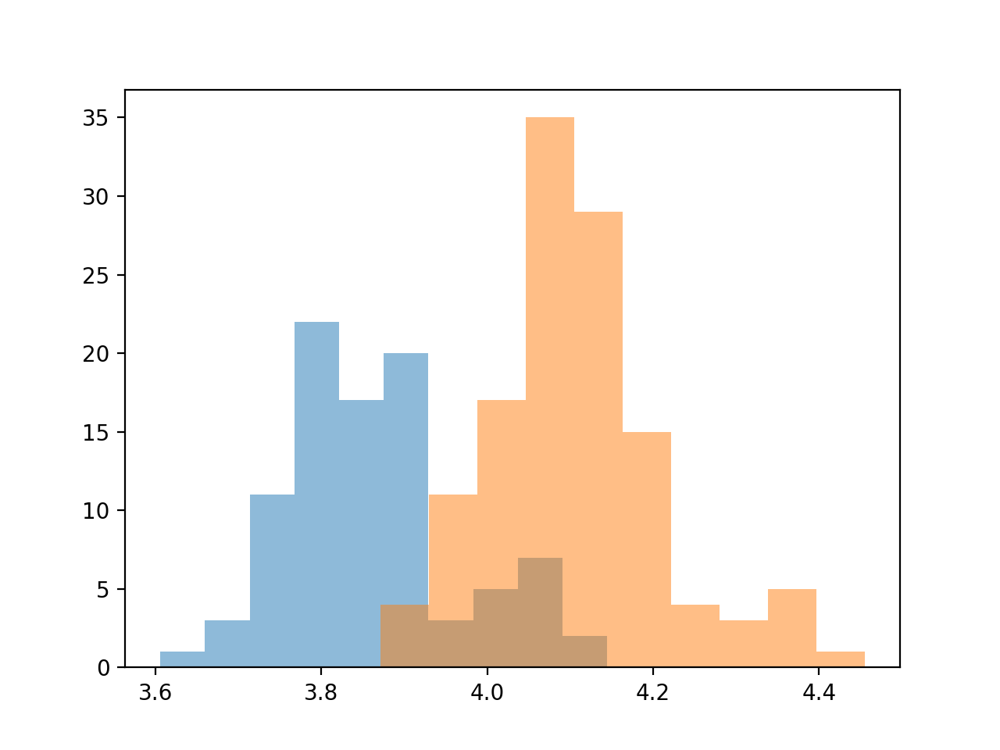

<IPython.core.display.Javascript object>


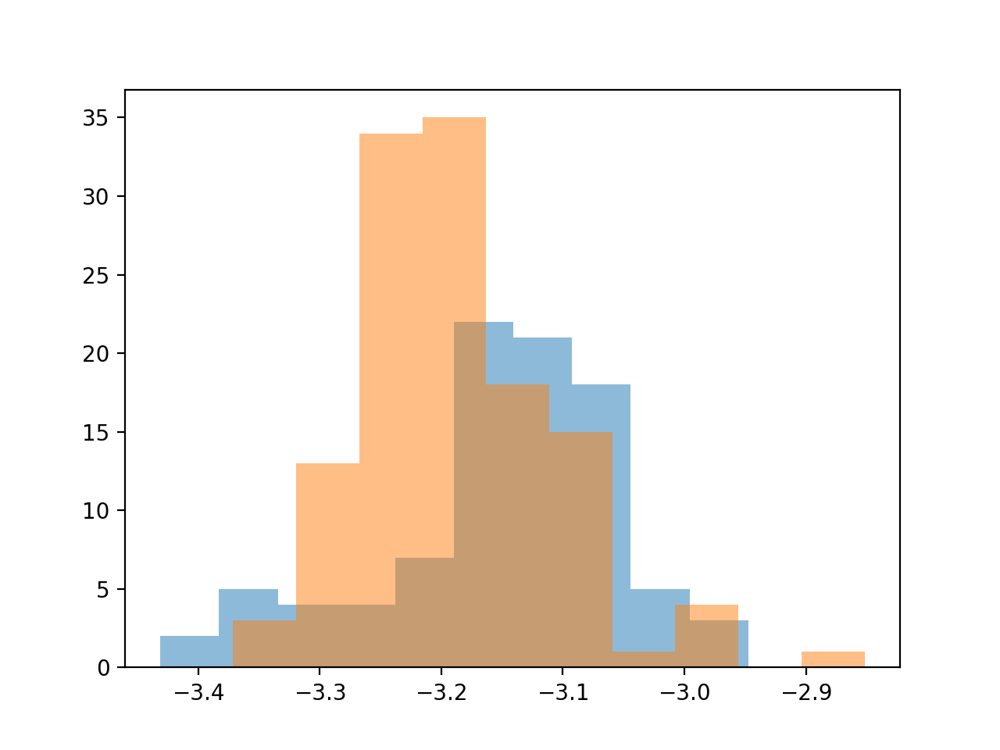

In [6]:
for inds in [[0,0],[3,0]]:
    i,j = inds
    plt.figure()
    for dicti in [uni_vars,bi_vars]:
        plt.hist(dicti['Wmys'][:,i,j],alpha=0.5)

<IPython.core.display.Javascript object>


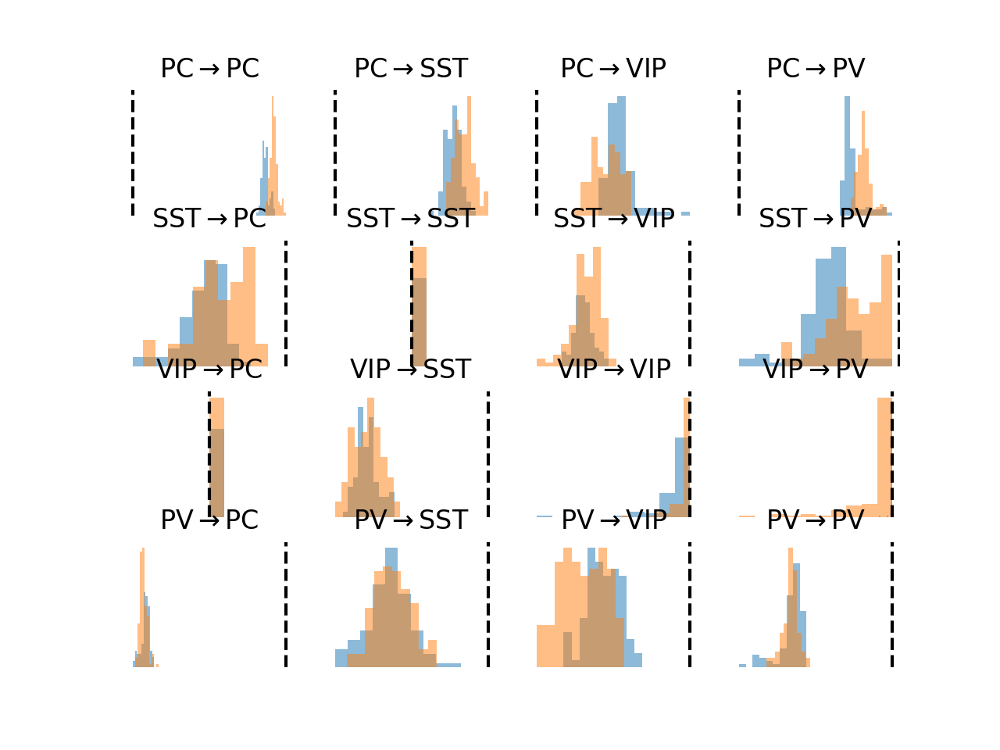

In [7]:
lbls = ['PC','SST','VIP','PV']
plt.figure()
for i in range(4):
    for j in range(4):
        plt.subplot(4,4,4*i+j+1)
        for dicti in [uni_vars,bi_vars]:
            plt.hist(dicti['Wmys'][:,i,j],alpha=0.5)
        plt.axvline(0,c='k',linestyle='dashed')
        plt.axis('off')
        plt.title(r'%s$\rightarrow$%s'%(lbls[i],lbls[j]))

<IPython.core.display.Javascript object>


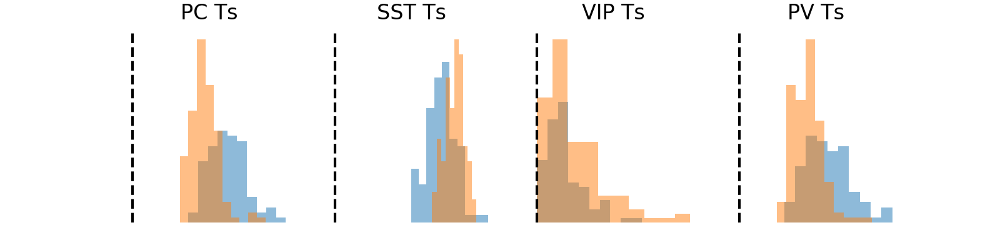

<IPython.core.display.Javascript object>


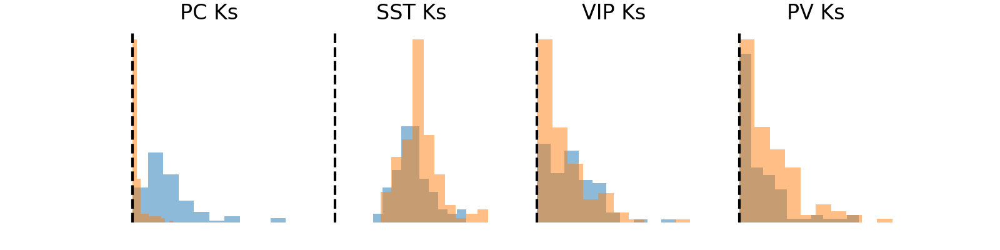

<IPython.core.display.Javascript object>


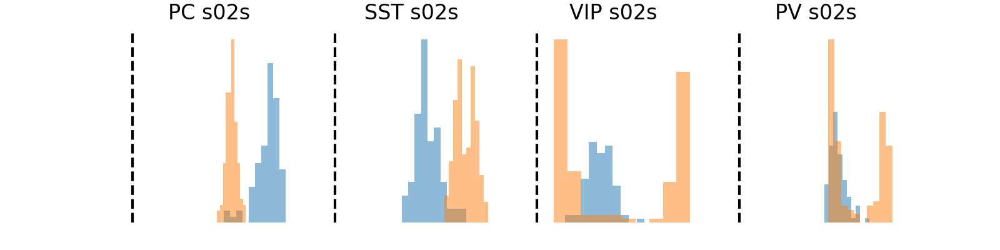

In [8]:
for entry in ['Ts','Ks','s02s']:
    plt.figure(figsize=(8,2))
    for i in range(4):
        plt.subplot(1,4,i+1)
        for dicti in [uni_vars,bi_vars]:
            plt.hist(dicti[entry][:,i],alpha=0.5)
        plt.axvline(0,c='k',linestyle='dashed')
        plt.axis('off')
        plt.title(r'%s %s'%(lbls[i],entry))

In [927]:
basefold = '/Users/dan/Documents/notebooks/mossing-PC/shared_data/calnet_data/'
subfold = 'weights_201010b/'
plots_fold = basefold + 'fit_graphics/' + subfold
ut.mkdir(plots_fold)
weights_fold = basefold + 'weights/' + subfold
weights_files = glob.glob(weights_fold+'*.npy')
weights_files.sort()
# # weights_filenames = [s.split('/')[-1][:-4] for s in weights_files]


In [928]:
[x.shape for x in [Wmy,K,kappa,T]]


[(4, 4), (4,), (), (0,)]

In [929]:
nT = 1
nfiles = len(weights_files)
Ts = np.zeros((nfiles,nQ*(nT-1)))
Ks = np.zeros((nfiles,nQ*(nS-1)))
Wmys = np.zeros((nfiles,nQ,nQ))
Wmxs = np.zeros((nfiles,nP,nQ))
s02s = np.zeros((nfiles,nQ))
YYs = np.zeros((nfiles,6,6,nQ*nS*nT))
XXs = np.zeros((nfiles,6,6,nP*nS*nT))
couplings = np.zeros((nfiles,6,6,nQ*nS*nT,nQ*nS*nT))
couplings_pcpv_fixed = np.zeros((nfiles,6,6,nQ*nS*nT,nQ*nS*nT))
couplings_fixed = np.zeros((nfiles,6,6,nQ*nS*nT,nQ*nS*nT,nQ))
Xcouplings = np.zeros((nfiles,6,6,nP*nS*nT,nQ*nS*nT))
phis = np.zeros((nfiles,6,6,nQ*nS*nT))
losses = np.zeros((nfiles,))
for iwt,weights_file in enumerate(weights_files):
    Wstar_dict = np.load(weights_file,allow_pickle=True)[()]
    Wmx,Wmy,Wsx,Wsy,s02,K,kappa,T,XX,XXp,Eta,Xi,h = Wstar_dict['as_list']
    losses[iwt] = Wstar_dict['loss']
#     Wmx,Wmy,Wsx,Wsy,s02,K,kappa,T,XX,XXp,Eta,Xi,h1,h2 = Wstar_dict['as_list']
    WWmy = calnet.utils.gen_Weight_k_kappa_t(Wmy,K,kappa,T,nS=nS,nT=nT)
    WWmx = calnet.utils.gen_Weight_k_kappa_t(Wmx,K,kappa,T,nS=nS,nT=nT)
    tiled_s02 = np.tile(s02,nS*nT)
    
    all_phis = calnet.utils.fprime_miller_troyer(Eta,Xi**2+tiled_s02)
    for icelltype in range(nQ):
        mean_phi = np.mean(all_phis[:,icelltype::nQ])
        for istim in range(nN):
            iistim,jjstim = np.unravel_index(istim,(6,6))        
            these_phis = all_phis[istim].copy()#calnet.utils.fprime_miller_troyer(Eta[istim],Xi[istim]**2+tiled_s02)
            these_phis[icelltype::nQ] = mean_phi
            Phi = np.diag(these_phis)
            couplings_fixed[iwt,iistim,jjstim,:,:,icelltype] = Phi @ np.linalg.inv(np.eye(nQ*nS*nT) - WWmy @ Phi)
    mean_phi_pc = np.mean(all_phis[:,0::nQ])
    mean_phi_pv = np.mean(all_phis[:,3::nQ])
    for istim in range(nN):
        iistim,jjstim = np.unravel_index(istim,(6,6))        
        these_phis = all_phis[istim].copy()#calnet.utils.fprime_miller_troyer(Eta[istim],Xi[istim]**2+tiled_s02)
        
        these_phis[0::nQ] = mean_phi_pc
        these_phis[3::nQ] = mean_phi_pv
        Phi = np.diag(these_phis)
        couplings_pcpv_fixed[iwt,iistim,jjstim,:,:] = Phi @ np.linalg.inv(np.eye(nQ*nS*nT) - WWmy @ Phi)
        
    Ts[iwt] = T
    Ks[iwt] = K
    Wmys[iwt] = Wmy
    Wmxs[iwt] = Wmx
    s02s[iwt] = s02
    YYs[iwt] = sim_utils.f_miller_troyer(Eta,Xi**2+tiled_s02).reshape((6,6,nQ*nS*nT))
    XXs[iwt] = XX.reshape((6,6,nP*nS*nT))
    for istim in range(nN):
        iistim,jjstim = np.unravel_index(istim,(6,6))
        phis[iwt,iistim,jjstim] = calnet.utils.fprime_miller_troyer(Eta[istim],Xi[istim]**2+tiled_s02)
        Phi = np.diag(phis[iwt,iistim,jjstim])
        couplings[iwt,iistim,jjstim] = Phi @ np.linalg.inv(np.eye(nQ*nS*nT) - WWmy @ Phi)
        Xcouplings[iwt,iistim,jjstim] = WWmx @ Phi @ np.linalg.inv(np.eye(nQ*nS*nT) - WWmy @ Phi)
# couplings = np.reshape(couplings,(couplings.shape[0],6,6,couplings.shape[2],couplings.shape[3]))
# Xcouplings = np.reshape(Xcouplings,(Xcouplings.shape[0],6,6,Xcouplings.shape[2],Xcouplings.shape[3]))
lkat = losses < 20
uni_vars = {xx:x[lkat] for xx,x in zip(['Ts','Ks','Wmys','Wmxs','s02s','YYs','XXs'],[Ts,Ks,Wmys,Wmxs,s02s,YYs,XXs])}


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:60: RuntimeWarning: invalid value encountered in less


In [930]:
nfits = lkat.sum()
shapes = [Wmys.shape[1:],Wmxs.shape[1:],Ks.shape[1:]]
X = np.concatenate((Wmys[lkat].reshape((nfits,-1)),Wmxs[lkat].reshape((nfits,-1)),Ks[lkat].reshape((nfits,-1))),axis=1)
# X = Ks[lkat].reshape((nfits,-1))
X = sst.zscore(X,axis=0)
gd = ~np.isnan(X.sum(0))
X = X[:,gd]
y = couplings[lkat,:,:,4,0].mean(1).mean(1)


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2419: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd


In [931]:
linreg = sklm.Lasso(alpha=0.03).fit(X,y)


In [932]:
coefs = np.nan*np.ones_like(gd)
coefs[gd] = linreg.coef_
coef_list = calnet.utils.parse_thing(coefs,shapes)


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


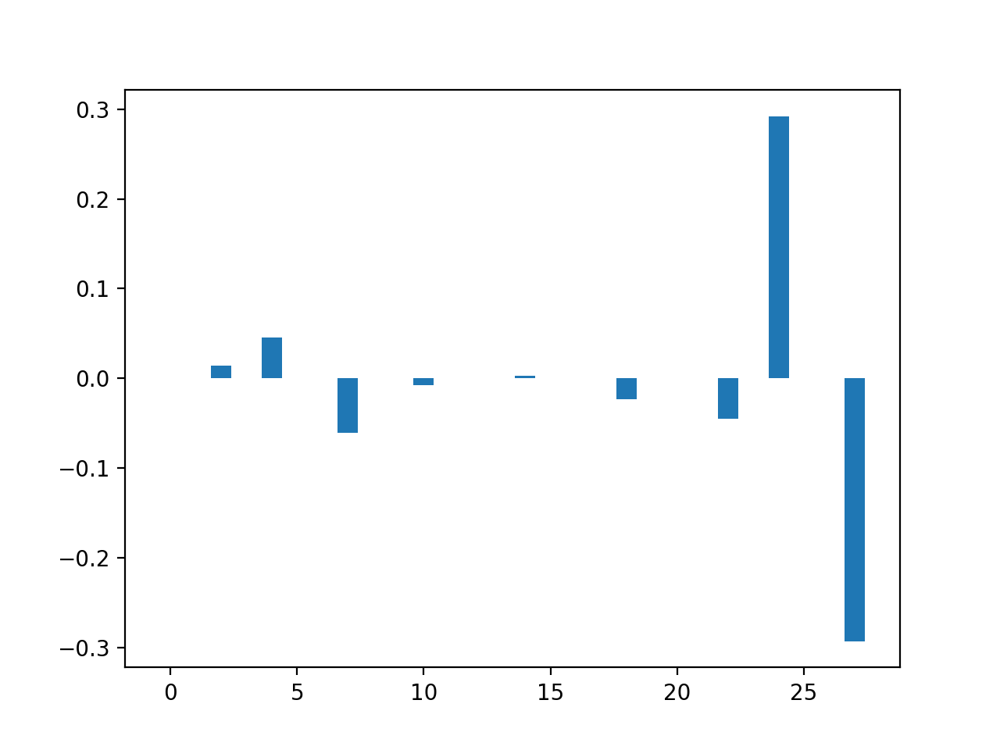

<BarContainer object of 28 artists>

In [933]:
plt.figure()
plt.bar(np.arange(coefs.size),coefs)


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


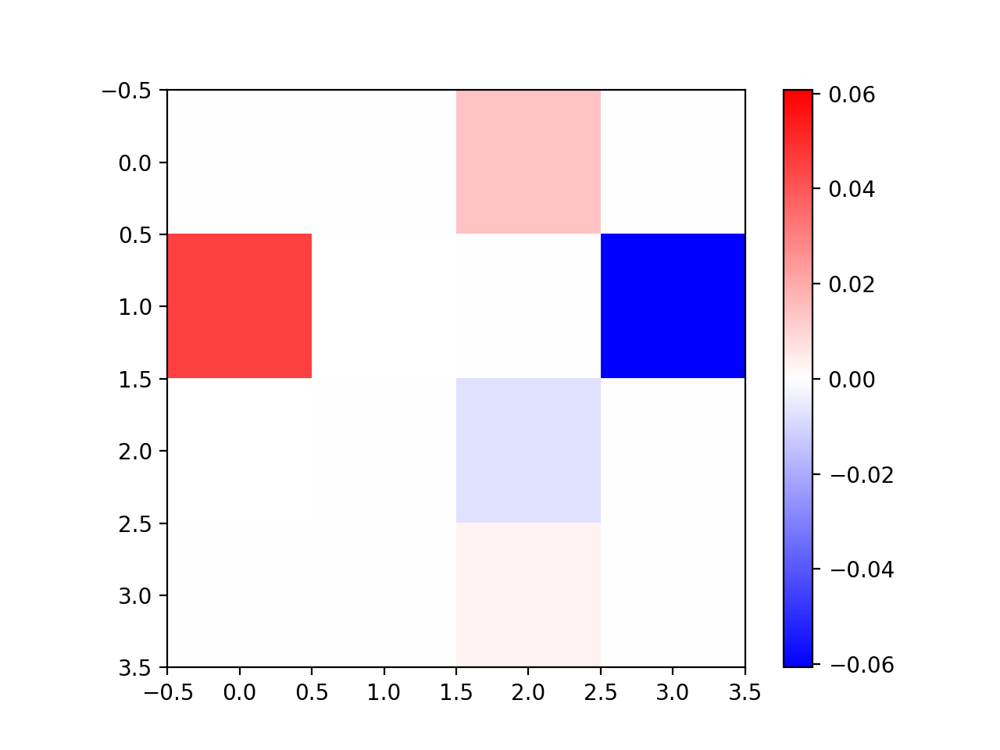

In [410]:
plt.figure()
from importlib import reload
reload(ut)
ut.imshow_hot_cold(coef_list[0])
plt.colorbar()


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


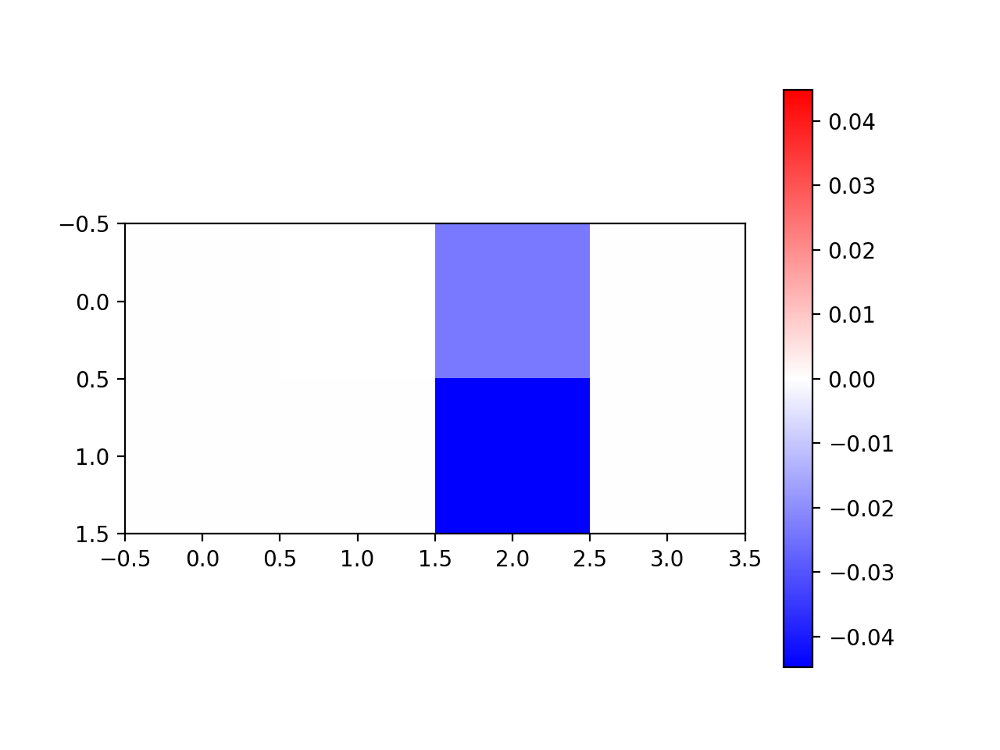

In [934]:
plt.figure()
ut.imshow_hot_cold(coef_list[1])
plt.colorbar()


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


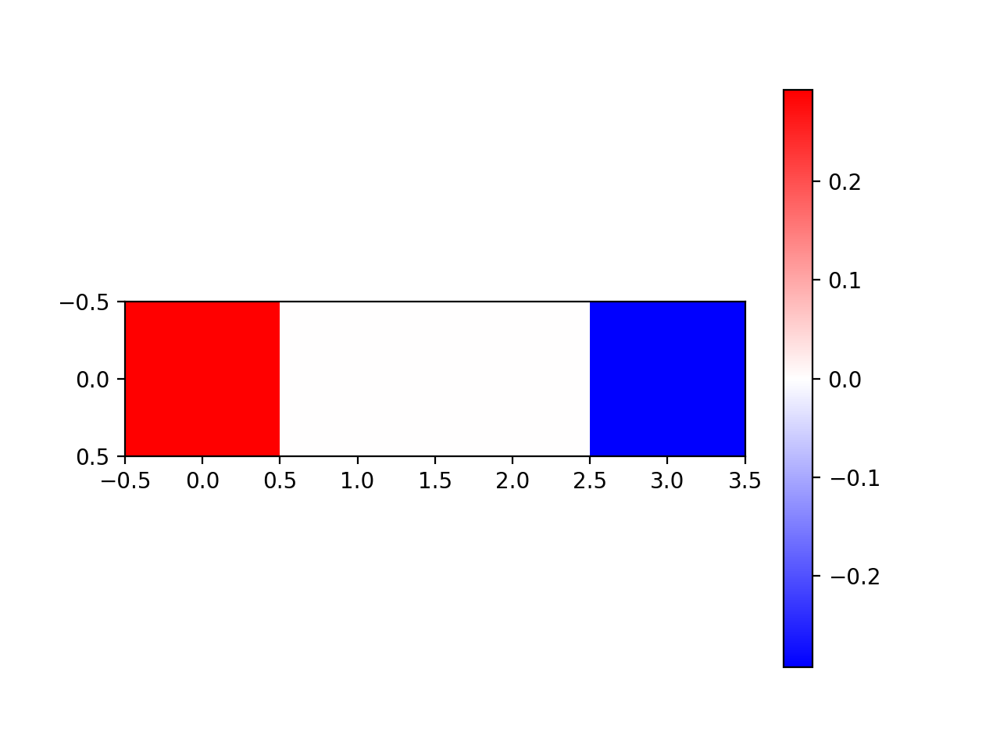

In [284]:
plt.figure()
ut.imshow_hot_cold(coef_list[2][np.newaxis])
plt.colorbar()

In [935]:
low_sst_pv = (Wmys[lkat][:,1,0]-Wmys[lkat][:,1,3] < -0.6)
high_sst_pv = (Wmys[lkat][:,1,0]-Wmys[lkat][:,1,3] > 0.05)

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


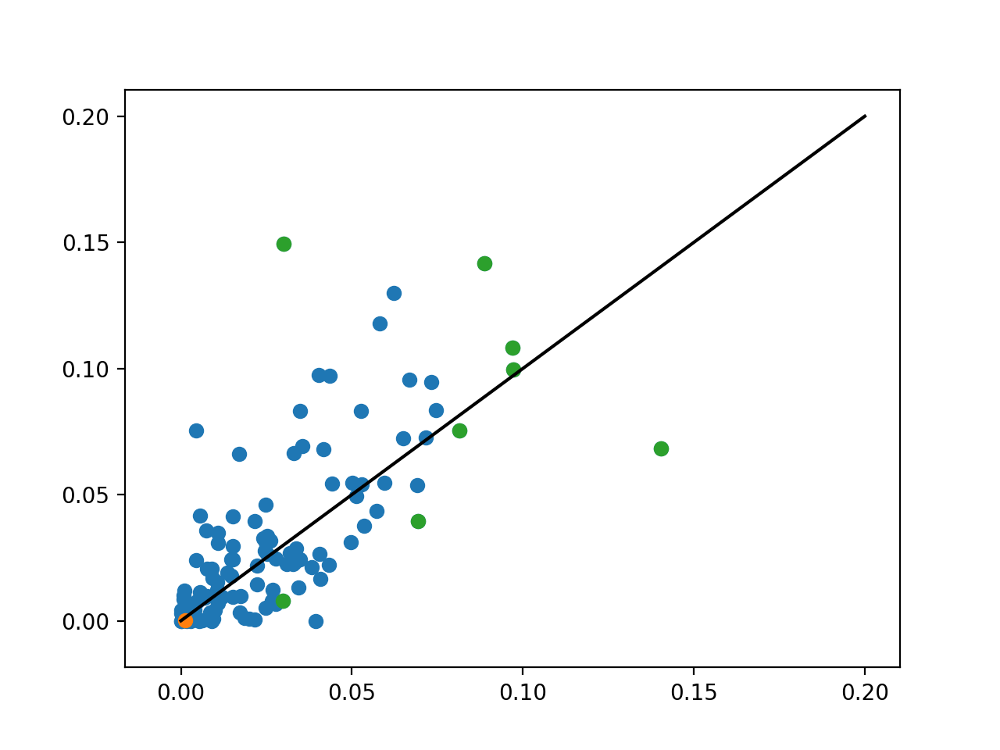

In [434]:
plt.figure()
plt.scatter(Ks[lkat][:,0],Ks[lkat][:,3])
plt.scatter(Ks[lkat][:,0][low_sst_pv],Ks[lkat][:,3][low_sst_pv])
plt.scatter(Ks[lkat][:,0][high_sst_pv],Ks[lkat][:,3][high_sst_pv])
plt.plot((0,0.2),(0,0.2),c='k')

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


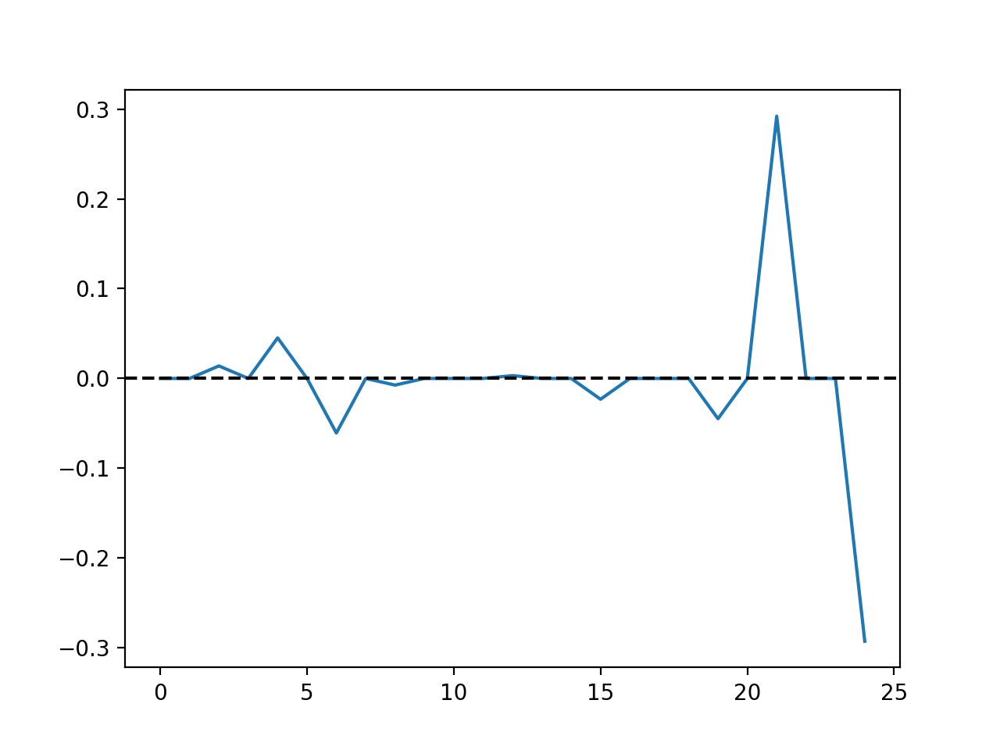

In [413]:
plt.figure()
plt.plot(linreg.coef_)
plt.axhline(0,c='k',linestyle='dashed')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


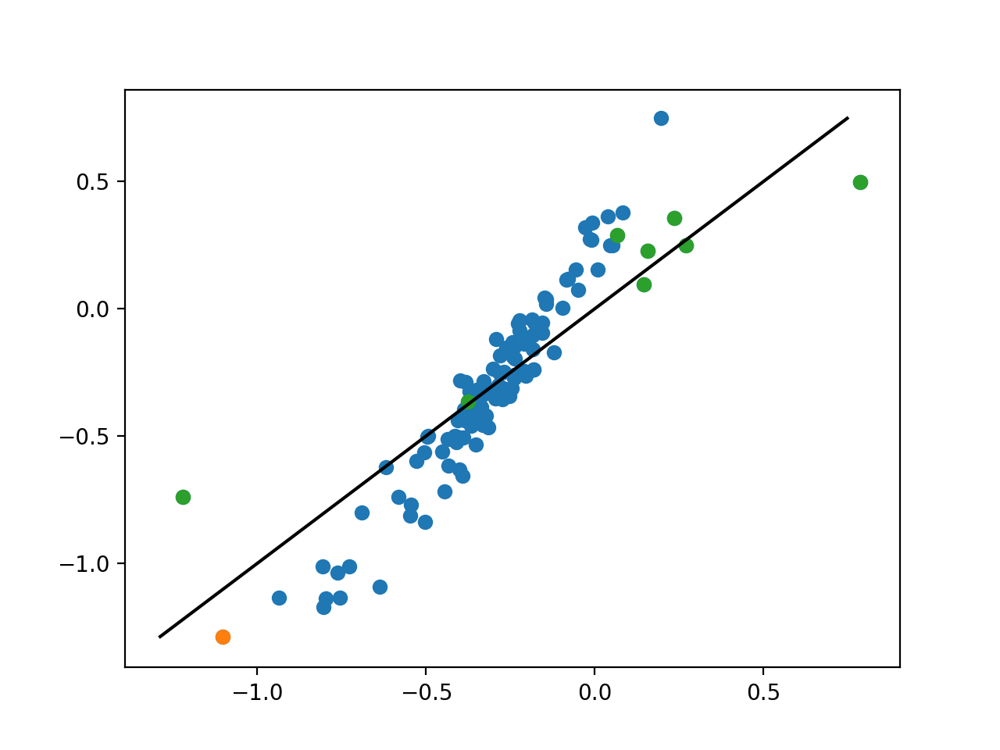

In [435]:
plt.figure()
plt.scatter(linreg.predict(X),y)
plt.scatter(linreg.predict(X)[low_sst_pv],y[low_sst_pv])
plt.scatter(linreg.predict(X)[high_sst_pv],y[high_sst_pv])
mn,mx = y.min(),y.max()
plt.plot((mn,mx),(mn,mx),c='k')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


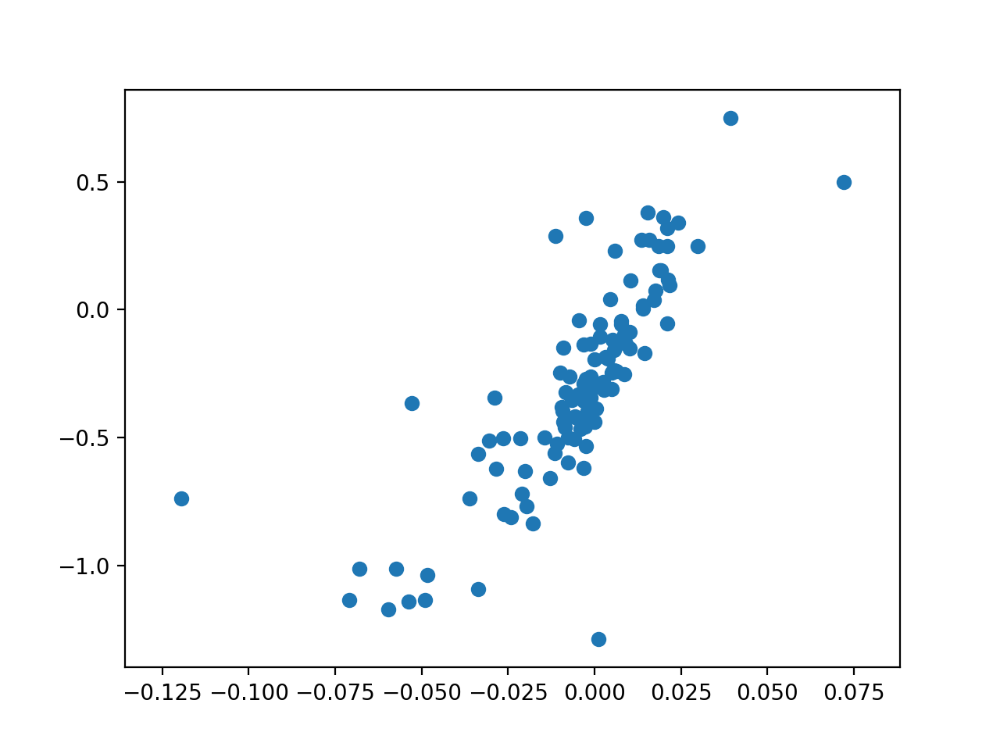

IndexError: boolean index did not match indexed array along dimension 0; dimension is 111 but corresponding boolean dimension is 127

In [414]:
plt.figure()
plt.scatter(Ks[lkat][:,0]-Ks[lkat][:,3],y)
plt.scatter((Ks[lkat][:,0]-Ks[lkat][:,3])[low_sst_pv],y[low_sst_pv])
plt.scatter((Ks[lkat][:,0]-Ks[lkat][:,3])[high_sst_pv],y[high_sst_pv])
mn,mx = y.min(),y.max()
# plt.plot((mn,mx),(mn,mx),c='k')


In [436]:
print(np.corrcoef(Ks[lkat][:,0],y)[0,1])
print(np.corrcoef(-Ks[lkat][:,3],y)[0,1])
print(np.corrcoef(Ks[lkat][:,0]-Ks[lkat][:,3],y)[0,1])


0.3685171250403777
0.28017869088467245
0.7837430906761794


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


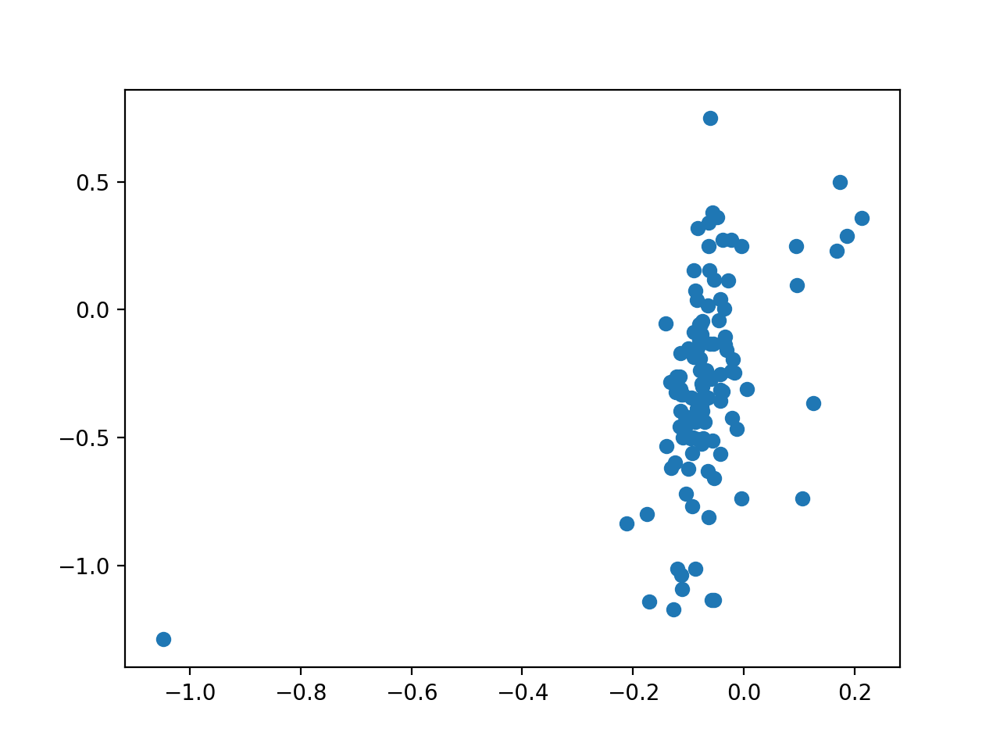

In [437]:
plt.figure()
plt.scatter(Wmys[lkat][:,1,0]-Wmys[lkat][:,1,3],y)
# plt.scatter(Wmys[lkat][:,1,3],y)
mn,mx = y.min(),y.max()
# plt.plot((mn,mx),(mn,mx),c='k')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


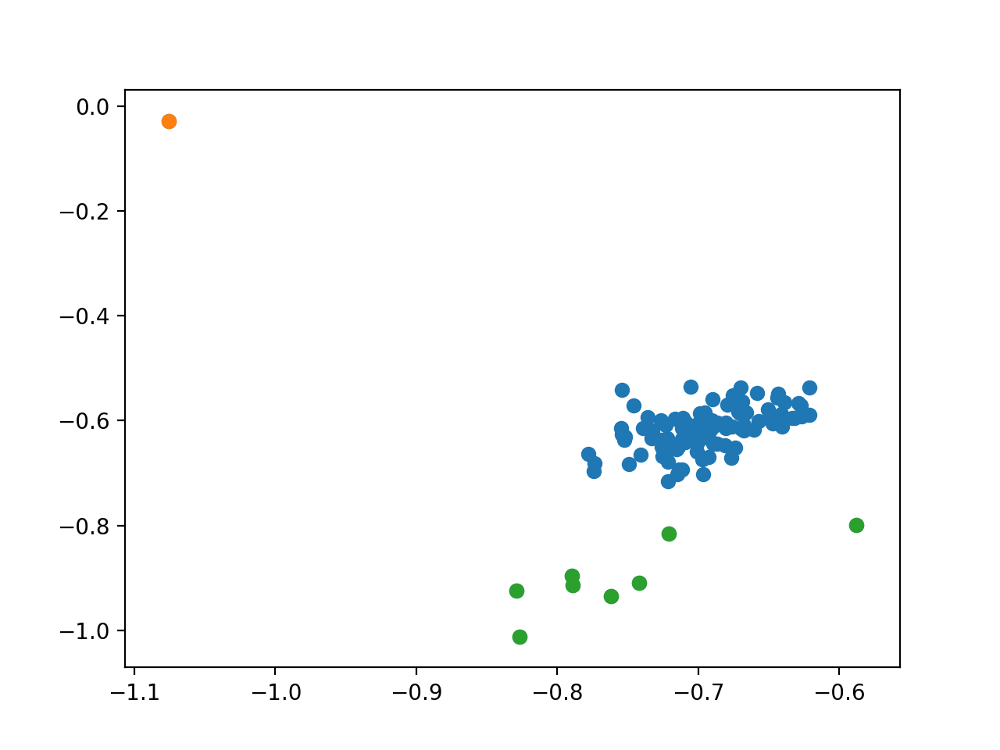

In [307]:
plt.figure()
plt.scatter(Wmys[lkat][:,1,0],Wmys[lkat][:,1,3])
plt.scatter(Wmys[lkat][:,1,0][low_sst_pv],Wmys[lkat][:,1,3][low_sst_pv])
plt.scatter(Wmys[lkat][:,1,0][high_sst_pv],Wmys[lkat][:,1,3][high_sst_pv])

In [438]:
nfits = lkat.sum()
shapes = [Wmys.shape[1:],Wmxs.shape[1:],Ks.shape[1:]]
X = np.concatenate((Wmys[lkat].reshape((nfits,-1)),Wmxs[lkat].reshape((nfits,-1)),Ks[lkat].reshape((nfits,-1))),axis=1)
# X = Ks[lkat].reshape((nfits,-1))
X = sst.zscore(X,axis=0)
gd = ~np.isnan(X.sum(0))
X = X[:,gd]
y = (np.abs(couplings[lkat,:,:,4,0] - couplings_pcpv_fixed[lkat,:,:,4,0])).mean(1).mean(1)
# y = np.abs(couplings[lkat,:,:,4,0] - couplings_fixed[lkat,:,:,4,0,1]).mean(1).mean(1)


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2419: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd


In [439]:
big_pc_rf = (Ks[lkat][:,0]-Ks[lkat][:,3]>0.01)

In [440]:
linreg = sklm.Lasso(alpha=0.01).fit(X,y)
linreg = sklm.Lasso(alpha=0.01).fit(X[~big_pc_rf],y[~big_pc_rf])

In [441]:
coefs = np.nan*np.ones_like(gd)
coefs[gd] = linreg.coef_
coef_list = calnet.utils.parse_thing(coefs,shapes)


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


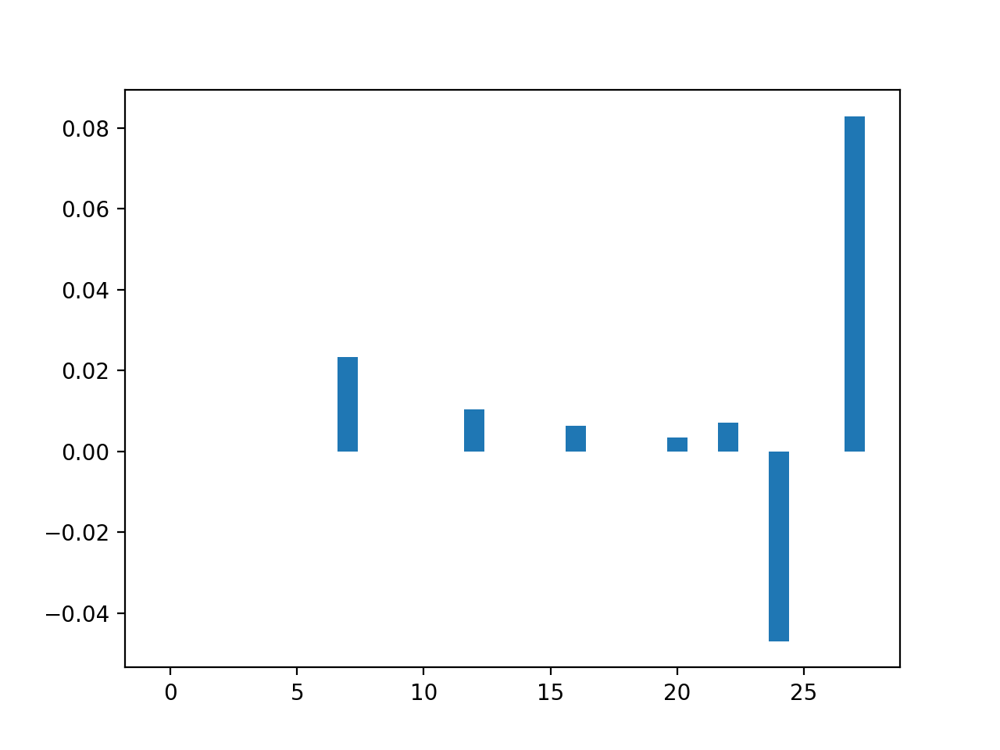

<BarContainer object of 28 artists>

In [442]:
plt.figure()
plt.bar(np.arange(coefs.size),coefs)


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


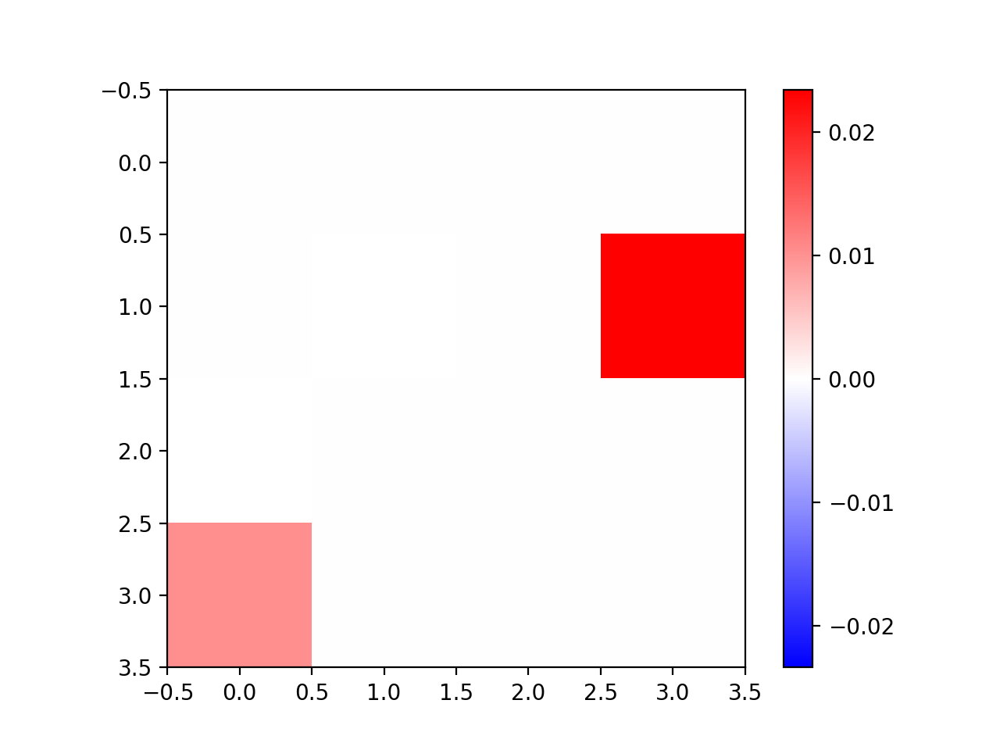

In [376]:
plt.figure()
from importlib import reload
reload(ut)
ut.imshow_hot_cold(coef_list[0])
plt.colorbar()


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


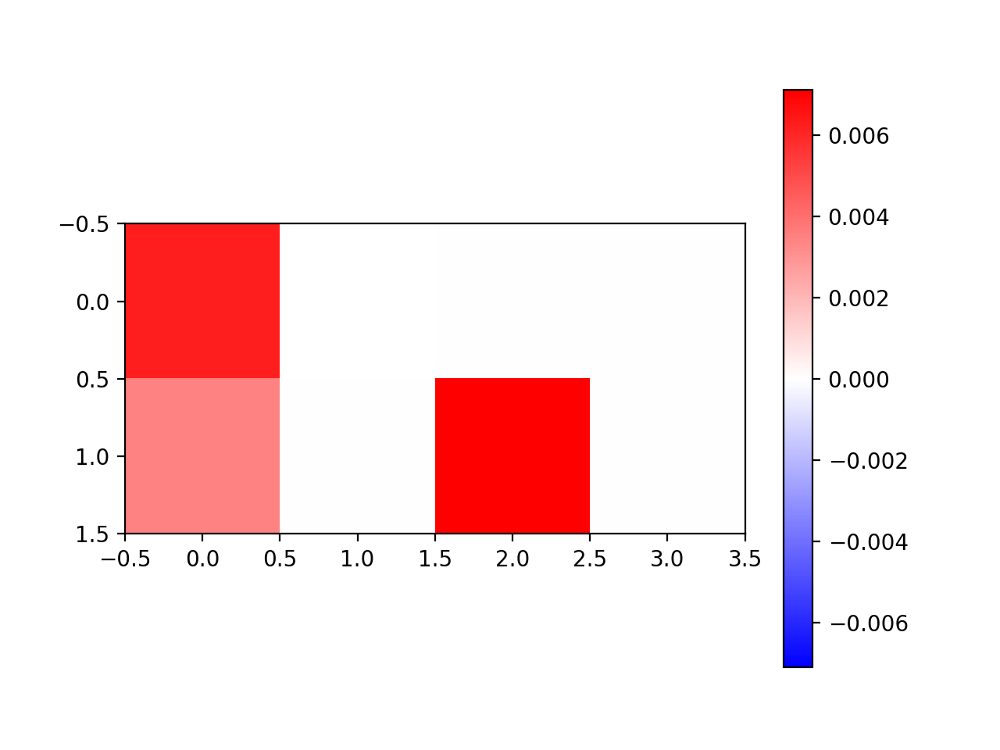

In [443]:
plt.figure()
ut.imshow_hot_cold(coef_list[1])
plt.colorbar()


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


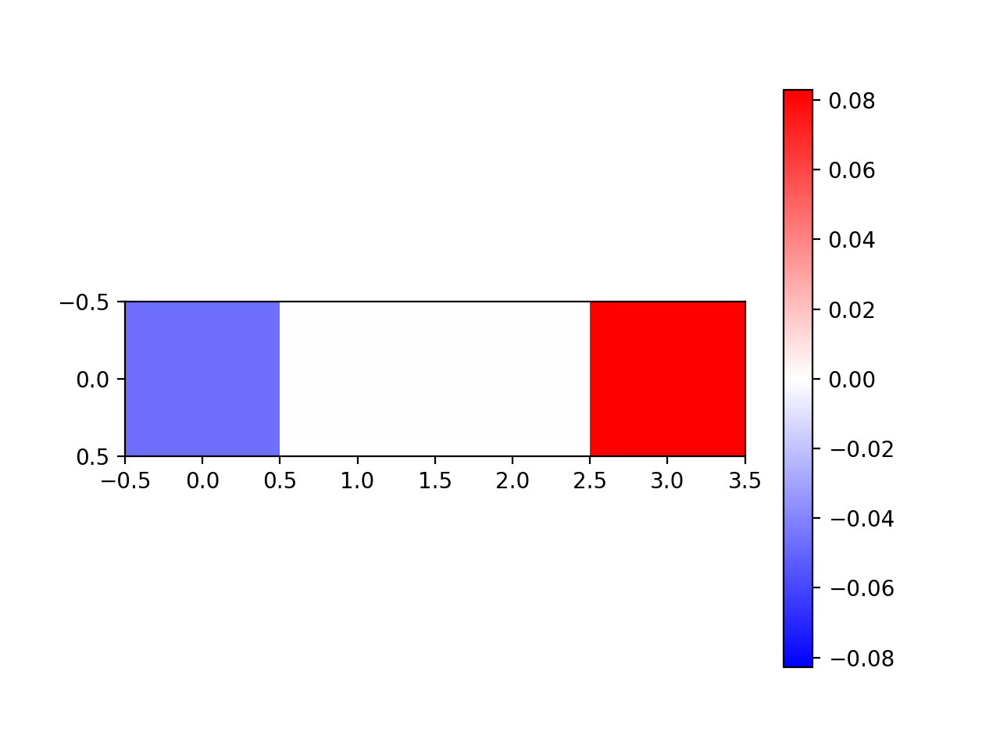

In [377]:
plt.figure()
ut.imshow_hot_cold(coef_list[2][np.newaxis])
plt.colorbar()

In [444]:
low_sst_pv = (Wmys[lkat][:,1,0]-Wmys[lkat][:,1,3] < -0.6)
high_sst_pv = (Wmys[lkat][:,1,0]-Wmys[lkat][:,1,3] > 0.05)

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


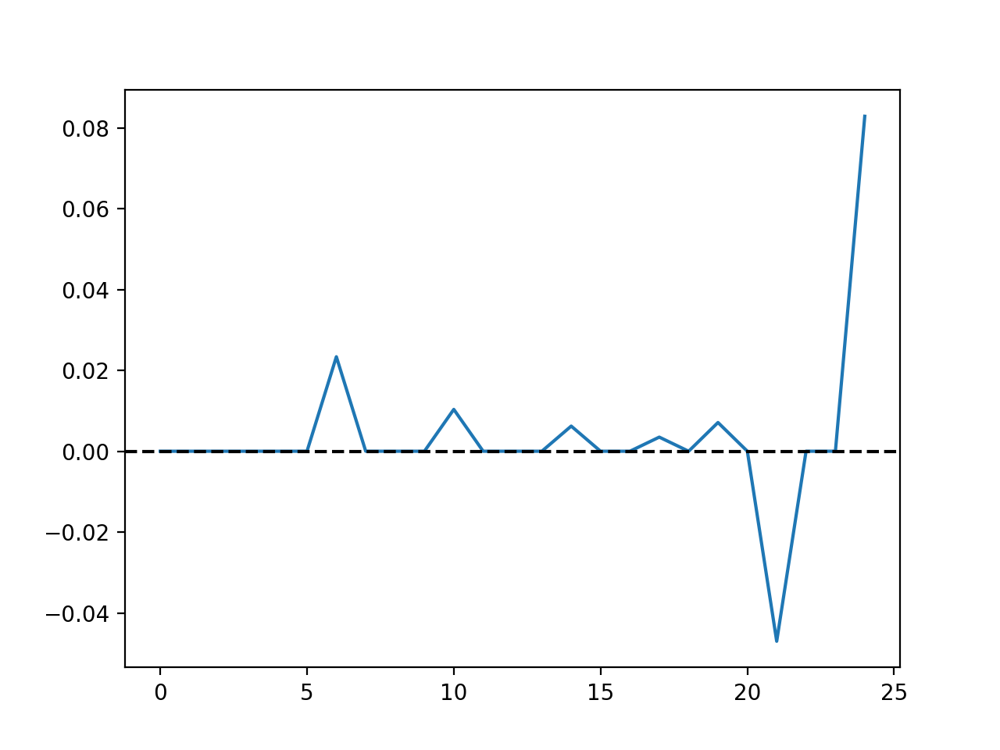

In [445]:
plt.figure()
plt.plot(linreg.coef_)
plt.axhline(0,c='k',linestyle='dashed')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


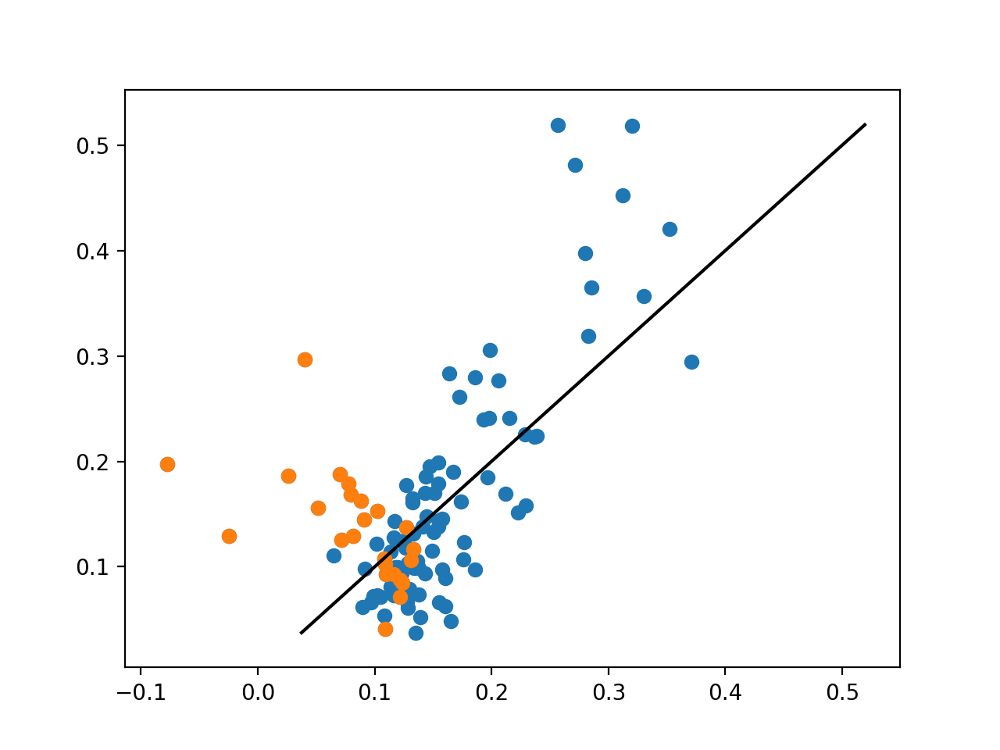

In [381]:
plt.figure()
plt.scatter(linreg.predict(X),y)
plt.scatter(linreg.predict(X)[big_pc_rf],y[big_pc_rf])
mn,mx = y.min(),y.max()
plt.plot((mn,mx),(mn,mx),c='k')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


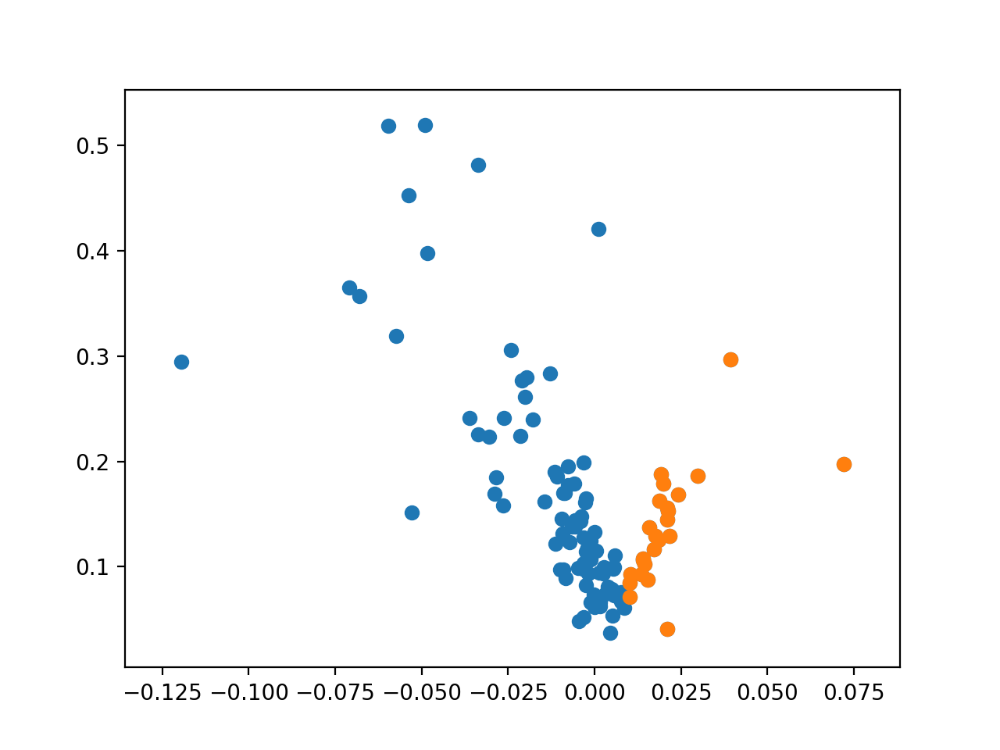

In [424]:
plt.figure()
plt.scatter(Ks[lkat][:,0]-Ks[lkat][:,3],y)
plt.scatter((Ks[lkat][:,0]-Ks[lkat][:,3])[big_pc_rf],y[big_pc_rf])
mn,mx = y.min(),y.max()
# plt.plot((mn,mx),(mn,mx),c='k')


In [385]:
print(np.corrcoef(Ks[lkat][:,0],y)[0,1])
print(np.corrcoef(-Ks[lkat][:,3],y)[0,1])
print(np.corrcoef(Ks[lkat][:,0]-Ks[lkat][:,3],y)[0,1])

print(np.corrcoef((Ks[lkat][:,0]-Ks[lkat][:,3])[big_pc_rf],y[big_pc_rf])[0,1])
print(np.corrcoef((Ks[lkat][:,0]-Ks[lkat][:,3])[~big_pc_rf],y[~big_pc_rf])[0,1])

0.019907461219806515
-0.43872186497512194
-0.5950152612222651
0.6162644097611367
-0.7353214807820483


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


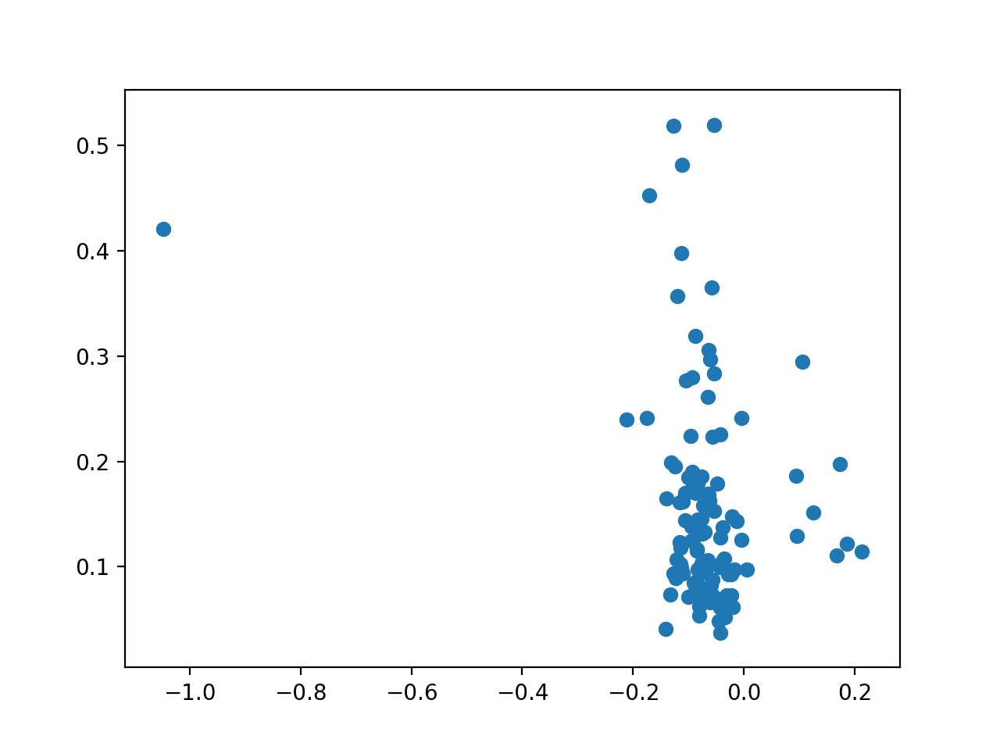

In [370]:
plt.figure()
plt.scatter(Wmys[lkat][:,1,0]-Wmys[lkat][:,1,3],y)
# plt.scatter(Wmys[lkat][:,1,3],y)
mn,mx = y.min(),y.max()
# plt.plot((mn,mx),(mn,mx),c='k')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


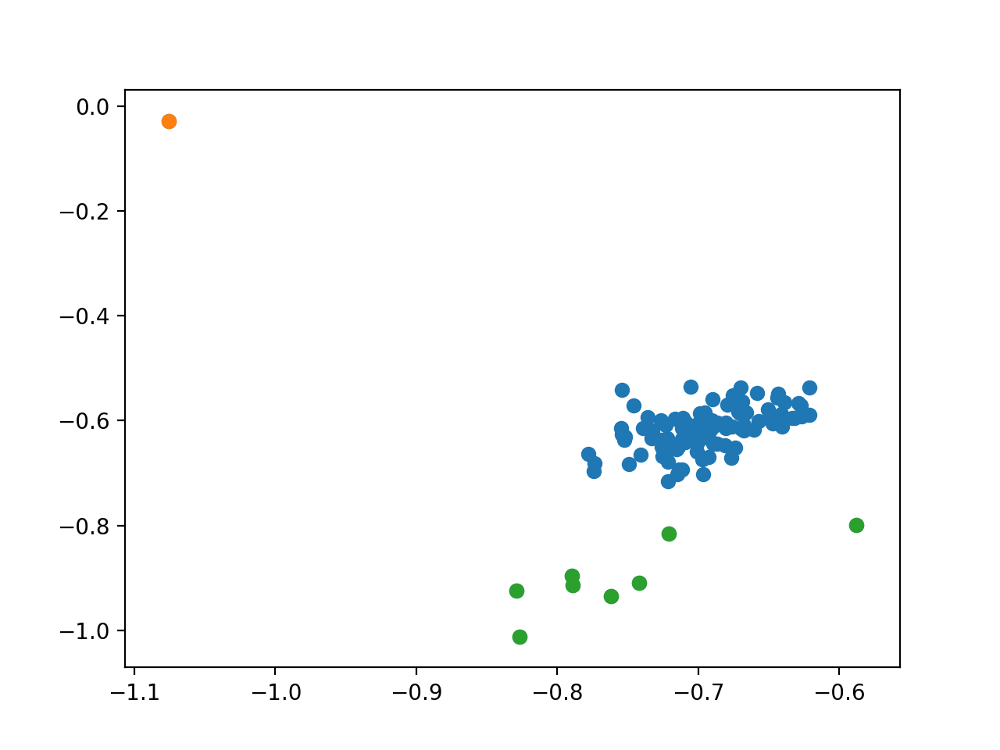

In [371]:
plt.figure()
plt.scatter(Wmys[lkat][:,1,0],Wmys[lkat][:,1,3])
plt.scatter(Wmys[lkat][:,1,0][low_sst_pv],Wmys[lkat][:,1,3][low_sst_pv])
plt.scatter(Wmys[lkat][:,1,0][high_sst_pv],Wmys[lkat][:,1,3][high_sst_pv])

In [506]:
subfold = 'weights_200901i/'
plots_fold = basefold + 'fit_graphics/' + subfold
ut.mkdir(plots_fold)
weights_fold = basefold + 'weights/' + subfold
weights_files = glob.glob(weights_fold+'*.npy')

subfold = 'weights_200902e/'
plots_fold = basefold + 'fit_graphics/' + subfold
ut.mkdir(plots_fold)
weights_fold = basefold + 'weights/' + subfold
weights_files = weights_files + glob.glob(weights_fold+'*.npy')


In [507]:
nT = 2
nfiles = len(weights_files)
Ts = np.zeros((nfiles,nQ*(nT-1)))
Ks = np.zeros((nfiles,nQ*(nS-1)))
Wmys = np.zeros((nfiles,nQ,nQ))
Wmxs = np.zeros((nfiles,nP,nQ))
s02s = np.zeros((nfiles,nQ))
YYs = np.zeros((nfiles,6,6,nQ*nS*nT))
XXs = np.zeros((nfiles,6,6,nP*nS*nT))
couplings = np.zeros((nfiles,6,6,nQ*nS*nT,nQ*nS*nT))
couplings_pcpv_fixed = np.zeros((nfiles,6,6,nQ*nS*nT,nQ*nS*nT))
couplings_fixed = np.zeros((nfiles,6,6,nQ*nS*nT,nQ*nS*nT,nQ))
Xcouplings = np.zeros((nfiles,6,6,nP*nS*nT,nQ*nS*nT))
phis = np.zeros((nfiles,6,6,nQ*nS*nT))
losses = np.zeros((nfiles,))
for iwt,weights_file in enumerate(weights_files):
    Wstar_dict = np.load(weights_file,allow_pickle=True)[()]
    Wmx,Wmy,Wsx,Wsy,s02,K,kappa,T,XX,XXp,Eta,Xi,h = Wstar_dict['as_list']
    losses[iwt] = Wstar_dict['loss']
#     Wmx,Wmy,Wsx,Wsy,s02,K,kappa,T,XX,XXp,Eta,Xi,h1,h2 = Wstar_dict['as_list']
    WWmy = calnet.utils.gen_Weight_k_kappa_t(Wmy,K,kappa,T,nS=nS,nT=nT)
    WWmx = calnet.utils.gen_Weight_k_kappa_t(Wmx,K,kappa,T,nS=nS,nT=nT)
    tiled_s02 = np.tile(s02,nS*nT)
    
    all_phis = calnet.utils.fprime_miller_troyer(Eta,Xi**2+tiled_s02)
    for icelltype in range(nQ):
        mean_phi = np.mean(all_phis[:,icelltype::nQ])
        for istim in range(nN):
            iistim,jjstim = np.unravel_index(istim,(6,6))        
            these_phis = all_phis[istim].copy()#calnet.utils.fprime_miller_troyer(Eta[istim],Xi[istim]**2+tiled_s02)
            these_phis[icelltype::nQ] = mean_phi
            Phi = np.diag(these_phis)
            couplings_fixed[iwt,iistim,jjstim,:,:,icelltype] = Phi @ np.linalg.inv(np.eye(nQ*nS*nT) - WWmy @ Phi)
    mean_phi_pc = np.mean(all_phis[:,0::nQ])
    mean_phi_pv = np.mean(all_phis[:,3::nQ])
    for istim in range(nN):
        iistim,jjstim = np.unravel_index(istim,(6,6))        
        these_phis = all_phis[istim].copy()#calnet.utils.fprime_miller_troyer(Eta[istim],Xi[istim]**2+tiled_s02)
        
        these_phis[0::nQ] = mean_phi_pc
        these_phis[3::nQ] = mean_phi_pv
        Phi = np.diag(these_phis)
        couplings_pcpv_fixed[iwt,iistim,jjstim,:,:] = Phi @ np.linalg.inv(np.eye(nQ*nS*nT) - WWmy @ Phi)
        
    Ts[iwt] = T
    Ks[iwt] = K
    Wmys[iwt] = Wmy
    Wmxs[iwt] = Wmx
    s02s[iwt] = s02
    YYs[iwt] = sim_utils.f_miller_troyer(Eta,Xi**2+tiled_s02).reshape((6,6,nQ*nS*nT))
    XXs[iwt] = XX.reshape((6,6,nP*nS*nT))
    for istim in range(nN):
        iistim,jjstim = np.unravel_index(istim,(6,6))
        phis[iwt,iistim,jjstim] = calnet.utils.fprime_miller_troyer(Eta[istim],Xi[istim]**2+tiled_s02)
        Phi = np.diag(phis[iwt,iistim,jjstim])
        couplings[iwt,iistim,jjstim] = Phi @ np.linalg.inv(np.eye(nQ*nS*nT) - WWmy @ Phi)
        Xcouplings[iwt,iistim,jjstim] = WWmx @ Phi @ np.linalg.inv(np.eye(nQ*nS*nT) - WWmy @ Phi)
# couplings = np.reshape(couplings,(couplings.shape[0],6,6,couplings.shape[2],couplings.shape[3]))
# Xcouplings = np.reshape(Xcouplings,(Xcouplings.shape[0],6,6,Xcouplings.shape[2],Xcouplings.shape[3]))
lkat = losses < 40
uni_vars = {xx:x[lkat] for xx,x in zip(['Ts','Ks','Wmys','Wmxs','s02s','YYs','XXs'],[Ts,Ks,Wmys,Wmxs,s02s,YYs,XXs])}


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:60: RuntimeWarning: invalid value encountered in less


In [510]:
nfits = lkat.sum()
shapes = [Wmys.shape[1:],Wmxs.shape[1:],Ks.shape[1:]]
X = np.concatenate((Wmys[lkat].reshape((nfits,-1)),Wmxs[lkat].reshape((nfits,-1)),Ks[lkat].reshape((nfits,-1))),axis=1)
# X = Ks[lkat].reshape((nfits,-1))
X = sst.zscore(X,axis=0)
gd = ~np.isnan(X.sum(0))
X = X[:,gd]
y = couplings[lkat,:,:,8,0].mean(1).mean(1)

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2419: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd


In [511]:
linreg = sklm.Lasso(alpha=0.03).fit(X,y)


In [512]:
coefs = np.nan*np.ones_like(gd)
coefs[gd] = linreg.coef_
coef_list = calnet.utils.parse_thing(coefs,shapes)


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


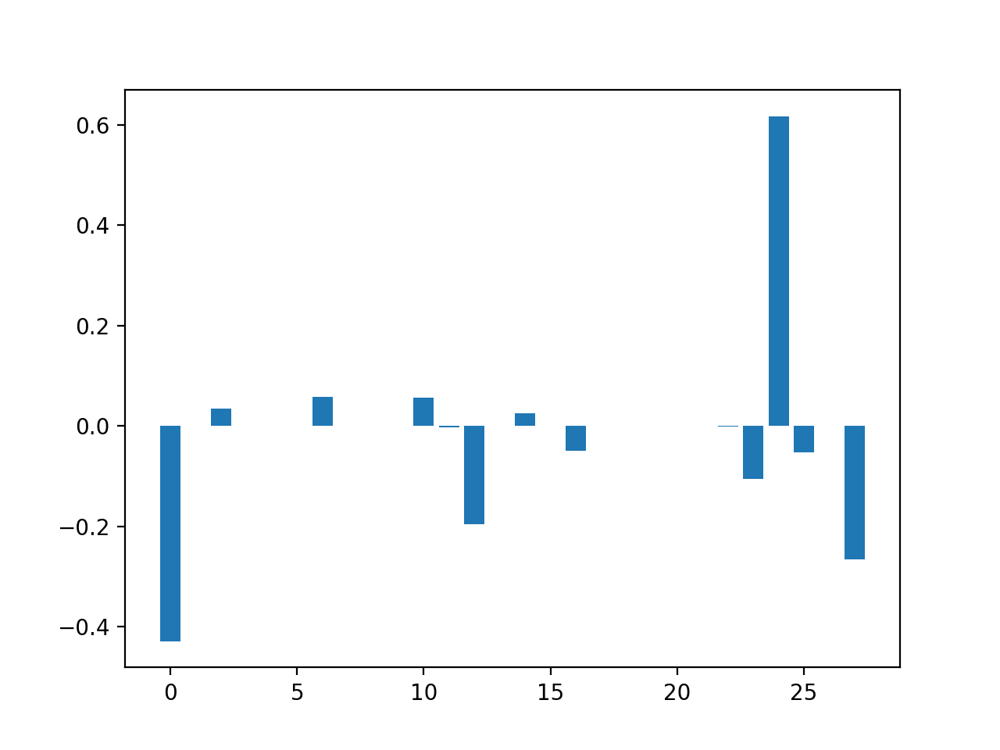

<BarContainer object of 28 artists>

In [513]:
plt.figure()
plt.bar(np.arange(coefs.size),coefs)


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


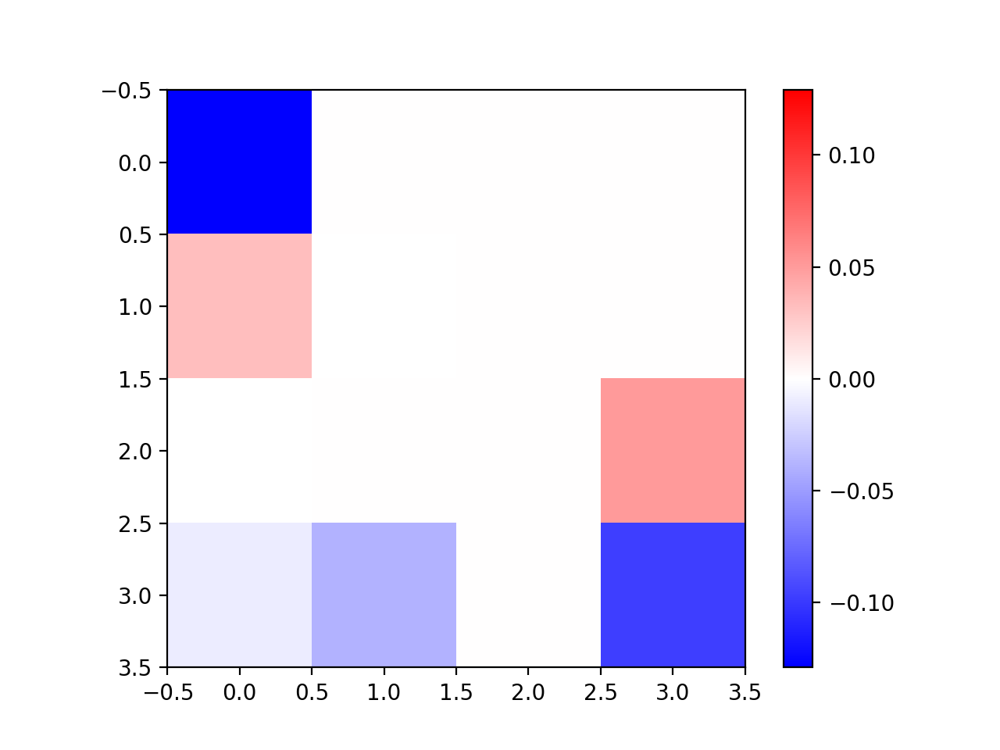

In [458]:
plt.figure()
from importlib import reload
reload(ut)
ut.imshow_hot_cold(coef_list[0])
plt.colorbar()


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


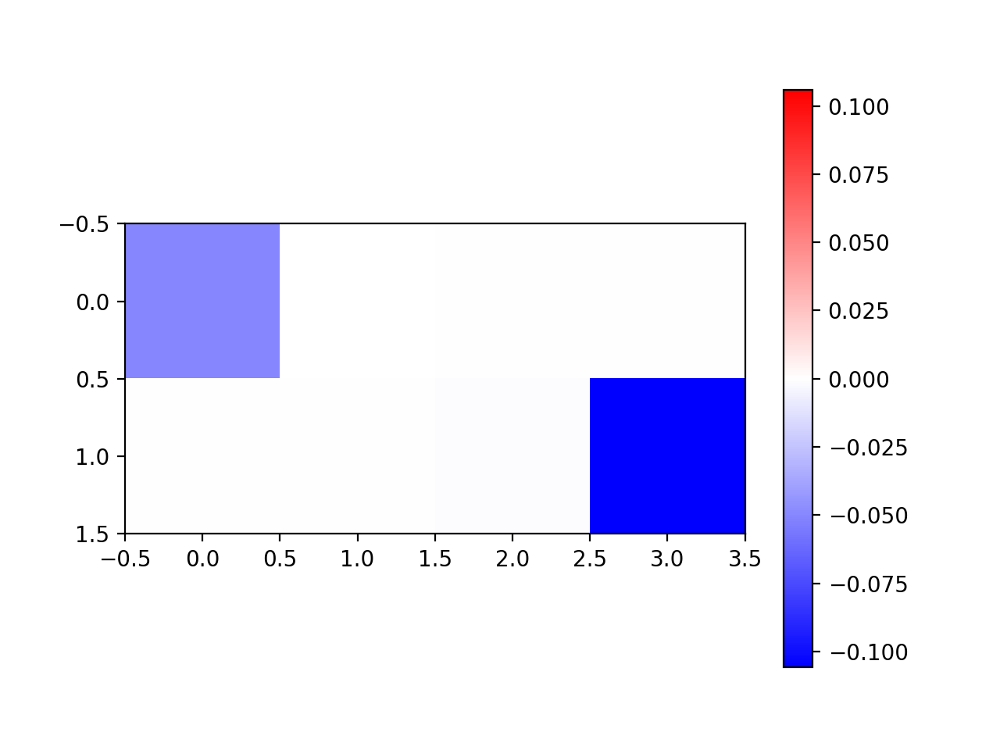

In [514]:
plt.figure()
ut.imshow_hot_cold(coef_list[1])
plt.colorbar()


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


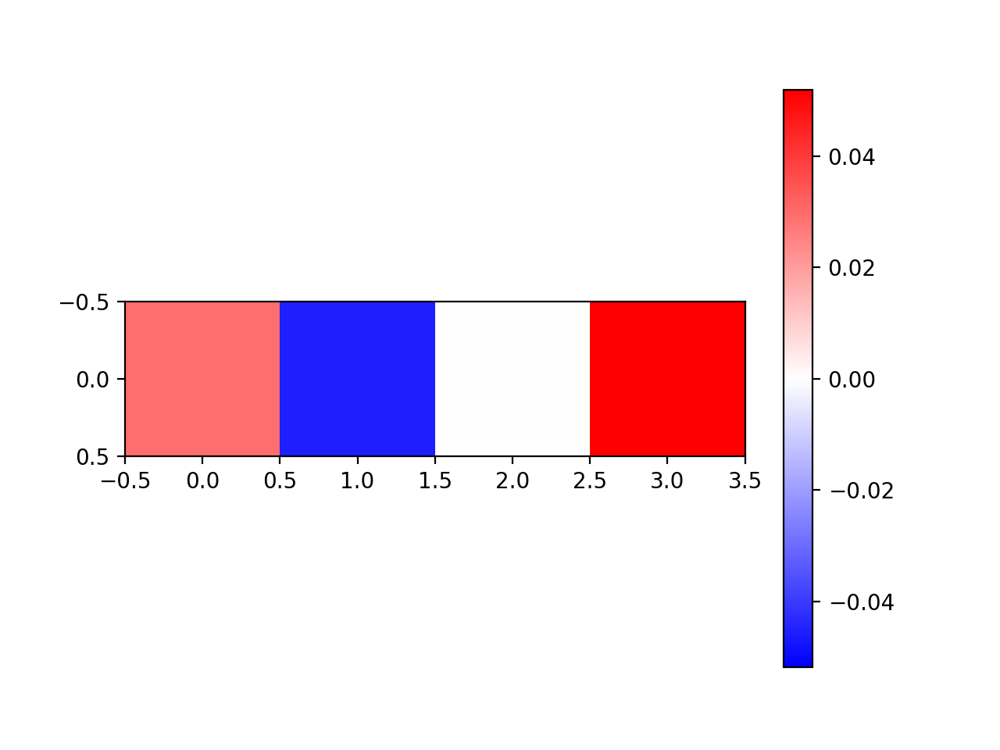

In [459]:
plt.figure()
ut.imshow_hot_cold(coef_list[2][np.newaxis])
plt.colorbar()

In [515]:
low_sst_pv = (Wmys[lkat][:,1,3] < -0.4)
high_sst_pv = (Wmys[lkat][:,1,0]-Wmys[lkat][:,1,3] < -0.045)
low_ff = (Wmxs[lkat][:,0,0] < 0.5)
high_ff = ~low_ff

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


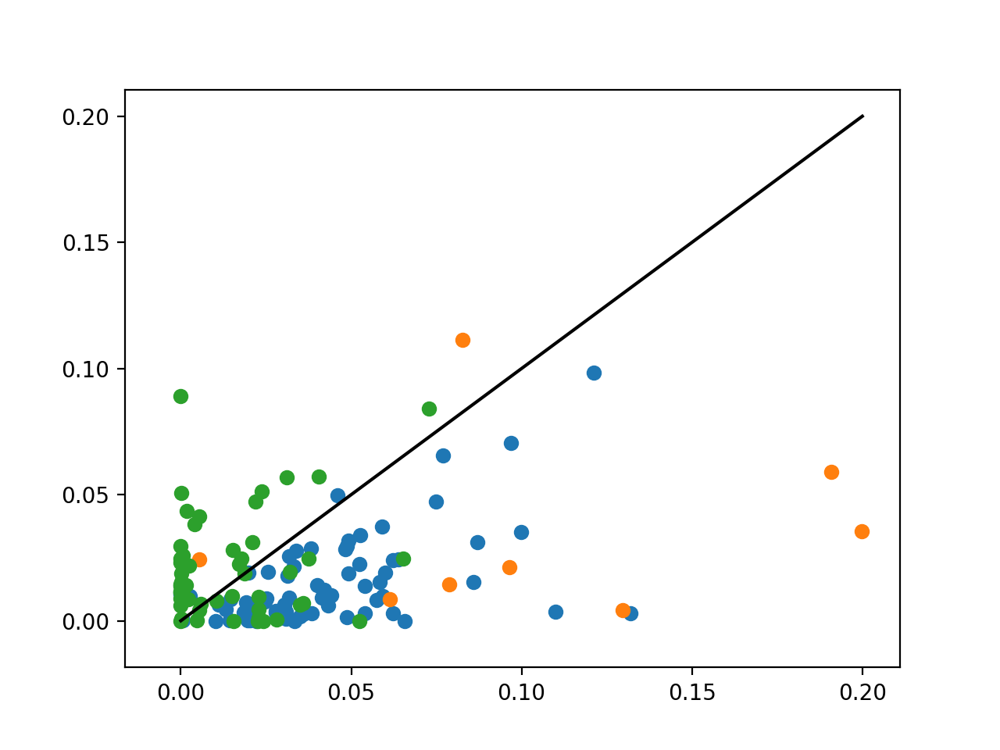

In [516]:
plt.figure()
plt.scatter(Ks[lkat][:,0][~low_sst_pv & ~high_sst_pv],Ks[lkat][:,3][~low_sst_pv & ~high_sst_pv])
plt.scatter(Ks[lkat][:,0][low_sst_pv],Ks[lkat][:,3][low_sst_pv])
plt.scatter(Ks[lkat][:,0][high_sst_pv],Ks[lkat][:,3][high_sst_pv])
plt.plot((0,0.2),(0,0.2),c='k')

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


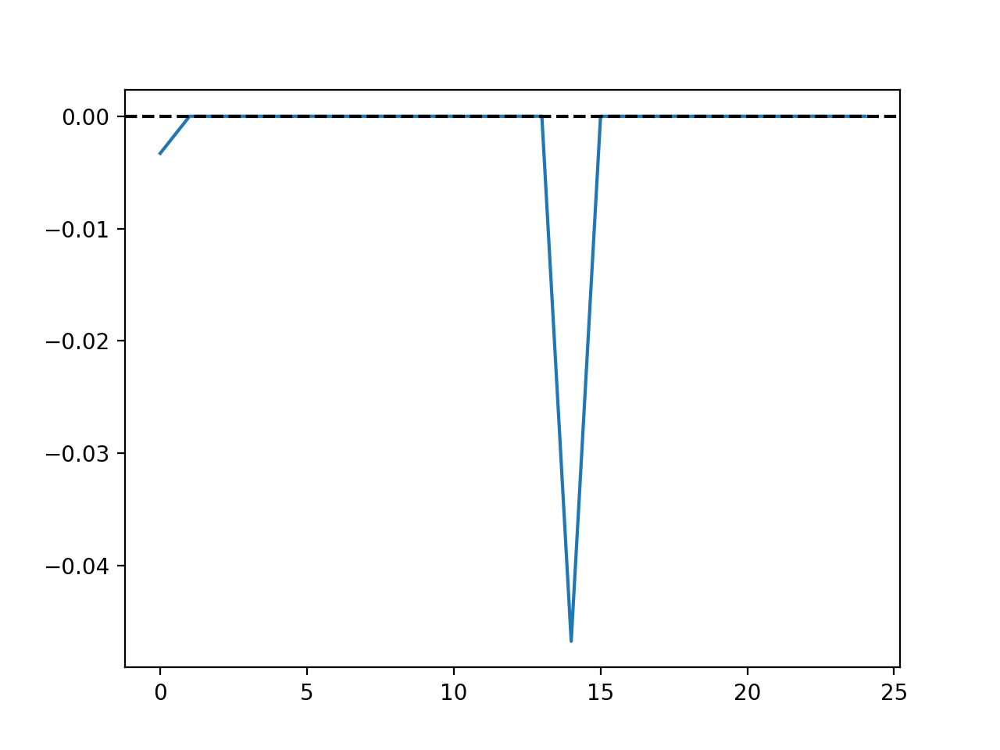

In [472]:
plt.figure()
plt.plot(linreg.coef_)
plt.axhline(0,c='k',linestyle='dashed')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


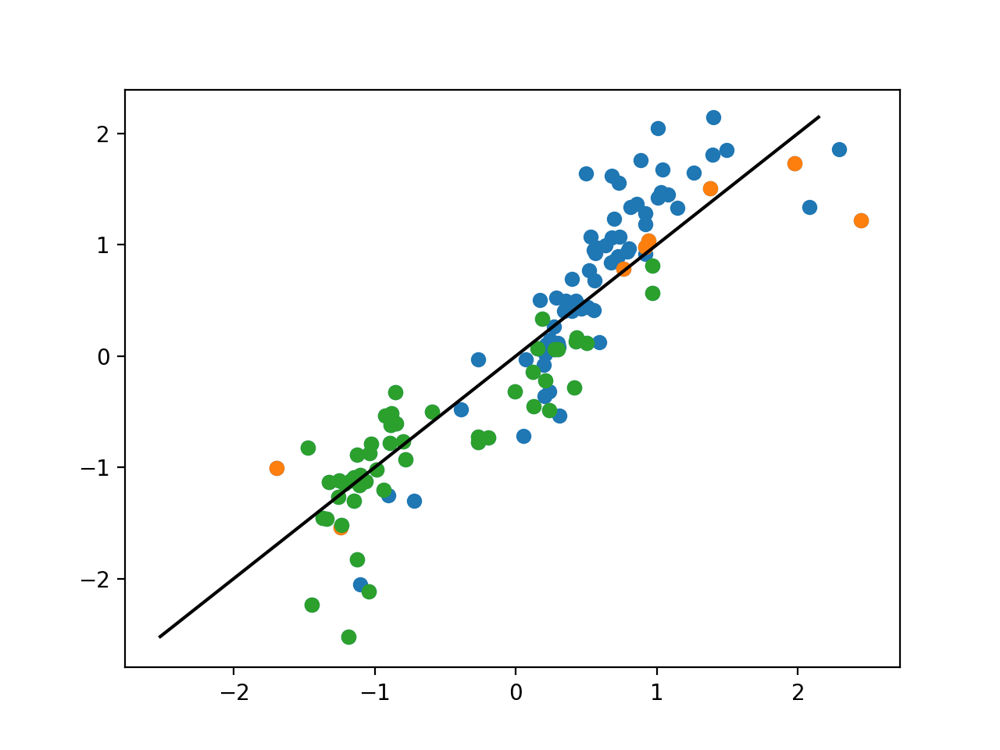

In [517]:
plt.figure()
plt.scatter(linreg.predict(X),y)
plt.scatter(linreg.predict(X)[low_sst_pv],y[low_sst_pv])
plt.scatter(linreg.predict(X)[high_sst_pv],y[high_sst_pv])
mn,mx = y.min(),y.max()
plt.plot((mn,mx),(mn,mx),c='k')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


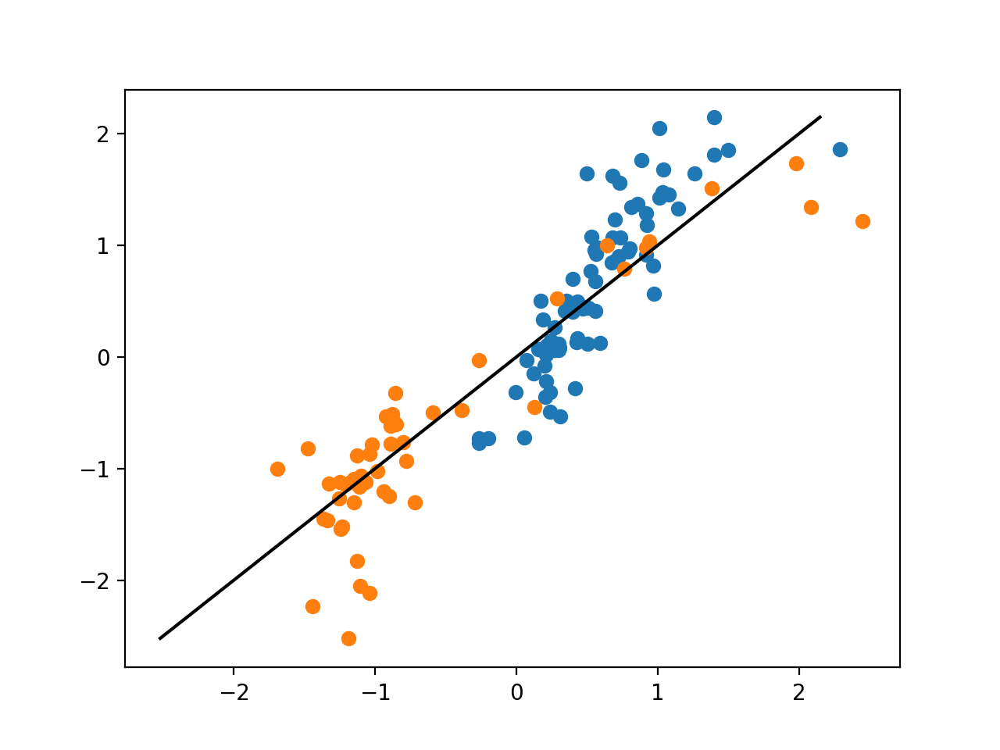

In [518]:
plt.figure()
plt.scatter(linreg.predict(X)[low_ff],y[low_ff])
plt.scatter(linreg.predict(X)[high_ff],y[high_ff])
mn,mx = y.min(),y.max()
plt.plot((mn,mx),(mn,mx),c='k')

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


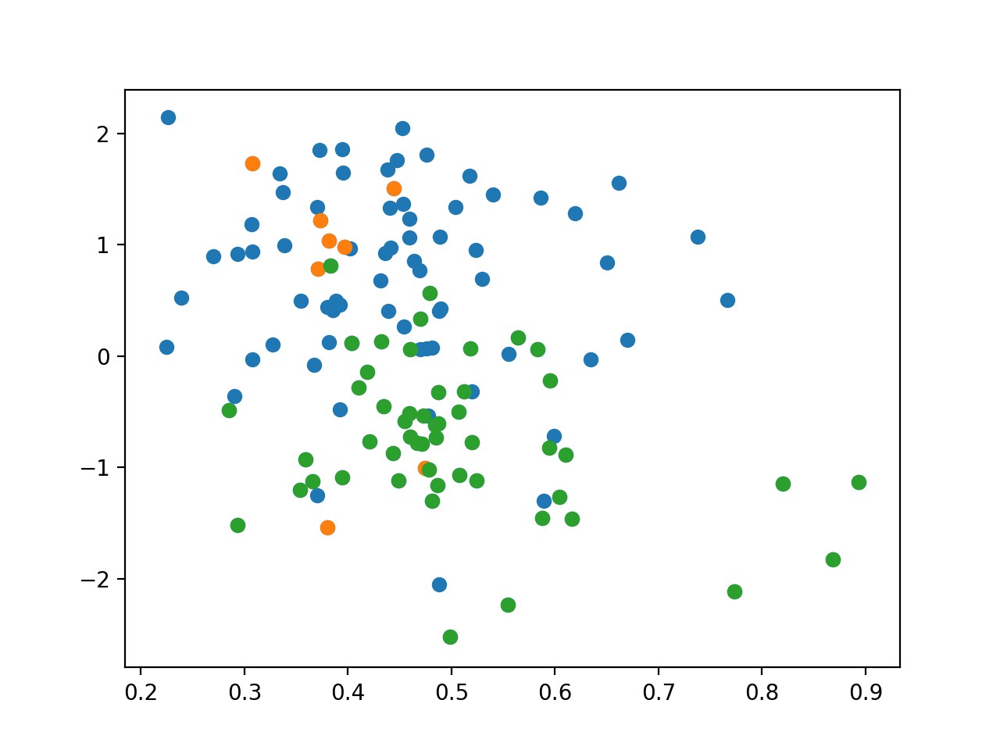

In [522]:
plt.figure()
plt.scatter(Ks[lkat][:,1]-Ks[lkat][:,3],y)
plt.scatter((Ks[lkat][:,1]-Ks[lkat][:,3])[low_sst_pv],y[low_sst_pv])
plt.scatter((Ks[lkat][:,1]-Ks[lkat][:,3])[high_sst_pv],y[high_sst_pv])
# plt.scatter(Ks[lkat][:,3],y)
# plt.scatter((Ks[lkat][:,3])[low_sst_pv],y[low_sst_pv])
# plt.scatter((Ks[lkat][:,3])[high_sst_pv],y[high_sst_pv])
mn,mx = y.min(),y.max()
# plt.plot((mn,mx),(mn,mx),c='k')


In [523]:
print(np.corrcoef(Ks[lkat][:,1],y)[0,1])
print(np.corrcoef(-Ks[lkat][:,3],y)[0,1])
print(np.corrcoef(Ks[lkat][:,1]-Ks[lkat][:,3],y)[0,1])


-0.315567104524197
0.15621312717619815
-0.2918231140487479


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


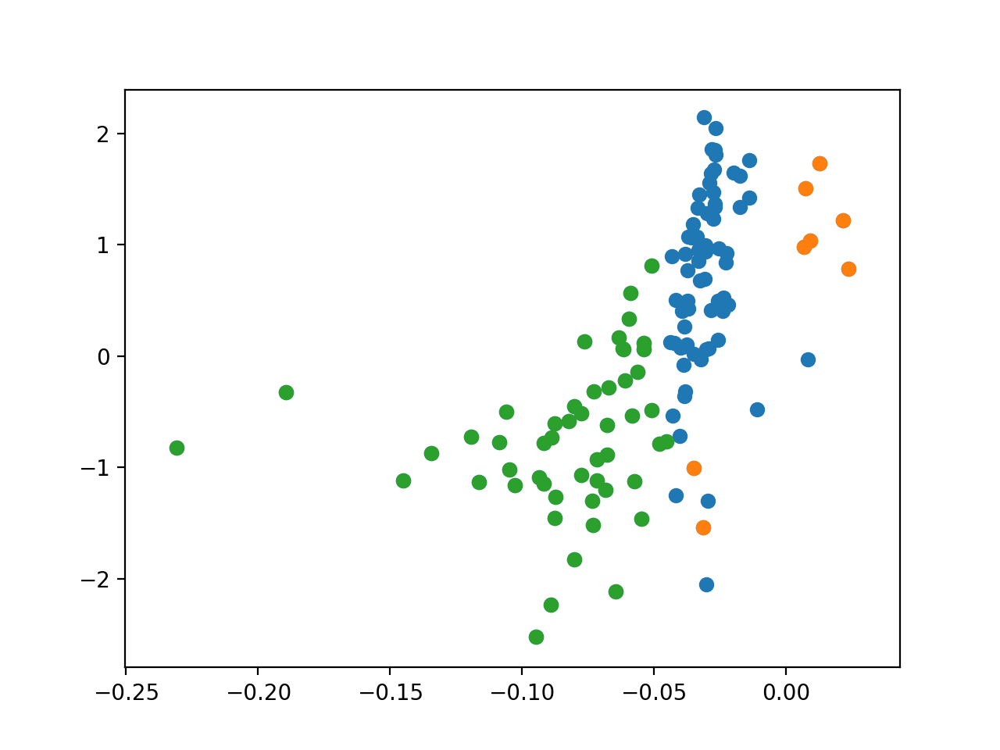

In [524]:
plt.figure()
plt.scatter(Wmys[lkat][:,1,0]-Wmys[lkat][:,1,3],y)
plt.scatter(Wmys[lkat][:,1,0][low_sst_pv]-Wmys[lkat][:,1,3][low_sst_pv],y[low_sst_pv])
plt.scatter(Wmys[lkat][:,1,0][high_sst_pv]-Wmys[lkat][:,1,3][high_sst_pv],y[high_sst_pv])
# plt.scatter(Wmys[lkat][:,1,3],y)
mn,mx = y.min(),y.max()
# plt.plot((mn,mx),(mn,mx),c='k')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


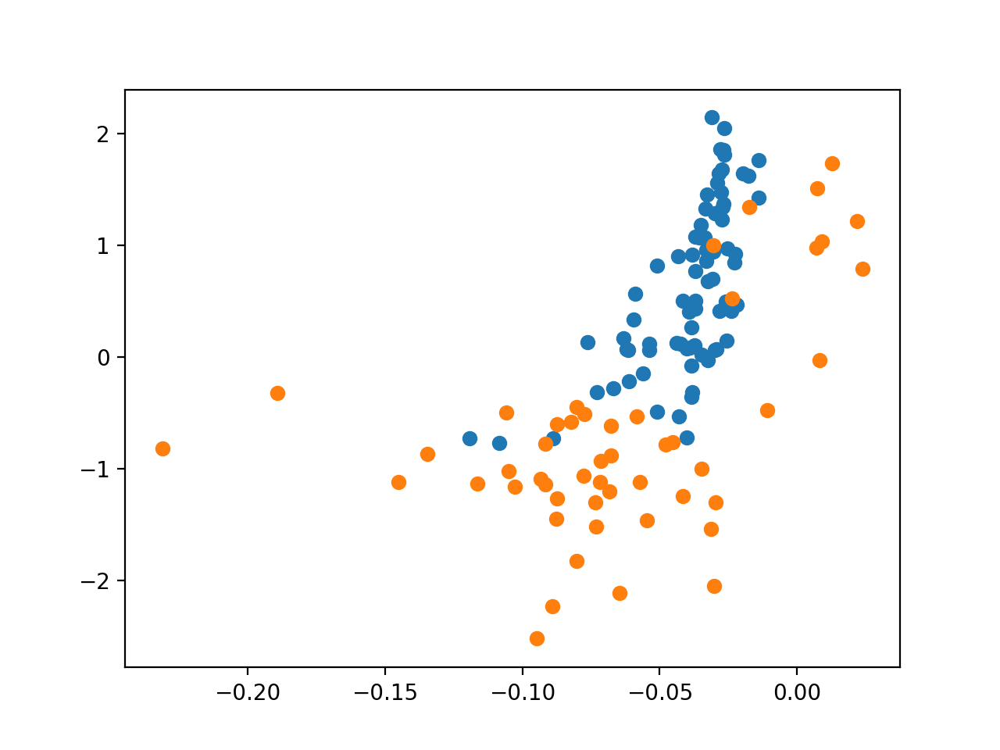

In [525]:
plt.figure()
plt.scatter(Wmys[lkat][:,1,0][low_ff]-Wmys[lkat][:,1,3][low_ff],y[low_ff])
plt.scatter(Wmys[lkat][:,1,0][high_ff]-Wmys[lkat][:,1,3][high_ff],y[high_ff])
# plt.scatter(Wmys[lkat][:,1,3],y)
mn,mx = y.min(),y.max()
# plt.plot((mn,mx),(mn,mx),c='k')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


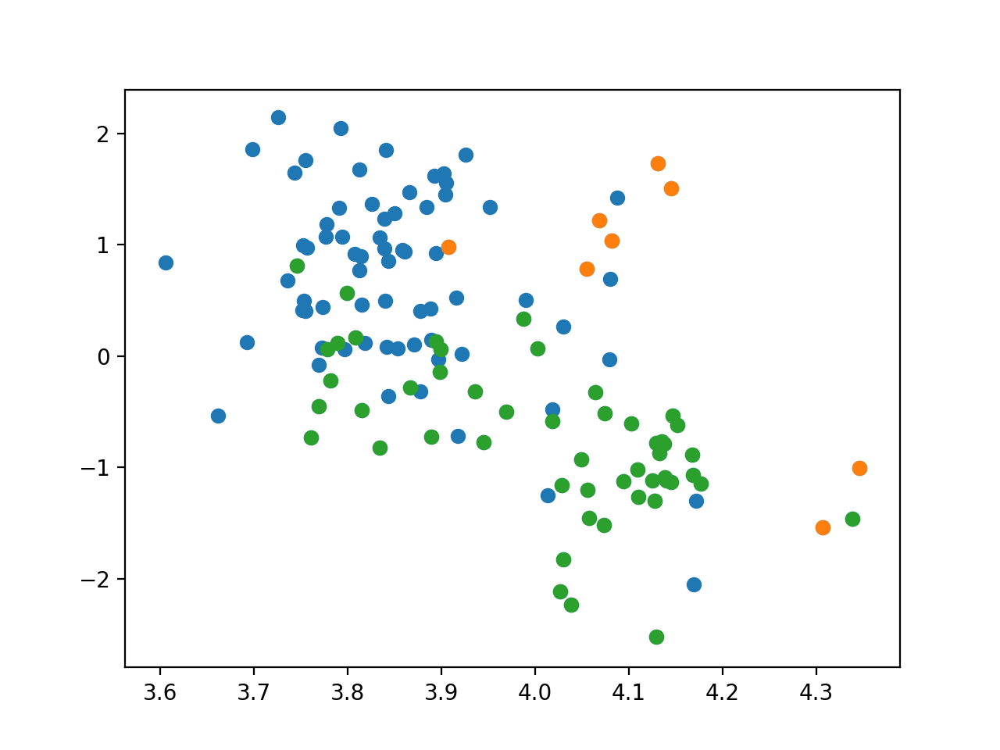

In [526]:
plt.figure()
plt.scatter(Wmys[lkat][:,0,0],y)
plt.scatter(Wmys[lkat][:,0,0][low_sst_pv],y[low_sst_pv])
plt.scatter(Wmys[lkat][:,0,0][high_sst_pv],y[high_sst_pv])
# plt.scatter(Wmys[lkat][:,1,3],y)
mn,mx = y.min(),y.max()
# plt.plot((mn,mx),(mn,mx),c='k')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


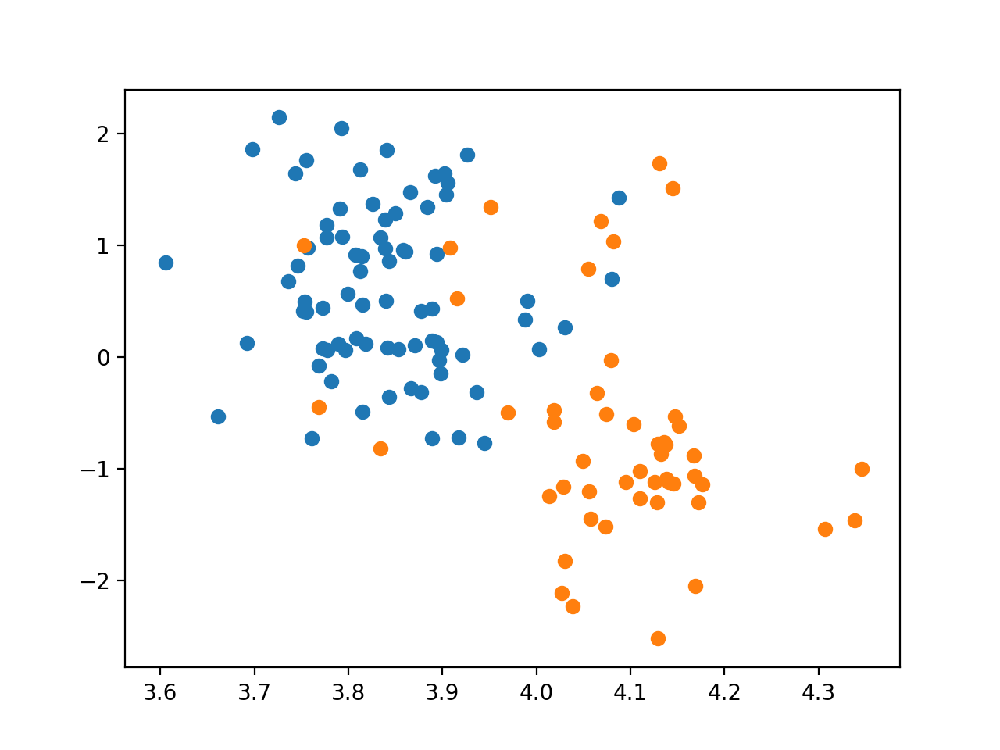

In [530]:
plt.figure()
plt.scatter(Wmys[lkat][:,0,0][low_ff],y[low_ff])
plt.scatter(Wmys[lkat][:,0,0][high_ff],y[high_ff])
# plt.scatter(Wmys[lkat][:,1,3],y)
mn,mx = y.min(),y.max()
# plt.plot((mn,mx),(mn,mx),c='k')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


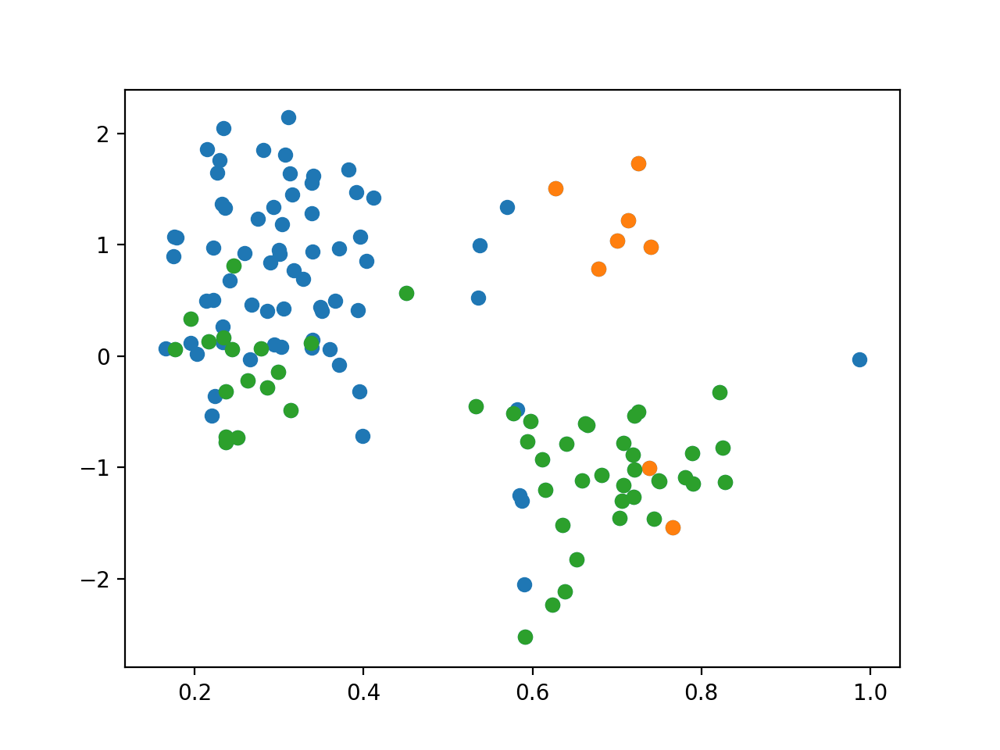

In [531]:
plt.figure()
plt.scatter(Wmxs[lkat][:,0,0],y)
plt.scatter(Wmxs[lkat][:,0,0][low_sst_pv],y[low_sst_pv])
plt.scatter(Wmxs[lkat][:,0,0][high_sst_pv],y[high_sst_pv])
# plt.scatter(Wmys[lkat][:,1,3],y)
mn,mx = y.min(),y.max()
# plt.plot((mn,mx),(mn,mx),c='k')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


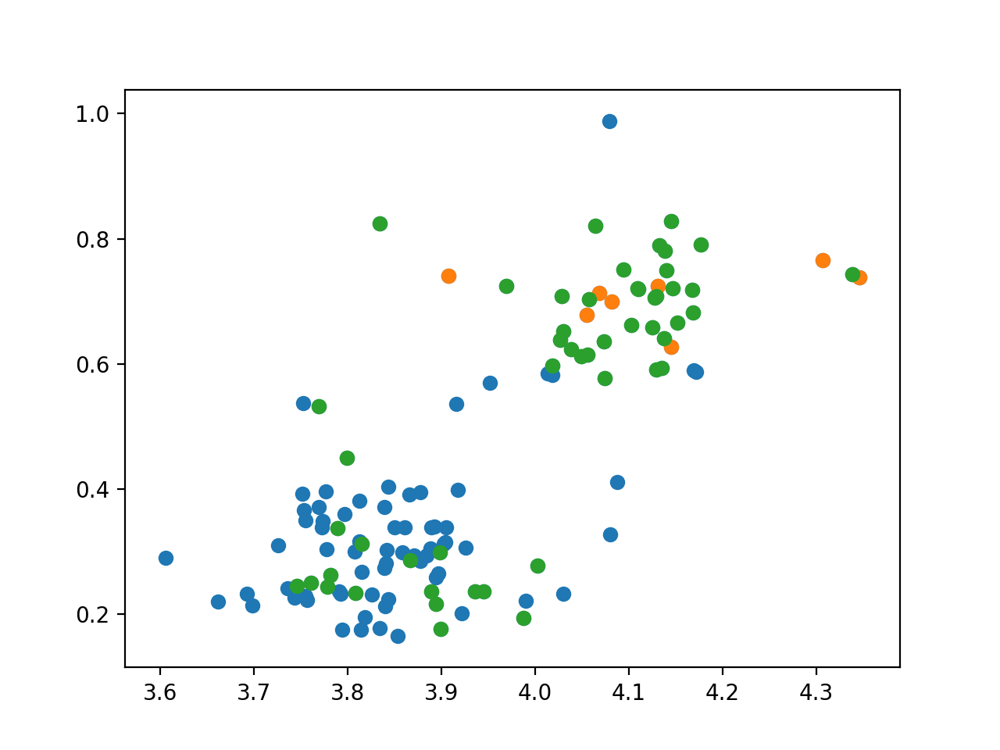

In [529]:
plt.figure()
plt.scatter(Wmys[lkat][:,0,0],Wmxs[lkat][:,0,0])
plt.scatter(Wmys[lkat][:,0,0][low_sst_pv],Wmxs[lkat][:,0,0][low_sst_pv])
plt.scatter(Wmys[lkat][:,0,0][high_sst_pv],Wmxs[lkat][:,0,0][high_sst_pv])
# plt.scatter(Wmys[lkat][:,1,3],y)
mn,mx = y.min(),y.max()
# plt.plot((mn,mx),(mn,mx),c='k')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


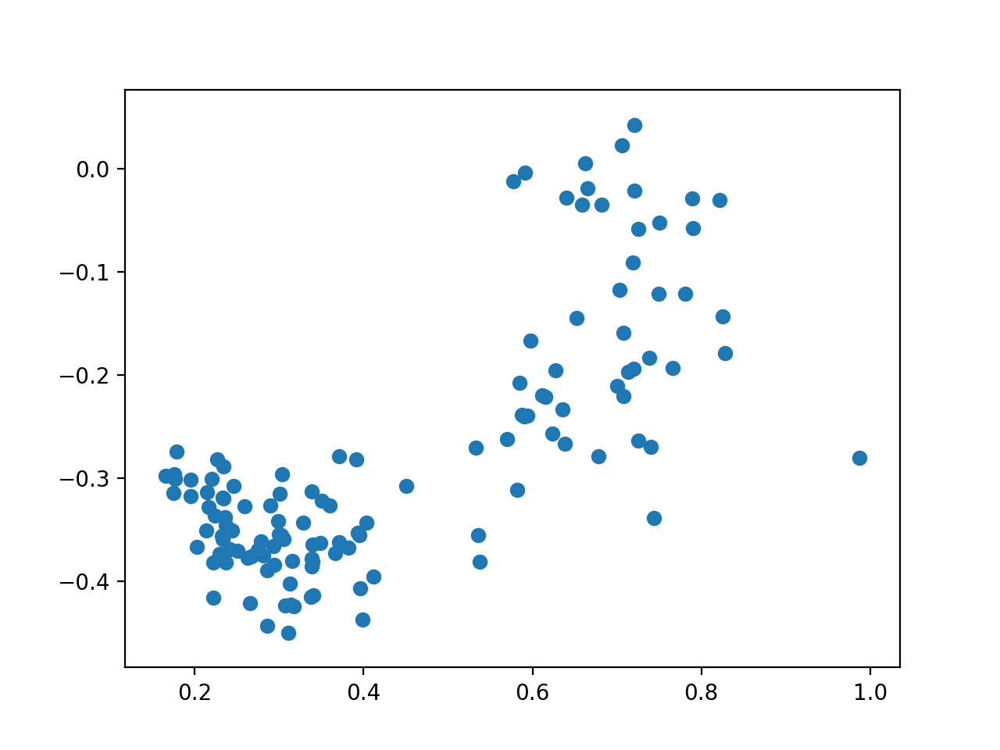

In [532]:
plt.figure()
plt.scatter(Wmxs[lkat][:,0,0],Wmxs[lkat][:,1,0])
# plt.scatter(Wmxs[lkat][:,0,0][low_sst_pv],y[low_sst_pv])
# plt.scatter(Wmxs[lkat][:,0,0][high_sst_pv],y[high_sst_pv])
# plt.scatter(Wmys[lkat][:,1,3],y)
mn,mx = y.min(),y.max()
# plt.plot((mn,mx),(mn,mx),c='k')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


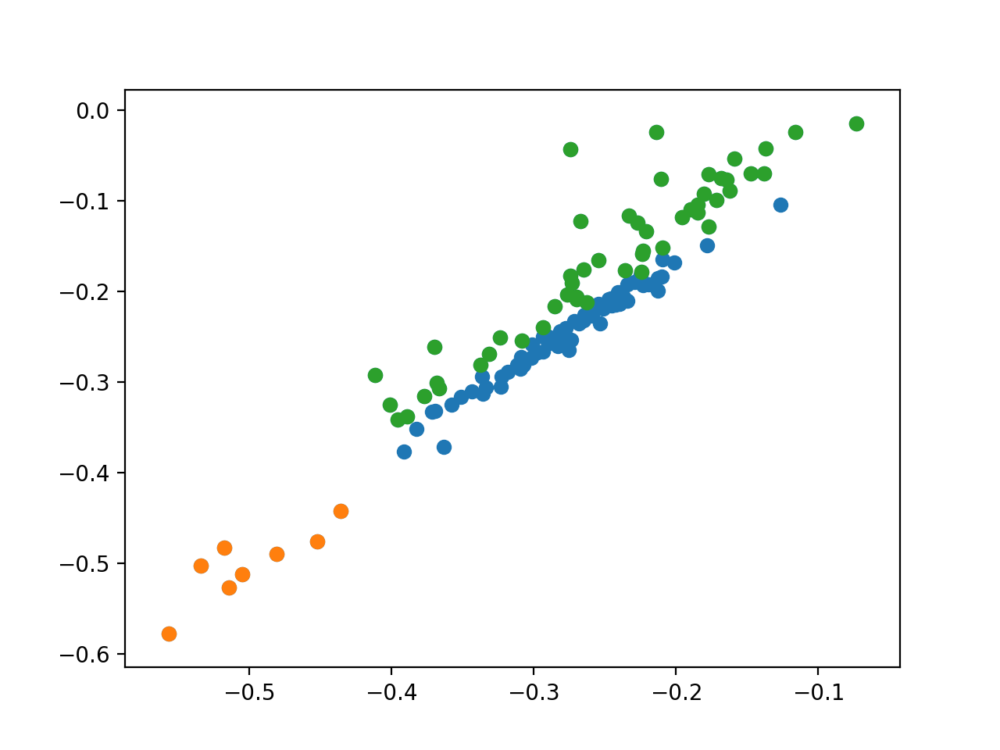

In [533]:
plt.figure()
plt.scatter(Wmys[lkat][:,1,0],Wmys[lkat][:,1,3])
plt.scatter(Wmys[lkat][:,1,0][low_sst_pv],Wmys[lkat][:,1,3][low_sst_pv])
plt.scatter(Wmys[lkat][:,1,0][high_sst_pv],Wmys[lkat][:,1,3][high_sst_pv])

In [575]:
nfits = lkat.sum()
shapes = [Wmys.shape[1:],Wmxs.shape[1:],Ks.shape[1:]]
X = np.concatenate((Wmys[lkat].reshape((nfits,-1)),Wmxs[lkat].reshape((nfits,-1)),Ks[lkat].reshape((nfits,-1))),axis=1)
# X = Ks[lkat].reshape((nfits,-1))
X = sst.zscore(X,axis=0)
gd = ~np.isnan(X.sum(0))
X = X[:,gd]
# y = np.abs(couplings[lkat,:,:,8,0] - couplings_pcpv_fixed[lkat,:,:,8,0]).mean(1).mean(1)
y = np.abs(couplings[lkat,:,:,8,0] - couplings_fixed[lkat,:,:,8,0,1]).mean(1).mean(1)

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2419: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd


In [576]:
linreg = sklm.Lasso(alpha=0.05).fit(X,y)


In [577]:
coefs = np.nan*np.ones_like(gd)
coefs[gd] = linreg.coef_
coef_list = calnet.utils.parse_thing(coefs,shapes)


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


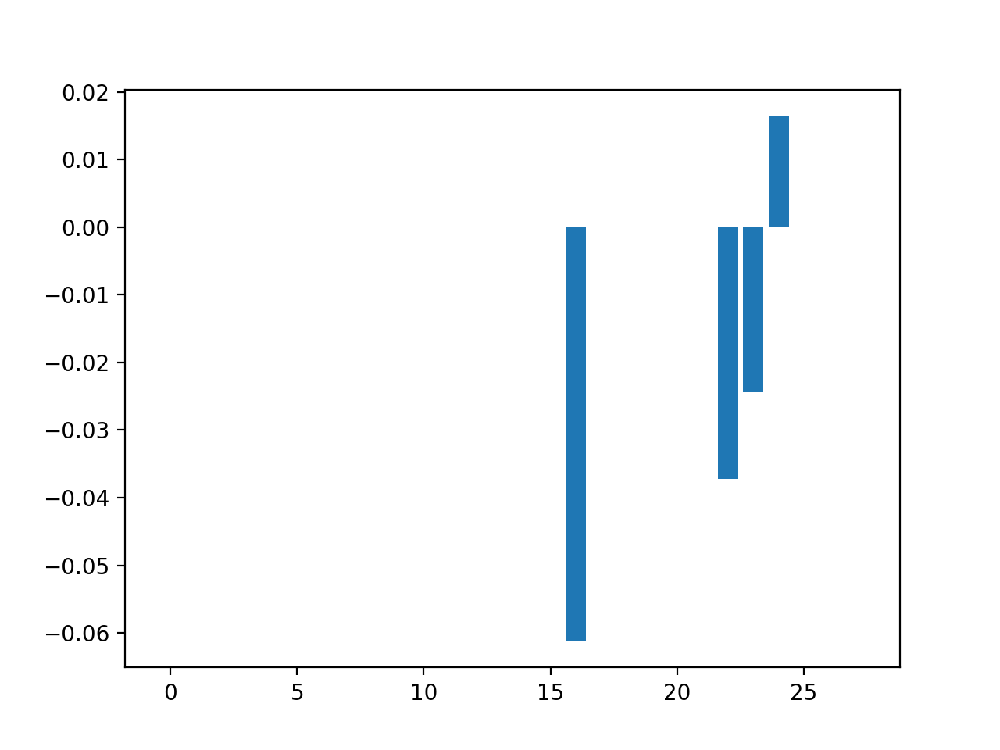

<BarContainer object of 28 artists>

In [578]:
plt.figure()
plt.bar(np.arange(coefs.size),coefs)


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


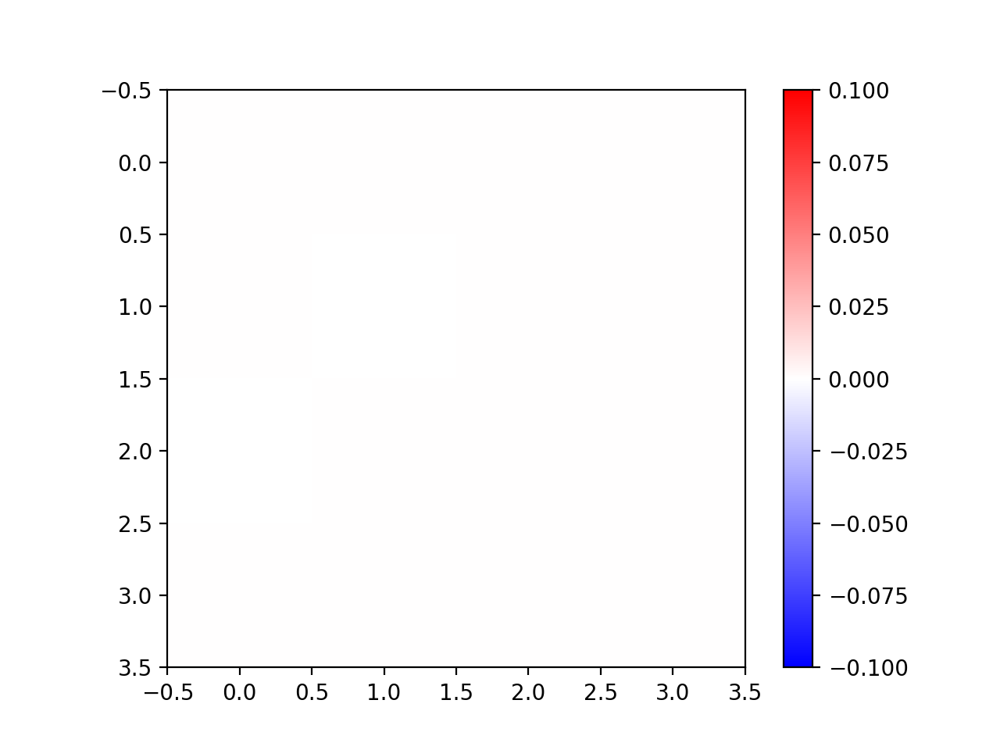

In [580]:
plt.figure()
from importlib import reload
reload(ut)
ut.imshow_hot_cold(coef_list[0])
plt.colorbar()


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


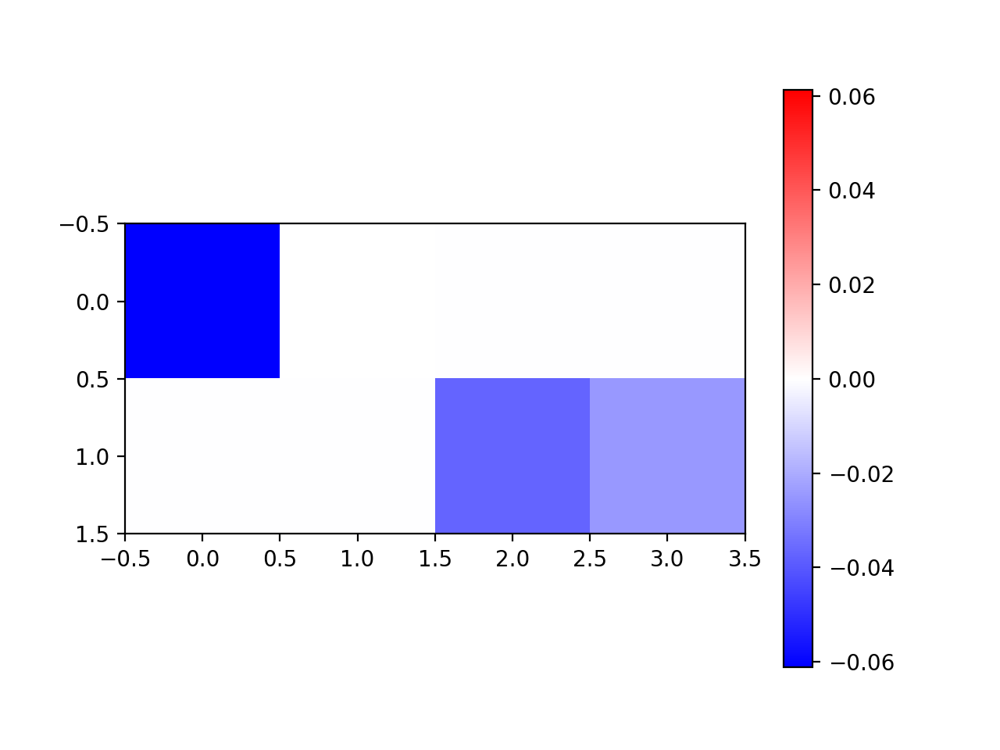

In [579]:
plt.figure()
ut.imshow_hot_cold(coef_list[1])
plt.colorbar()


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


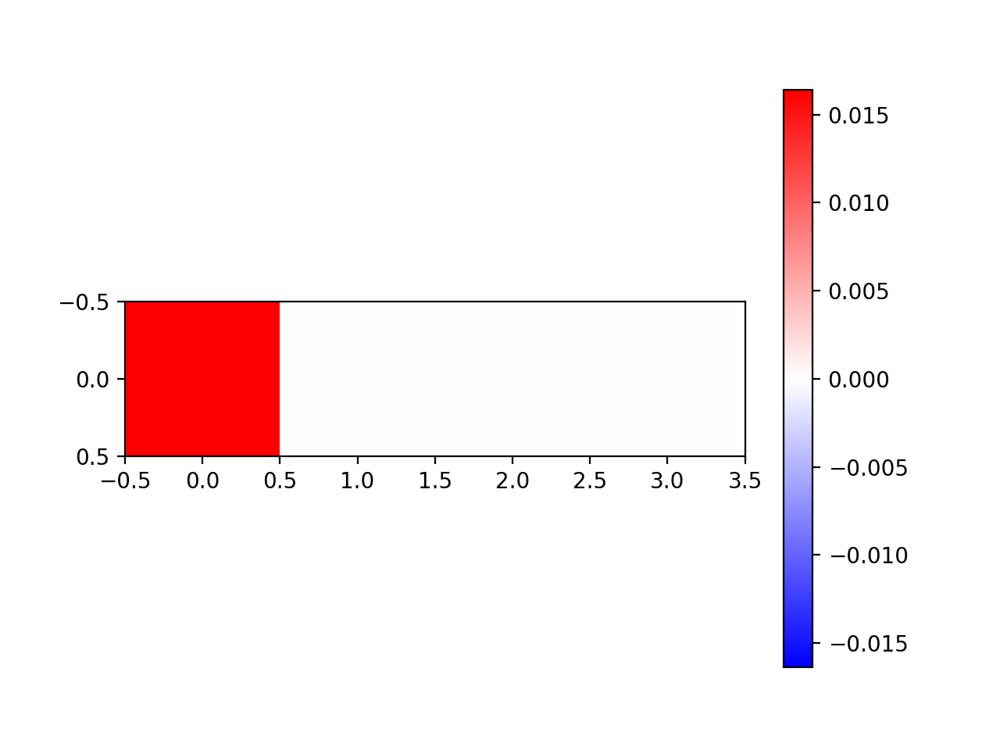

In [581]:
plt.figure()
ut.imshow_hot_cold(coef_list[2][np.newaxis])
plt.colorbar()

In [565]:
low_sst_pv = (Wmys[lkat][:,1,3] < -0.4)
high_sst_pv = (Wmys[lkat][:,1,0]-Wmys[lkat][:,1,3] < -0.045)
low_ff = (Wmxs[lkat][:,0,0] < 0.5)
high_ff = ~low_ff

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


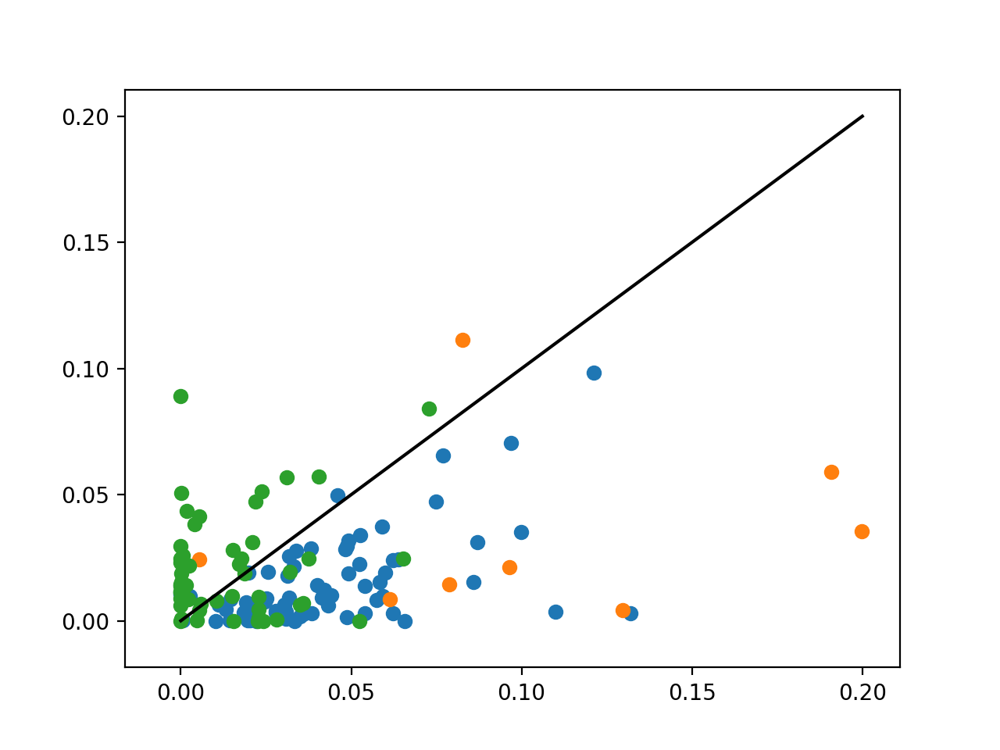

In [582]:
plt.figure()
plt.scatter(Ks[lkat][:,0][~low_sst_pv & ~high_sst_pv],Ks[lkat][:,3][~low_sst_pv & ~high_sst_pv])
plt.scatter(Ks[lkat][:,0][low_sst_pv],Ks[lkat][:,3][low_sst_pv])
plt.scatter(Ks[lkat][:,0][high_sst_pv],Ks[lkat][:,3][high_sst_pv])
plt.plot((0,0.2),(0,0.2),c='k')

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


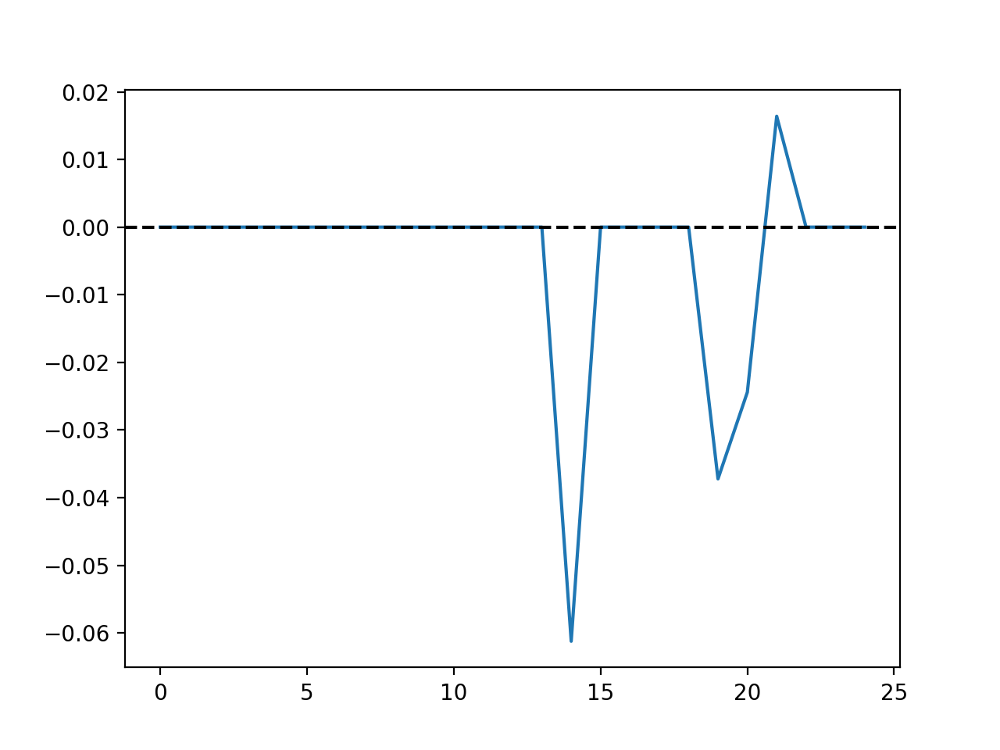

In [583]:
plt.figure()
plt.plot(linreg.coef_)
plt.axhline(0,c='k',linestyle='dashed')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


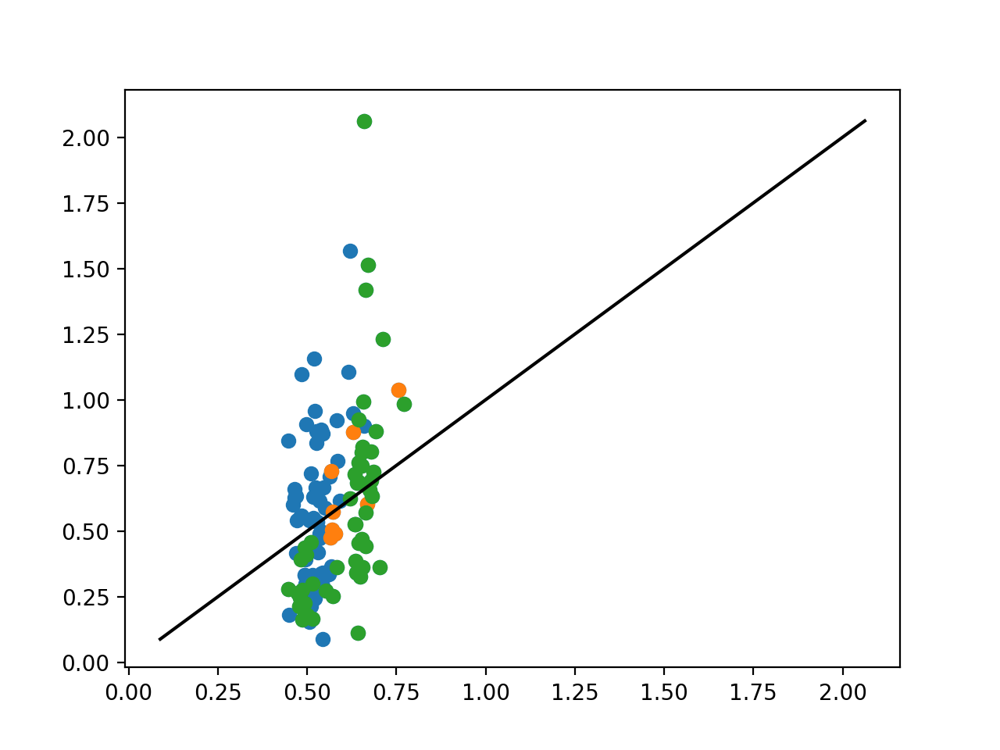

In [567]:
plt.figure()
plt.scatter(linreg.predict(X),y)
plt.scatter(linreg.predict(X)[low_sst_pv],y[low_sst_pv])
plt.scatter(linreg.predict(X)[high_sst_pv],y[high_sst_pv])
mn,mx = y.min(),y.max()
plt.plot((mn,mx),(mn,mx),c='k')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


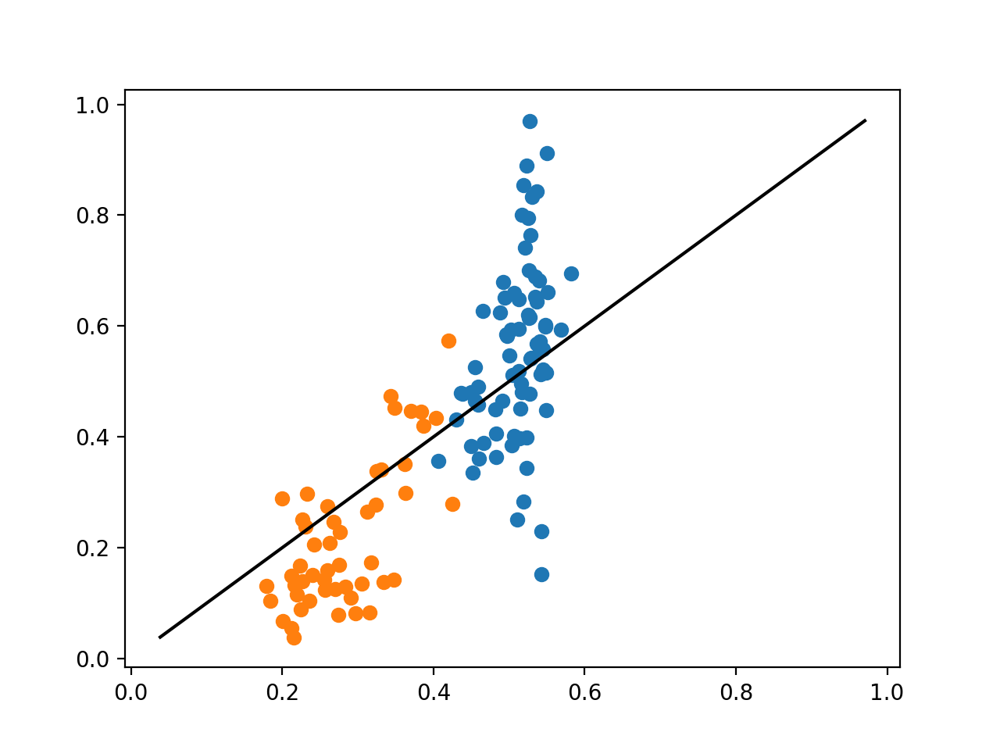

In [584]:
plt.figure()
plt.scatter(linreg.predict(X)[low_ff],y[low_ff])
plt.scatter(linreg.predict(X)[high_ff],y[high_ff])
mn,mx = y.min(),y.max()
plt.plot((mn,mx),(mn,mx),c='k')

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


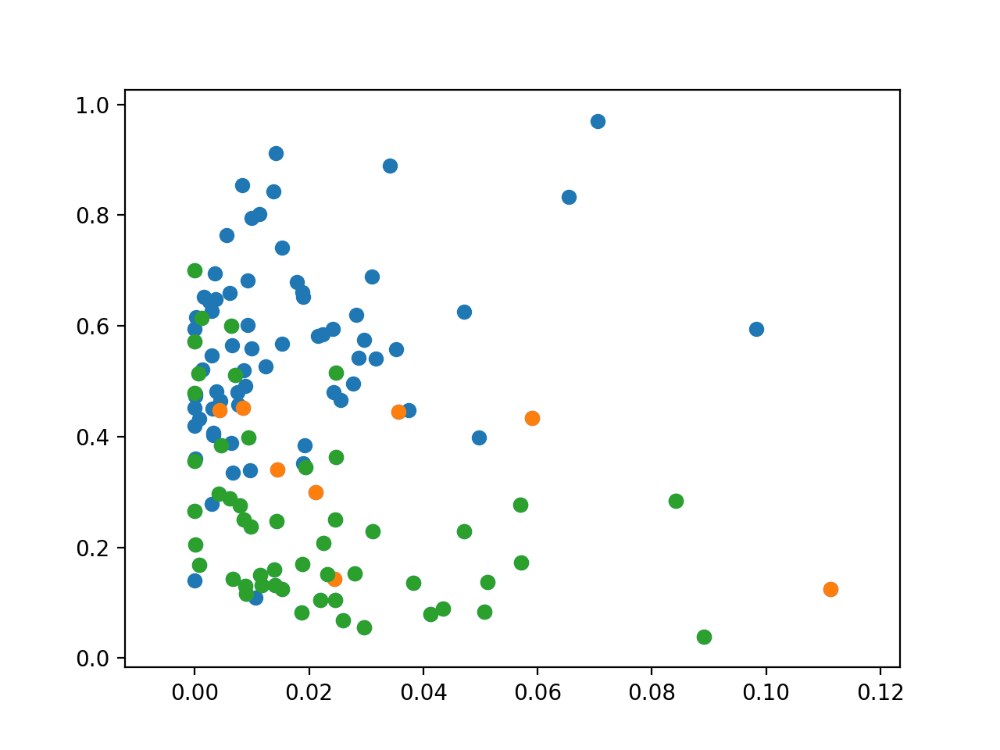

In [585]:
plt.figure()
# plt.scatter(Ks[lkat][:,1]-Ks[lkat][:,3],y)
# plt.scatter((Ks[lkat][:,1]-Ks[lkat][:,3])[low_sst_pv],y[low_sst_pv])
# plt.scatter((Ks[lkat][:,1]-Ks[lkat][:,3])[high_sst_pv],y[high_sst_pv])
plt.scatter(Ks[lkat][:,3],y)
plt.scatter((Ks[lkat][:,3])[low_sst_pv],y[low_sst_pv])
plt.scatter((Ks[lkat][:,3])[high_sst_pv],y[high_sst_pv])
mn,mx = y.min(),y.max()
# plt.plot((mn,mx),(mn,mx),c='k')


In [571]:
print(np.corrcoef(Ks[lkat][:,1],y)[0,1])
print(np.corrcoef(-Ks[lkat][:,3],y)[0,1])
print(np.corrcoef(Ks[lkat][:,1]-Ks[lkat][:,3],y)[0,1])


0.21483444441305502
-0.2576267933781217
0.17233428150145688


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


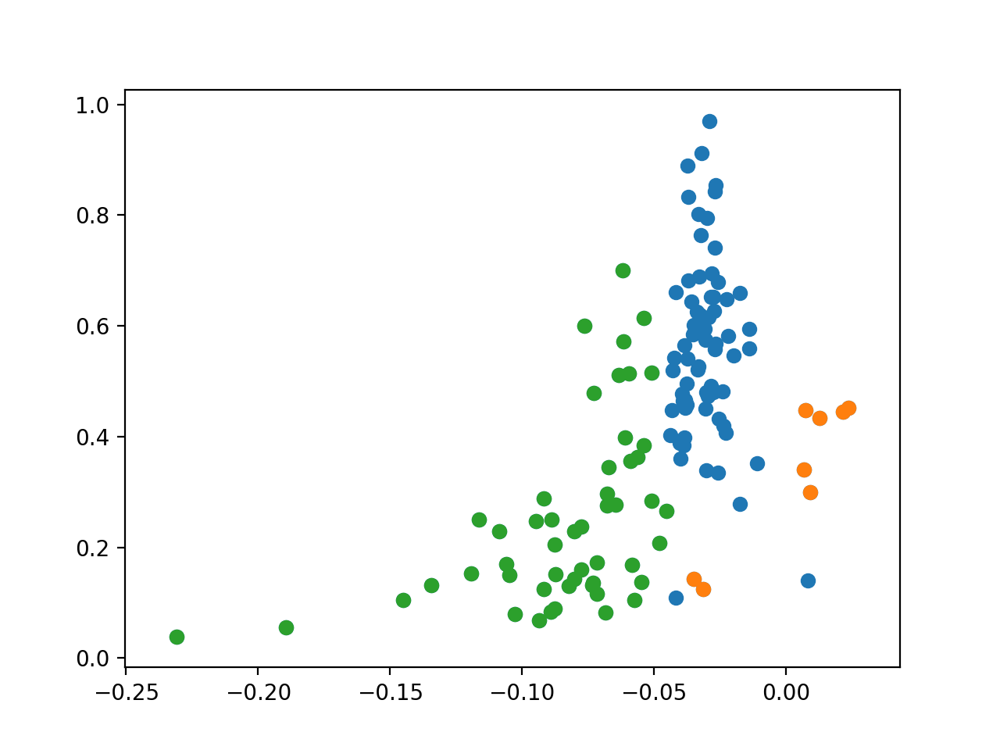

In [586]:
plt.figure()
plt.scatter(Wmys[lkat][:,1,0]-Wmys[lkat][:,1,3],y)
plt.scatter(Wmys[lkat][:,1,0][low_sst_pv]-Wmys[lkat][:,1,3][low_sst_pv],y[low_sst_pv])
plt.scatter(Wmys[lkat][:,1,0][high_sst_pv]-Wmys[lkat][:,1,3][high_sst_pv],y[high_sst_pv])
# plt.scatter(Wmys[lkat][:,1,3],y)
mn,mx = y.min(),y.max()
# plt.plot((mn,mx),(mn,mx),c='k')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


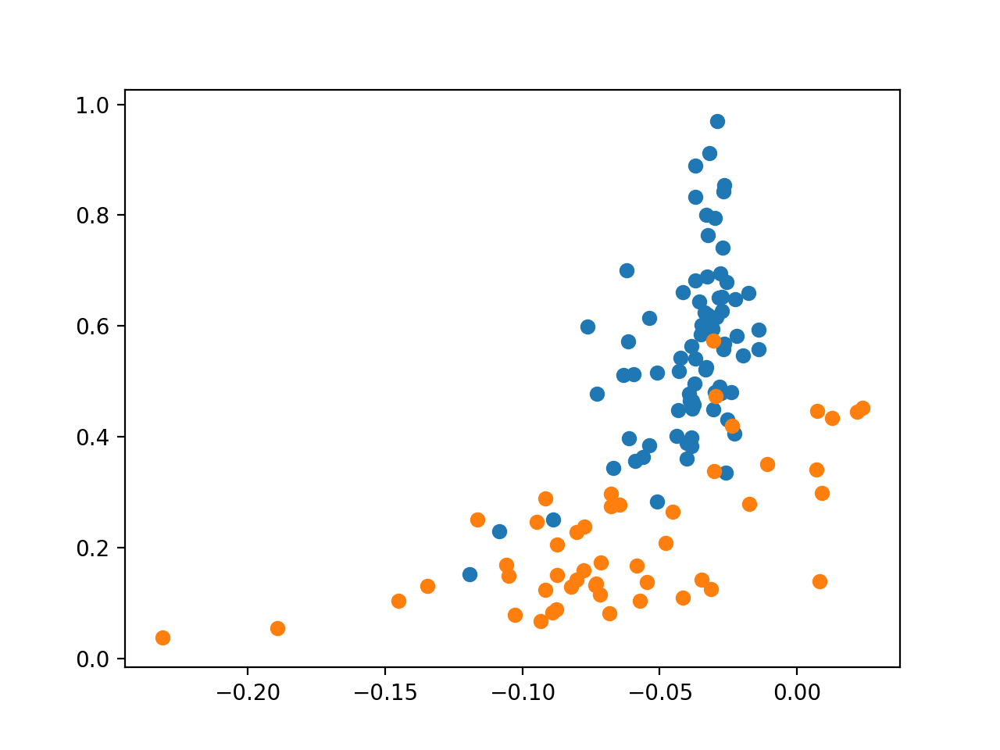

In [587]:
plt.figure()
plt.scatter(Wmys[lkat][:,1,0][low_ff]-Wmys[lkat][:,1,3][low_ff],y[low_ff])
plt.scatter(Wmys[lkat][:,1,0][high_ff]-Wmys[lkat][:,1,3][high_ff],y[high_ff])
# plt.scatter(Wmys[lkat][:,1,3],y)
mn,mx = y.min(),y.max()
# plt.plot((mn,mx),(mn,mx),c='k')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


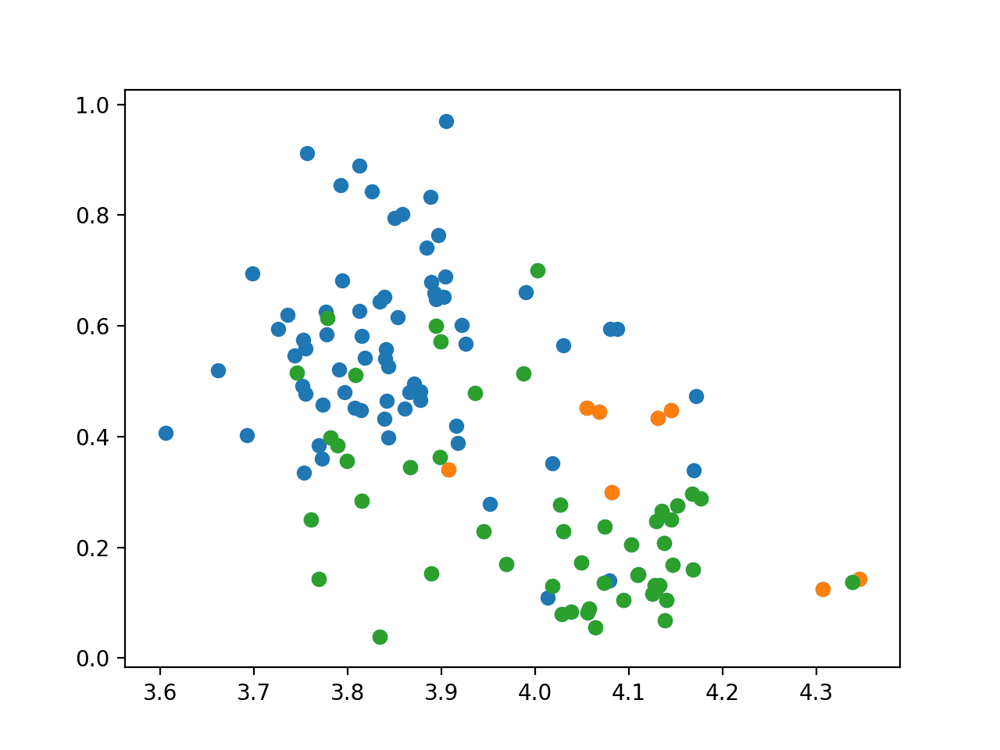

In [588]:
plt.figure()
plt.scatter(Wmys[lkat][:,0,0],y)
plt.scatter(Wmys[lkat][:,0,0][low_sst_pv],y[low_sst_pv])
plt.scatter(Wmys[lkat][:,0,0][high_sst_pv],y[high_sst_pv])
# plt.scatter(Wmys[lkat][:,1,3],y)
mn,mx = y.min(),y.max()
# plt.plot((mn,mx),(mn,mx),c='k')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


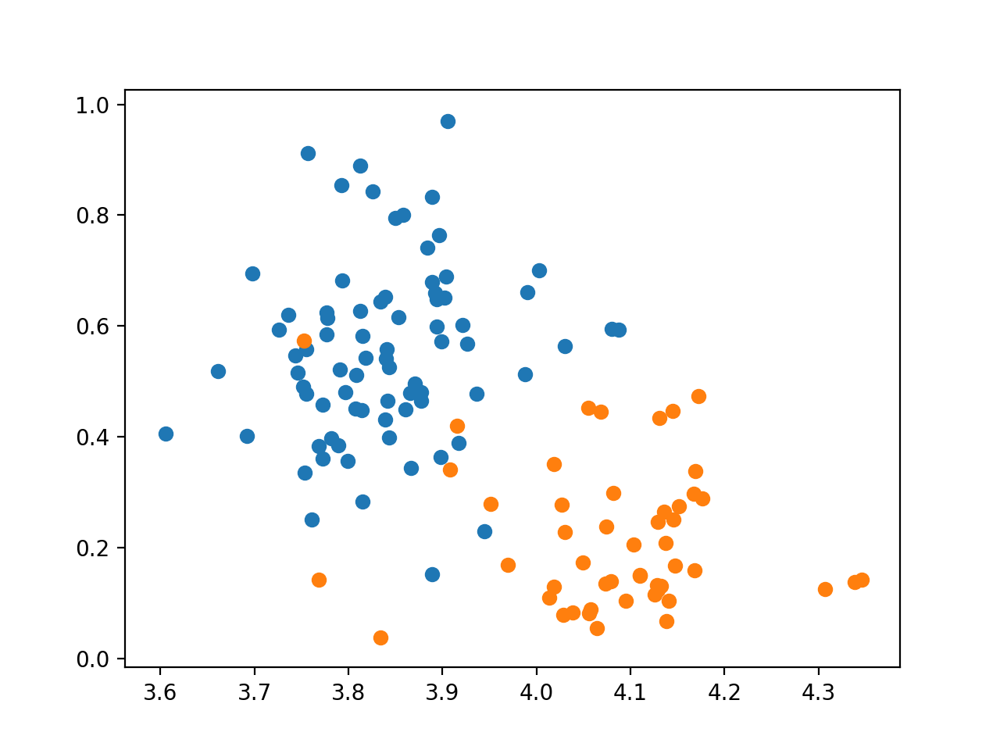

In [589]:
plt.figure()
plt.scatter(Wmys[lkat][:,0,0][low_ff],y[low_ff])
plt.scatter(Wmys[lkat][:,0,0][high_ff],y[high_ff])
# plt.scatter(Wmys[lkat][:,1,3],y)
mn,mx = y.min(),y.max()
# plt.plot((mn,mx),(mn,mx),c='k')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


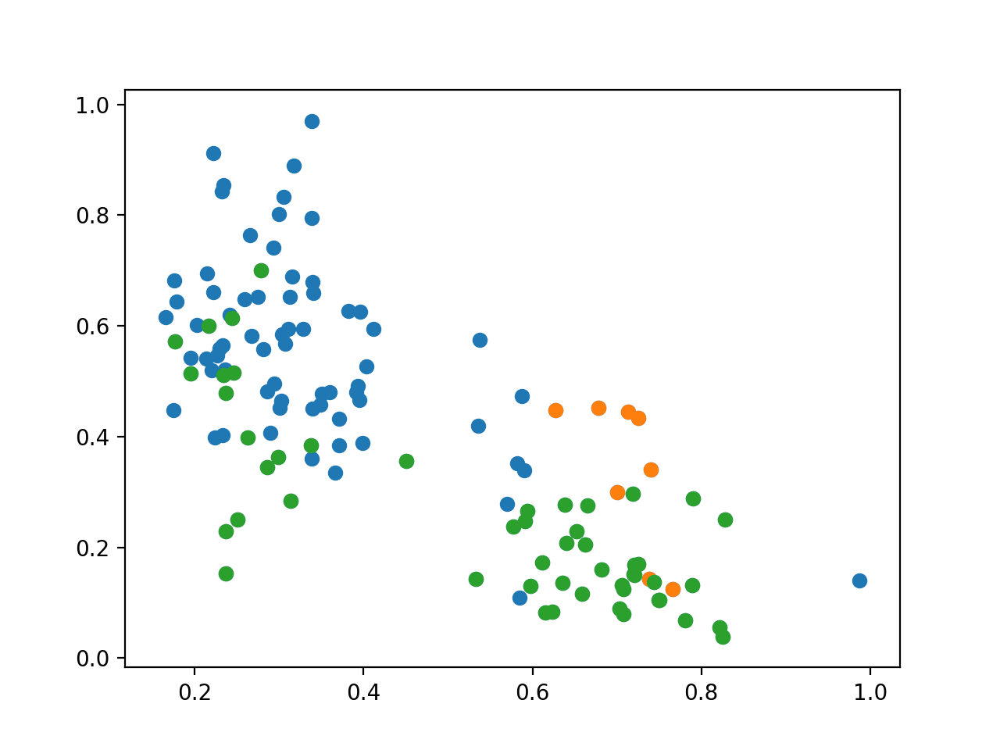

In [590]:
plt.figure()
plt.scatter(Wmxs[lkat][:,0,0],y)
plt.scatter(Wmxs[lkat][:,0,0][low_sst_pv],y[low_sst_pv])
plt.scatter(Wmxs[lkat][:,0,0][high_sst_pv],y[high_sst_pv])
# plt.scatter(Wmys[lkat][:,1,3],y)
mn,mx = y.min(),y.max()
# plt.plot((mn,mx),(mn,mx),c='k')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


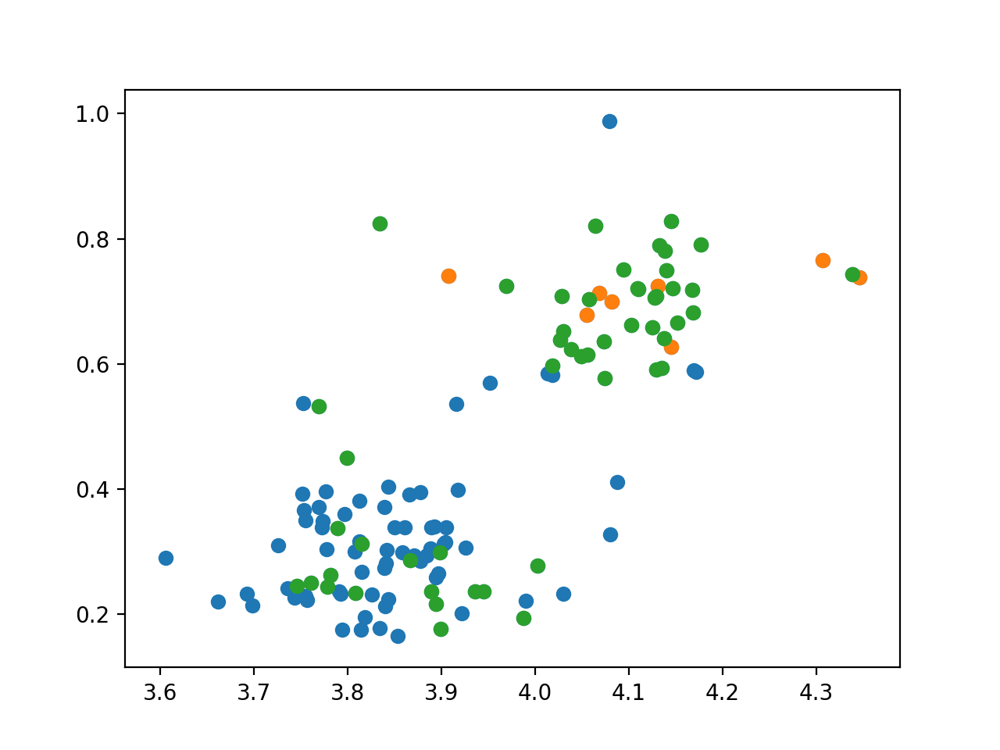

In [591]:
plt.figure()
plt.scatter(Wmys[lkat][:,0,0],Wmxs[lkat][:,0,0])
plt.scatter(Wmys[lkat][:,0,0][low_sst_pv],Wmxs[lkat][:,0,0][low_sst_pv])
plt.scatter(Wmys[lkat][:,0,0][high_sst_pv],Wmxs[lkat][:,0,0][high_sst_pv])
# plt.scatter(Wmys[lkat][:,1,3],y)
mn,mx = y.min(),y.max()
# plt.plot((mn,mx),(mn,mx),c='k')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


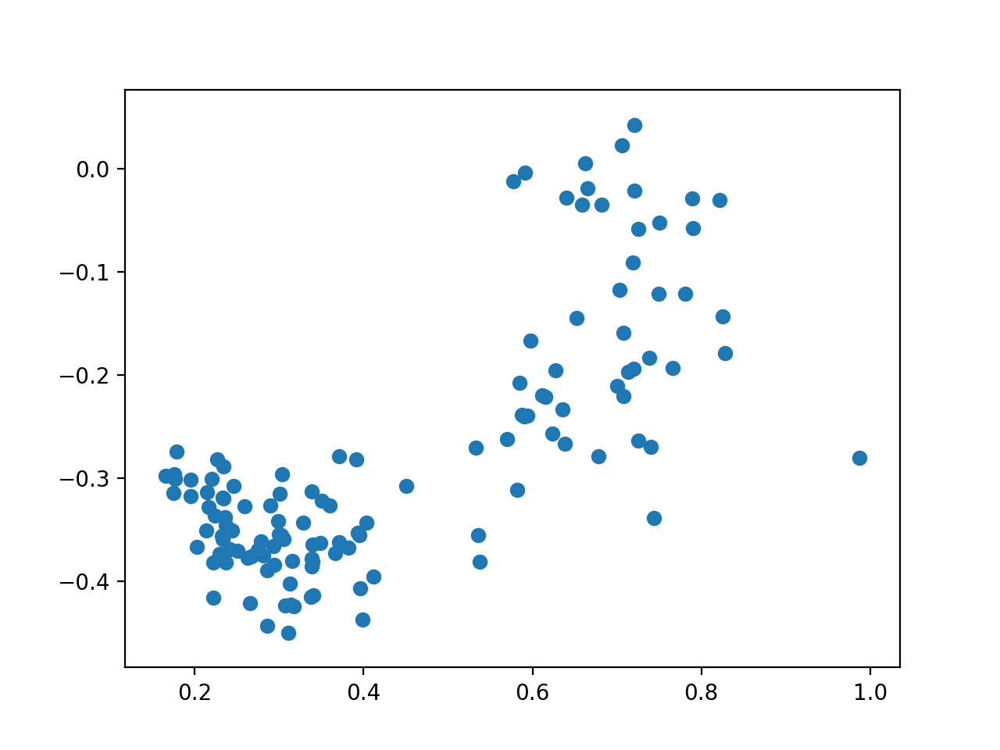

In [500]:
plt.figure()
plt.scatter(Wmxs[lkat][:,0,0],Wmxs[lkat][:,1,0])
# plt.scatter(Wmxs[lkat][:,0,0][low_sst_pv],y[low_sst_pv])
# plt.scatter(Wmxs[lkat][:,0,0][high_sst_pv],y[high_sst_pv])
# plt.scatter(Wmys[lkat][:,1,3],y)
mn,mx = y.min(),y.max()
# plt.plot((mn,mx),(mn,mx),c='k')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


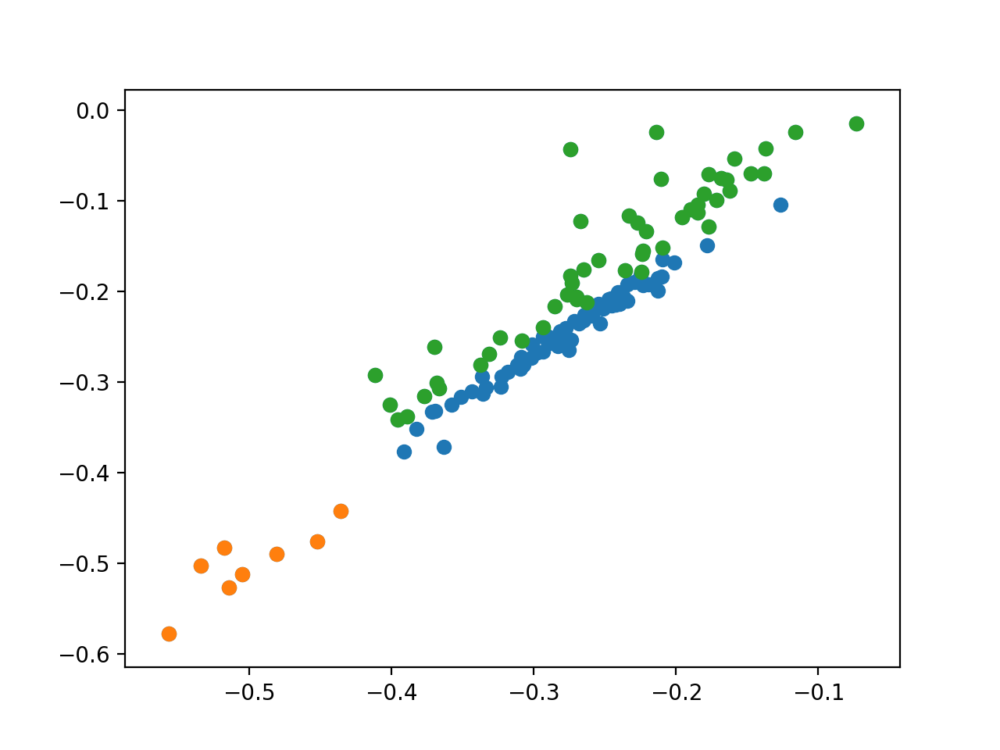

In [592]:
plt.figure()
plt.scatter(Wmys[lkat][:,1,0],Wmys[lkat][:,1,3])
plt.scatter(Wmys[lkat][:,1,0][low_sst_pv],Wmys[lkat][:,1,3][low_sst_pv])
plt.scatter(Wmys[lkat][:,1,0][high_sst_pv],Wmys[lkat][:,1,3][high_sst_pv])

In [806]:
weights_files = []

subfold = 'weights_200901i/'
plots_fold = basefold + 'fit_graphics/' + subfold
ut.mkdir(plots_fold)
weights_fold = basefold + 'weights/' + subfold
weights_files = weights_files + glob.glob(weights_fold+'*.npy')

subfold = 'weights_200902e/'
plots_fold = basefold + 'fit_graphics/' + subfold
ut.mkdir(plots_fold)
weights_fold = basefold + 'weights/' + subfold
weights_files = weights_files + glob.glob(weights_fold+'*.npy')

basefold = '/Users/dan/Documents/notebooks/mossing-PC/shared_data/calnet_data/'
subfold = 'weights_201010b/'
plots_fold = basefold + 'fit_graphics/' + subfold
ut.mkdir(plots_fold)
weights_fold = basefold + 'weights/' + subfold
weights_files = weights_files + glob.glob(weights_fold+'*.npy')

basefold = '/Users/dan/Documents/notebooks/mossing-PC/shared_data/calnet_data/'
subfold = 'weights_201011b/'
plots_fold = basefold + 'fit_graphics/' + subfold
ut.mkdir(plots_fold)
weights_fold = basefold + 'weights/' + subfold
weights_files = weights_files + glob.glob(weights_fold+'*.npy')

weights_files.sort()
# # weights_filenames = [s.split('/')[-1][:-4] for s in weights_files]


In [807]:
nT = 2
nfiles = len(weights_files)
Ts = np.nan*np.ones((nfiles,nQ*(nT-1)))
Ks = np.zeros((nfiles,nQ*(nS-1)))
Wmys = np.zeros((nfiles,nQ,nQ))
Wmxs = np.zeros((nfiles,nP,nQ))
s02s = np.zeros((nfiles,nQ))
YYs = np.zeros((nfiles,6,6,nQ*nS*nT))
XXs = np.zeros((nfiles,6,6,nP*nS*nT))
couplings = np.zeros((nfiles,6,6,nQ*nS*nT,nQ*nS*nT))
couplings_pcpv_fixed = np.zeros((nfiles,6,6,nQ*nS*nT,nQ*nS*nT))
couplings_fixed = np.zeros((nfiles,6,6,nQ*nS*nT,nQ*nS*nT,nQ))
Xcouplings = np.zeros((nfiles,6,6,nP*nS*nT,nQ*nS*nT))
losses = np.zeros((nfiles,))
ori = np.zeros((nfiles,),dtype='bool')
for iwt,weights_file in enumerate(weights_files):
    Wstar_dict = np.load(weights_file,allow_pickle=True)[()]
    Wmx,Wmy,Wsx,Wsy,s02,K,kappa,T,XX,XXp,Eta,Xi,h = Wstar_dict['as_list']
    if T.size:
        nT = 2
        slc = slice(None)
        slcX = slice(None)
        binind = np.ones((nQ*nS*nT,nQ*nS*nT),dtype='bool')
        binindX = np.ones((nP*nS*nT,nQ*nS*nT),dtype='bool')
        losses[iwt] = Wstar_dict['loss']
        ori[iwt] = 1
    else:
        nT = 1
        slc = [0,1,2,3,8,9,10,11]
        slcX = [0,1,4,5]
        
        binind1,binind2 = [np.zeros((nQ*nS*2,nQ*nS*2),dtype='bool') for ivar in range(2)]
        binind1[slc] = 1
        binind2[:,slc] = 1
        binind = np.logical_and(binind1, binind2)
        
        binindX1,binindX2 = [np.zeros((nP*nS*2,nQ*nS*2),dtype='bool') for ivar in range(2)]
        binindX1[slcX] = 1
        binindX2[:,slc] = 1
        binindX = np.logical_and(binindX1, binindX2)
        
        losses[iwt] = Wstar_dict['loss']*2
        ori[iwt] = 0
#     Wmx,Wmy,Wsx,Wsy,s02,K,kappa,T,XX,XXp,Eta,Xi,h1,h2 = Wstar_dict['as_list']
    WWmy = calnet.utils.gen_Weight_k_kappa_t(Wmy,K,kappa,T,nS=nS,nT=nT)
    WWmx = calnet.utils.gen_Weight_k_kappa_t(Wmx,K,kappa,T,nS=nS,nT=nT)
    tiled_s02 = np.tile(s02,nS*nT)
    
    all_phis = calnet.utils.fprime_miller_troyer(Eta,Xi**2+tiled_s02)
    for icelltype in range(nQ):
        mean_phi = np.mean(all_phis[:,icelltype::nQ])
        for istim in range(nN):
            iistim,jjstim = np.unravel_index(istim,(6,6))        
            these_phis = all_phis[istim].copy()#calnet.utils.fprime_miller_troyer(Eta[istim],Xi[istim]**2+tiled_s02)
            these_phis[icelltype::nQ] = mean_phi
            Phi = np.diag(these_phis)
            couplings_fixed[iwt,iistim,jjstim,:,:,icelltype][slc][:,slc] = Phi @ np.linalg.inv(np.eye(nQ*nS*nT) - WWmy @ Phi)
    mean_phi_pc = np.mean(all_phis[:,0::nQ])
    mean_phi_pv = np.mean(all_phis[:,3::nQ])
    for istim in range(nN):
        iistim,jjstim = np.unravel_index(istim,(6,6))        
        these_phis = all_phis[istim].copy()#calnet.utils.fprime_miller_troyer(Eta[istim],Xi[istim]**2+tiled_s02)
        
        these_phis[0::nQ] = mean_phi_pc
        these_phis[3::nQ] = mean_phi_pv
        Phi = np.diag(these_phis)
        couplings_pcpv_fixed[iwt,iistim,jjstim,:,:][binind] = (Phi @ np.linalg.inv(np.eye(nQ*nS*nT) - WWmy @ Phi)).flatten()
    
    if T.size:
        Ts[iwt] = T
    Ks[iwt] = K
    Wmys[iwt] = Wmy
    Wmxs[iwt] = Wmx
    s02s[iwt] = s02
    YYs[iwt][:,:,slc] = sim_utils.f_miller_troyer(Eta,Xi**2+tiled_s02).reshape((6,6,nQ*nS*nT))
    XXs[iwt][:,:,slcX] = XX.reshape((6,6,nP*nS*nT))
    for istim in range(nN):
        iistim,jjstim = np.unravel_index(istim,(6,6))
        phis = calnet.utils.fprime_miller_troyer(Eta[istim],Xi[istim]**2+tiled_s02)
        Phi = np.diag(phis)
        couplings[iwt,iistim,jjstim][binind] = (Phi @ np.linalg.inv(np.eye(nQ*nS*nT) - WWmy @ Phi)).flatten()
        Xcouplings[iwt,iistim,jjstim][binindX] = (WWmx @ Phi @ np.linalg.inv(np.eye(nQ*nS*nT) - WWmy @ Phi)).flatten()
# couplings = np.reshape(couplings,(couplings.shape[0],6,6,couplings.shape[2],couplings.shape[3]))
# Xcouplings = np.reshape(Xcouplings,(Xcouplings.shape[0],6,6,Xcouplings.shape[2],Xcouplings.shape[3]))
lkat = losses < 50
uni_vars = {xx:x[lkat] for xx,x in zip(['Ts','Ks','Wmys','Wmxs','s02s','YYs','XXs'],[Ts,Ks,Wmys,Wmxs,s02s,YYs,XXs])}


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:85: RuntimeWarning: invalid value encountered in less


In [902]:
nfits = lkat.sum()
pc_integrating = -Ks[lkat][:,0]+Ks[lkat][:,3] < -0.01
shapes = [Wmys.shape[1:],Wmxs.shape[1:],Ks.shape[1:]]
X = np.concatenate((Wmys[lkat].reshape((nfits,-1)),Wmxs[lkat].reshape((nfits,-1)),Ks[lkat].reshape((nfits,-1))),axis=1)
# X = Ks[lkat].reshape((nfits,-1))
X = sst.zscore(X,axis=0)
gd = ~np.isnan(X.sum(0))
X = X[:,gd]
y = np.abs(couplings[lkat,:,:,8,0] - couplings_pcpv_fixed[lkat,:,:,8,0]).mean(1).mean(1)
# y = np.abs(couplings[lkat,:,:,8,0] - couplings_fixed[lkat,:,:,8,0,1]).mean(1).mean(1)

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2419: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd


In [903]:
linreg = sklm.Lasso(alpha=0.02).fit(X,y)
linreg1 = sklm.Lasso(alpha=0.02).fit(X[pc_integrating],y[pc_integrating])
linreg2 = sklm.Lasso(alpha=0.02).fit(X[~pc_integrating],y[~pc_integrating])

In [904]:
coefs = np.nan*np.ones_like(gd)
coefs[gd] = linreg.coef_
coef_list = calnet.utils.parse_thing(coefs,shapes)

coefs1 = np.nan*np.ones_like(gd)
coefs1[gd] = linreg1.coef_
coef_list1 = calnet.utils.parse_thing(coefs1,shapes)

coefs2 = np.nan*np.ones_like(gd)
coefs2[gd] = linreg2.coef_
coef_list2 = calnet.utils.parse_thing(coefs2,shapes)


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


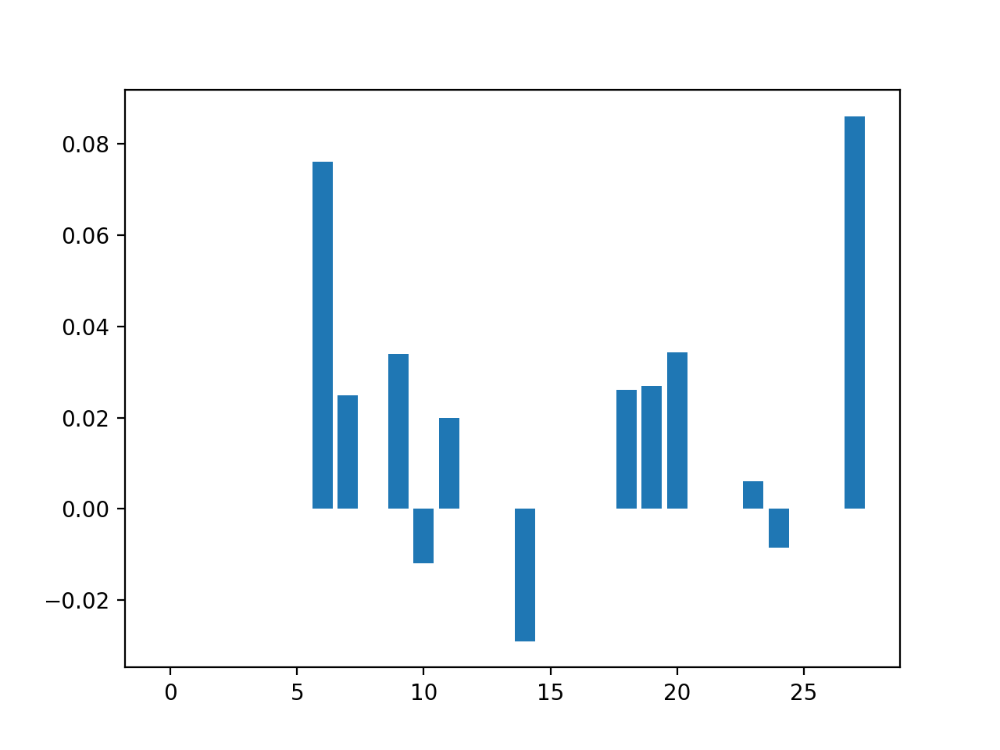

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


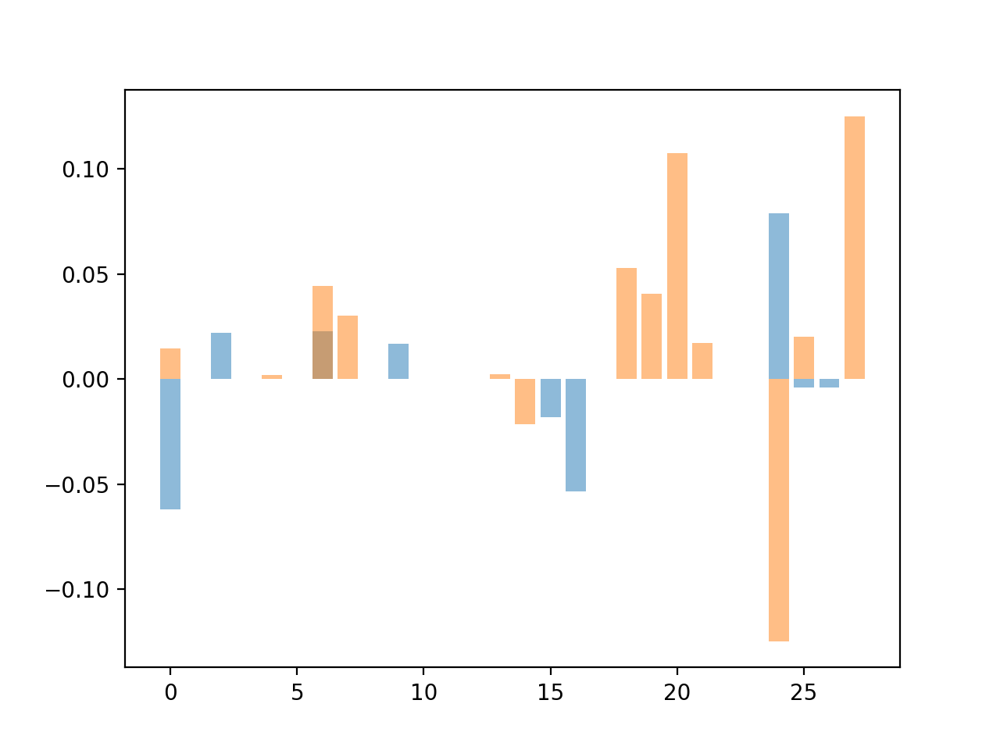

<BarContainer object of 28 artists>

In [905]:
plt.figure()
plt.bar(np.arange(coefs.size),coefs)
plt.figure()
plt.bar(np.arange(coefs.size),coefs1,alpha=0.5)
plt.bar(np.arange(coefs.size),coefs2,alpha=0.5)



/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


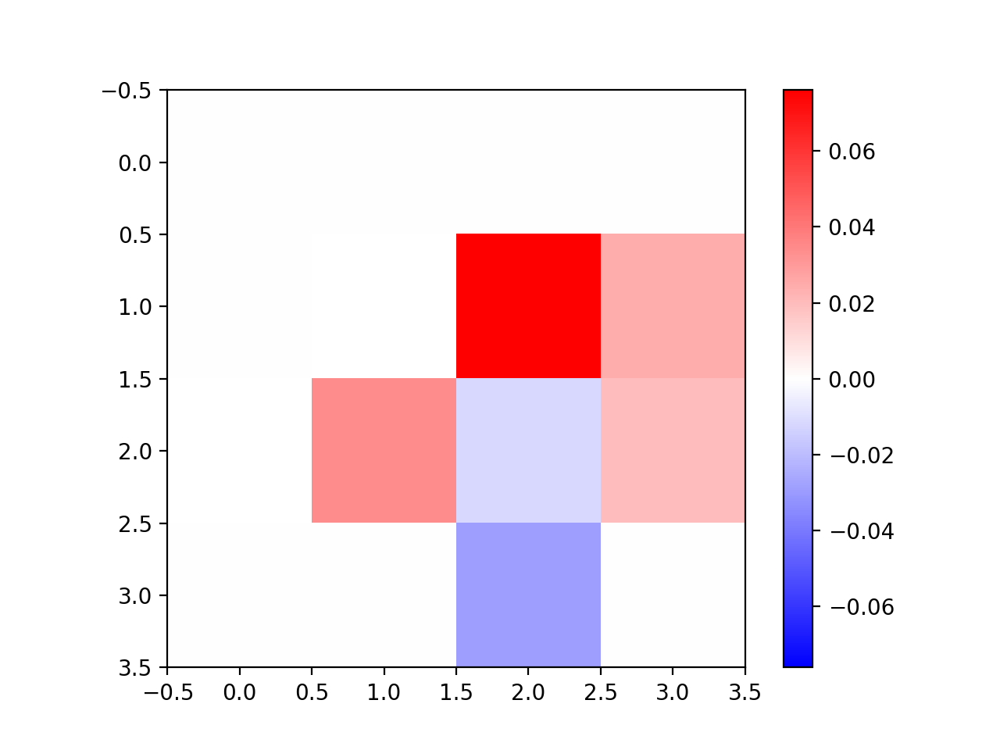

In [836]:
plt.figure()
from importlib import reload
reload(ut)
ut.imshow_hot_cold(coef_list[0])
plt.colorbar()


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


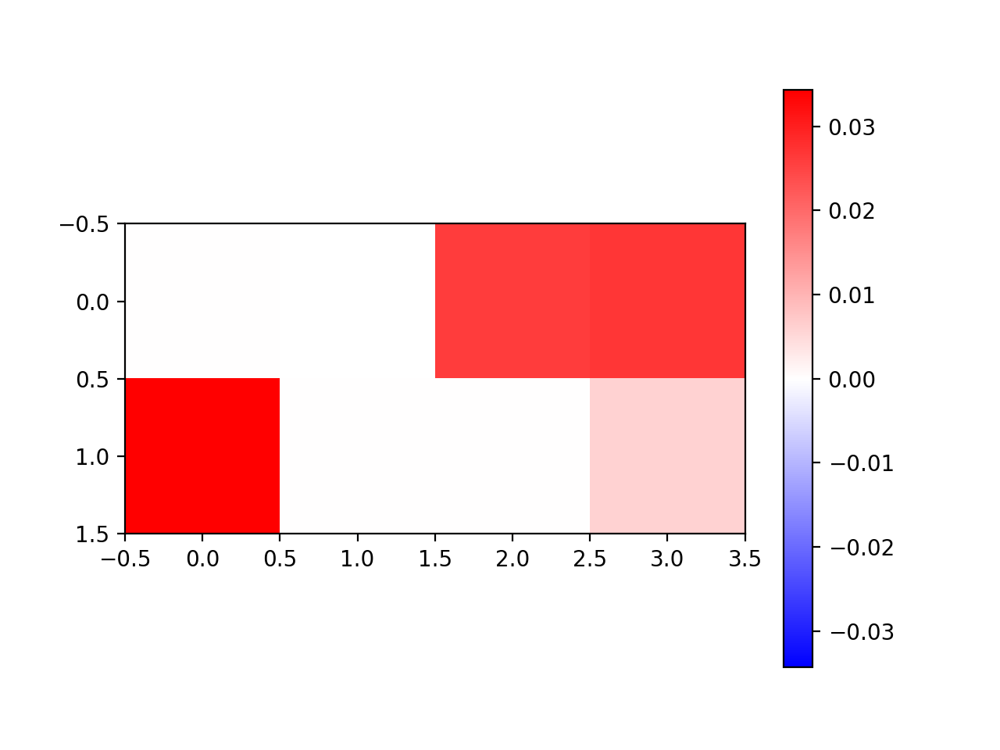

In [906]:
plt.figure()
ut.imshow_hot_cold(coef_list[1])
plt.colorbar()


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


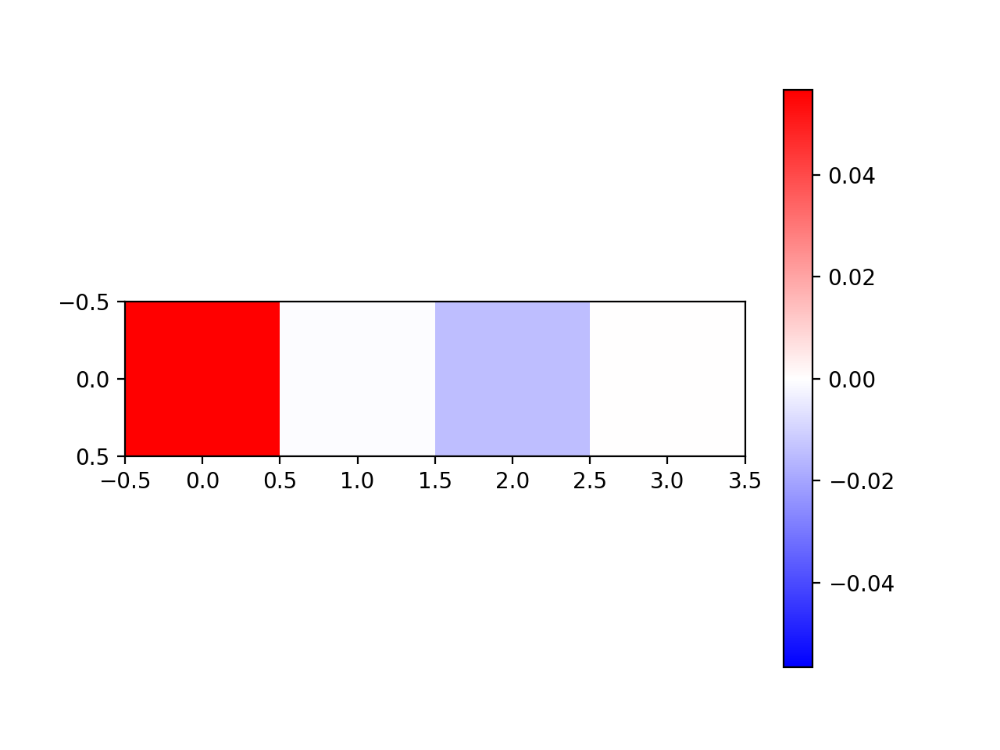

In [858]:
plt.figure()
ut.imshow_hot_cold(coef_list[2][np.newaxis])
plt.colorbar()

In [907]:
low_sst_pv = (Wmys[lkat][:,1,3] < -0.4)
high_sst_pv = (Wmys[lkat][:,1,0]-Wmys[lkat][:,1,3] < -0.045)
low_ff = (Wmxs[lkat][:,0,0] < 0.5)
high_ff = ~low_ff

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


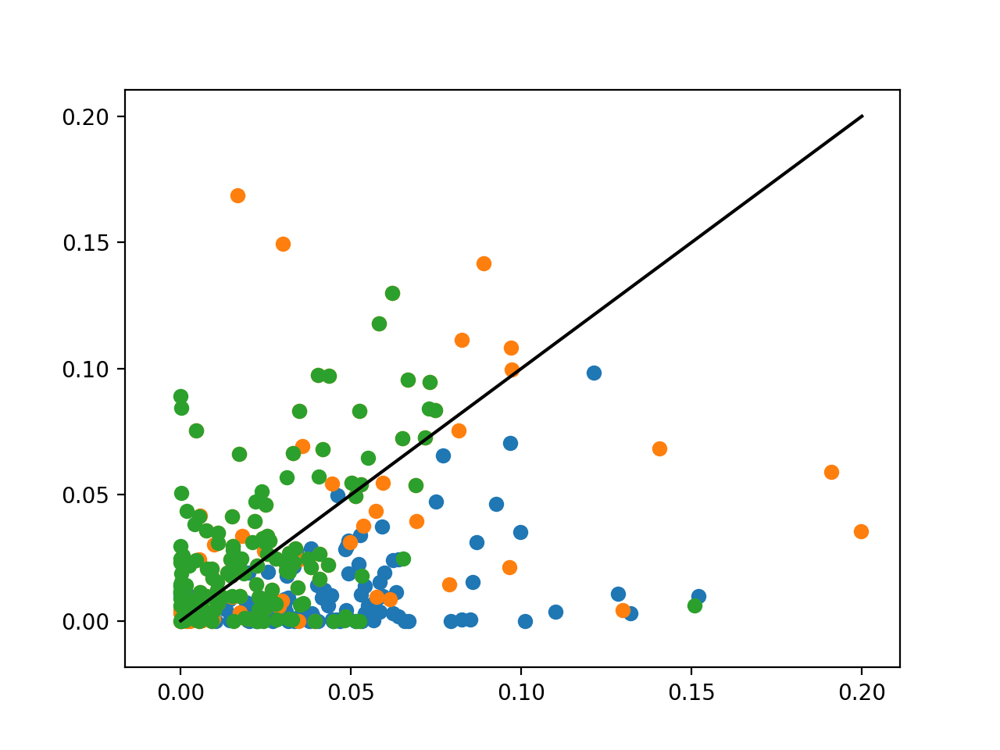

In [908]:
plt.figure()
plt.scatter(Ks[lkat][:,0][~low_sst_pv & ~high_sst_pv],Ks[lkat][:,3][~low_sst_pv & ~high_sst_pv])
plt.scatter(Ks[lkat][:,0][low_sst_pv],Ks[lkat][:,3][low_sst_pv])
plt.scatter(Ks[lkat][:,0][high_sst_pv],Ks[lkat][:,3][high_sst_pv])
plt.plot((0,0.2),(0,0.2),c='k')

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


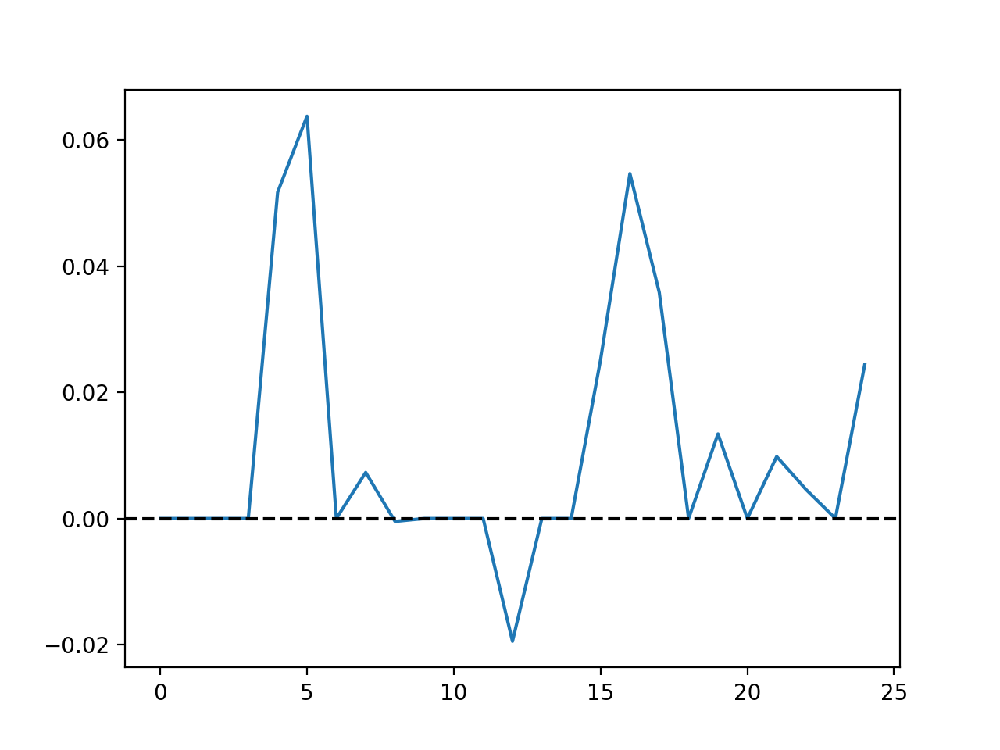

In [757]:
plt.figure()
plt.plot(linreg.coef_)
plt.axhline(0,c='k',linestyle='dashed')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


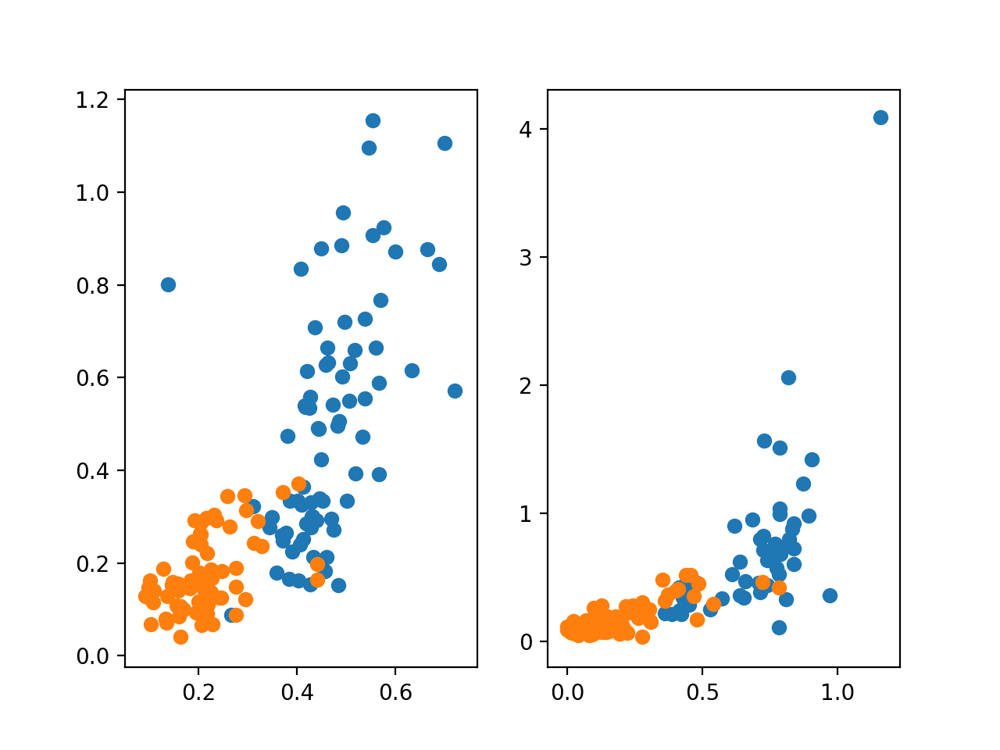

In [909]:
plt.figure()
# plt.scatter(linreg.predict(X)[ori[lkat]],y[ori[lkat]])
# plt.scatter(linreg.predict(X)[~ori[lkat]],y[~ori[lkat]])
plt.subplot(1,2,1)
plt.scatter(linreg1.predict(X)[pc_integrating & ori[lkat]],y[pc_integrating & ori[lkat]])
plt.scatter(linreg1.predict(X)[pc_integrating & ~ori[lkat]],y[pc_integrating & ~ori[lkat]])
plt.subplot(1,2,2)
plt.scatter(linreg2.predict(X)[~pc_integrating & ori[lkat]],y[~pc_integrating & ori[lkat]])
plt.scatter(linreg2.predict(X)[~pc_integrating & ~ori[lkat]],y[~pc_integrating & ~ori[lkat]])
# mn,mx = y.min(),y.max()
# plt.plot((mn,mx),(mn,mx),c='k')

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


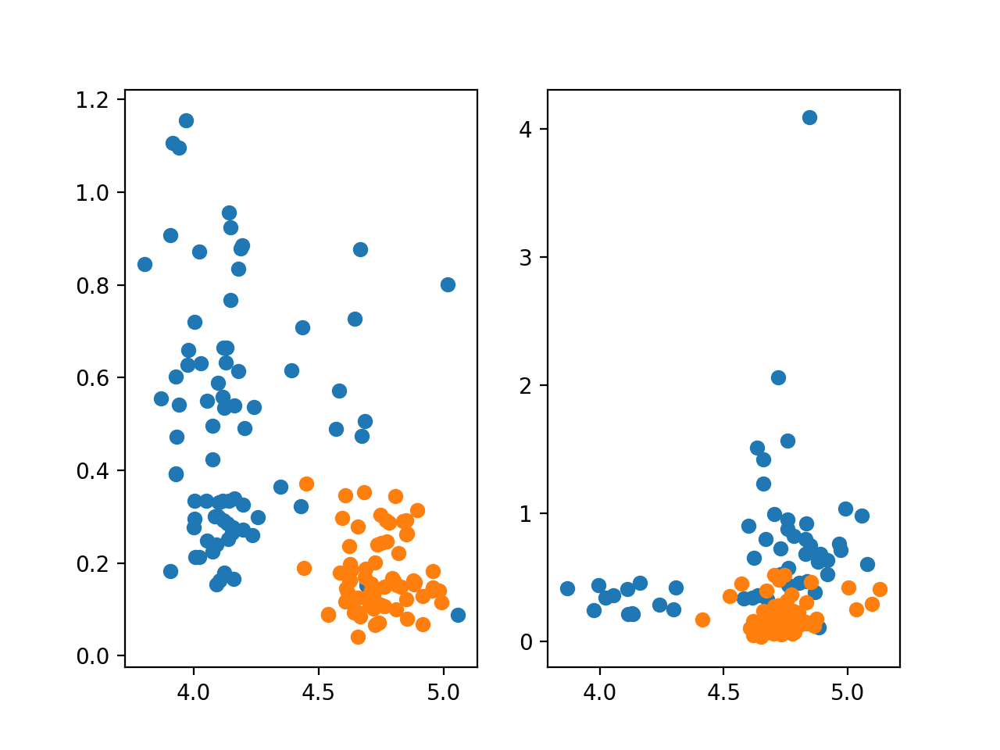

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  after removing the cwd from sys.path.
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


<IPython.core.display.Javascript object>


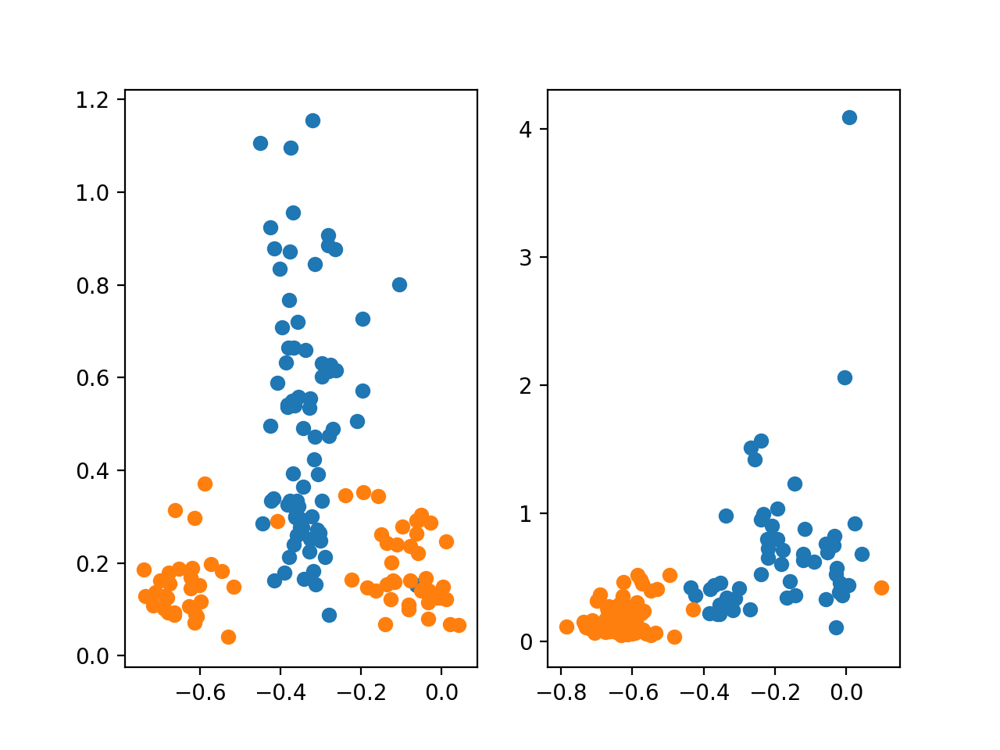

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  # Remove the CWD from sys.path while we load stuff.
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]


<IPython.core.display.Javascript object>


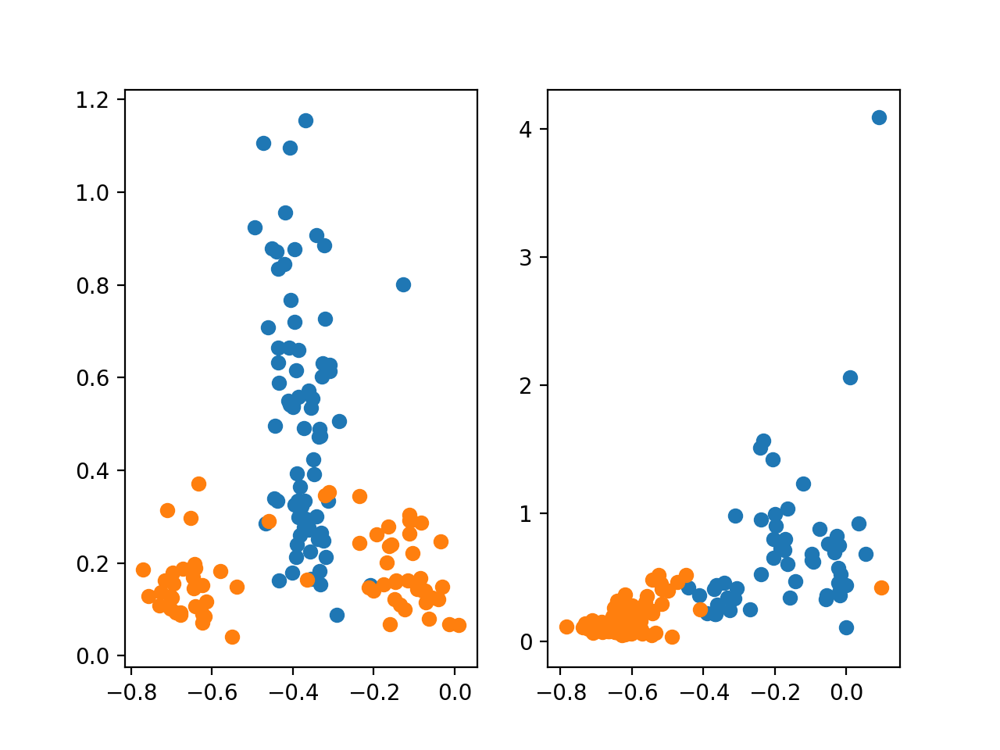

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  app.launch_new_instance()


In [926]:
plt.figure()
for itheseint,theseint in enumerate([pc_integrating,~pc_integrating]):
    for itheseo,theseo in enumerate([ori[lkat],~ori[lkat]]):
        plt.subplot(1,2,itheseint+1)
        plt.scatter((Wmys[lkat][:,0,0]+Wmxs[lkat][:,0,0]-Ks[lkat][:,0])[theseint & theseo],y[theseint & theseo])
        
plt.figure()
for itheseint,theseint in enumerate([pc_integrating,~pc_integrating]):
    for itheseo,theseo in enumerate([ori[lkat],~ori[lkat]]):
        plt.subplot(1,2,itheseint+1)
        plt.scatter((Wmxs[lkat][:,1,0])[theseint & theseo],y[theseint & theseo])
        
plt.figure()
for itheseint,theseint in enumerate([pc_integrating,~pc_integrating]):
    for itheseo,theseo in enumerate([ori[lkat],~ori[lkat]]):
        plt.subplot(1,2,itheseint+1)
        plt.scatter((Ks[lkat][:,3]-Ks[lkat][:,0]+Wmxs[lkat][:,1,0])[theseint & theseo],y[theseint & theseo])

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


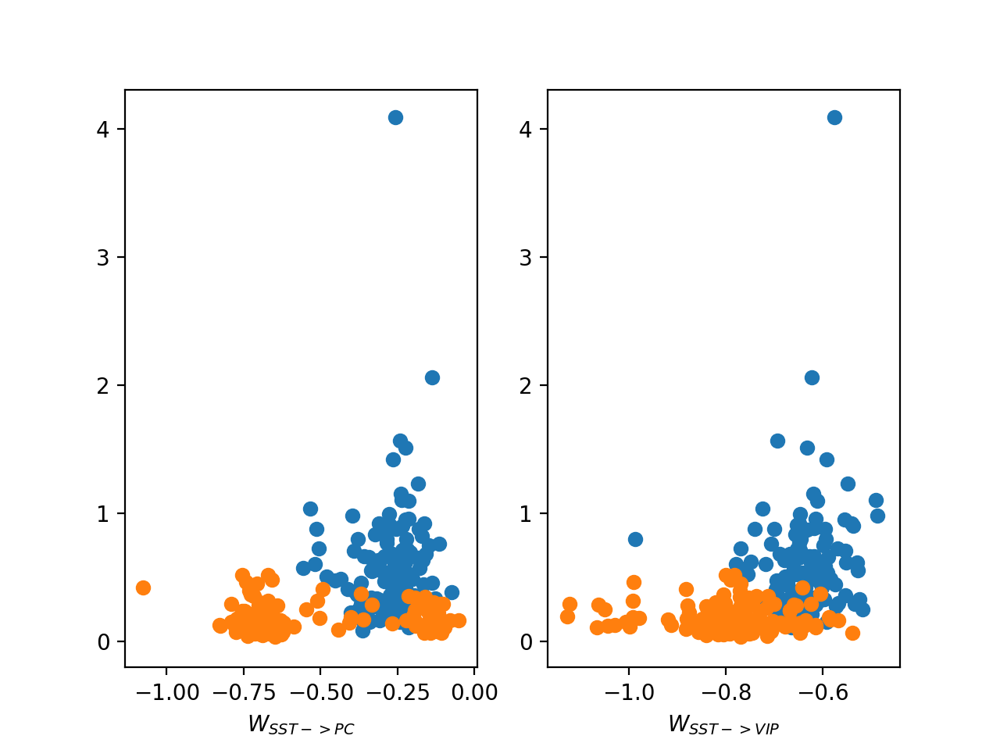

Text(0.5, 0, '$W_{SST->VIP}$')

In [910]:
plt.figure()
plt.subplot(1,2,1)
plt.scatter(Wmys[lkat][:,1,0][ori[lkat]],y[ori[lkat]])
plt.scatter(Wmys[lkat][:,1,0][~ori[lkat]],y[~ori[lkat]])
plt.xlabel('$W_{SST->PC}$')
plt.subplot(1,2,2)
plt.scatter(Wmys[lkat][:,1,2][ori[lkat]],y[ori[lkat]])
plt.scatter(Wmys[lkat][:,1,2][~ori[lkat]],y[~ori[lkat]])
plt.xlabel('$W_{SST->VIP}$')
# mn,mx = y.min(),y.max()
# plt.plot((mn,mx),(mn,mx),c='k')

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


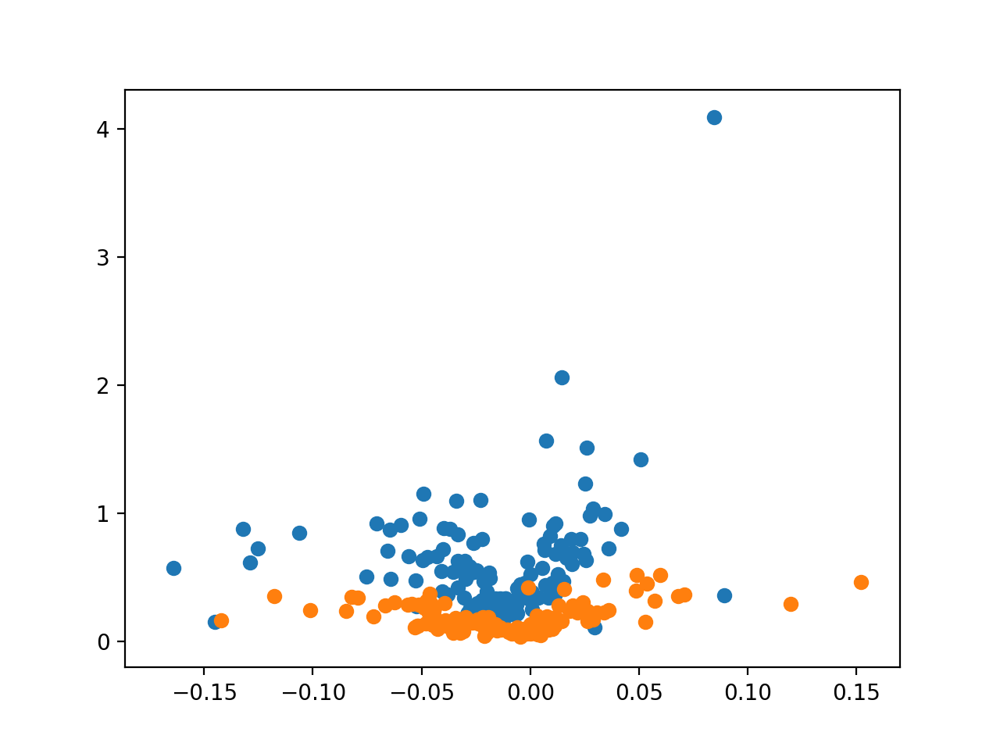

In [911]:
plt.figure()
plt.scatter((-Ks[lkat][:,0]+Ks[lkat][:,3])[ori[lkat]],y[ori[lkat]])
plt.scatter((-Ks[lkat][:,0]+Ks[lkat][:,3])[~ori[lkat]],y[~ori[lkat]])
mn,mx = y.min(),y.max()
# plt.plot((mn,mx),(mn,mx),c='k')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


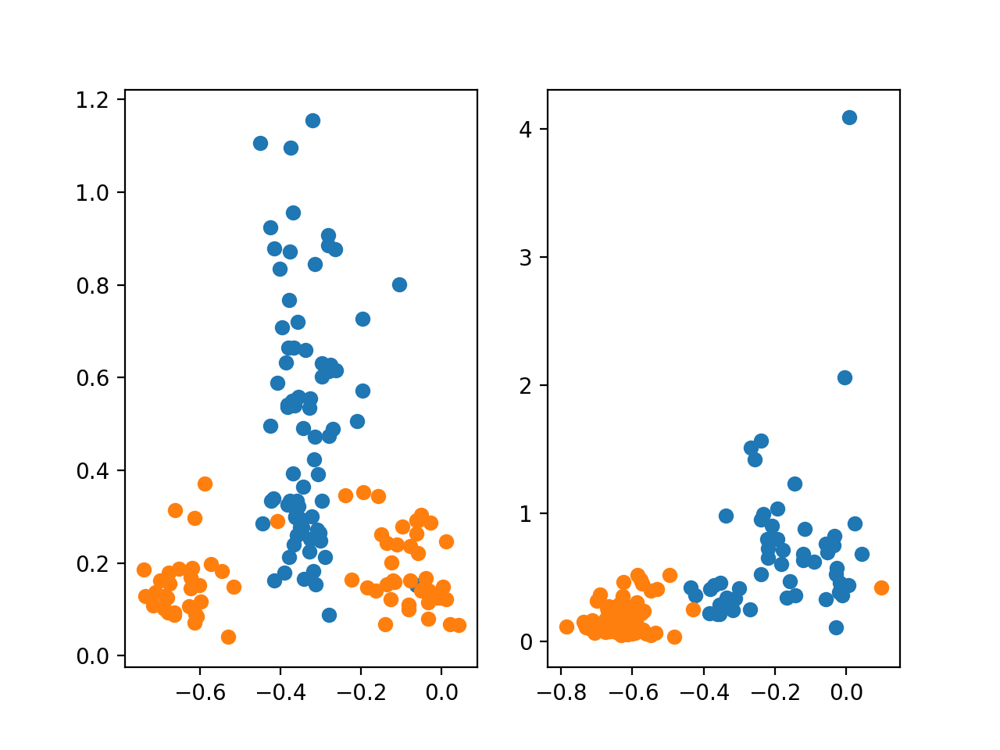

In [912]:
plt.figure()
for ithese,these in enumerate([pc_integrating,~pc_integrating]):
    plt.subplot(1,2,ithese+1)
    plt.scatter((Wmxs[lkat][:,1,0])[ori[lkat] & these],y[ori[lkat] & these])
    plt.scatter((Wmxs[lkat][:,1,0])[~ori[lkat] & these],y[~ori[lkat] & these])
mn,mx = y.min(),y.max()
# plt.plot((mn,mx),(mn,mx),c='k')

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


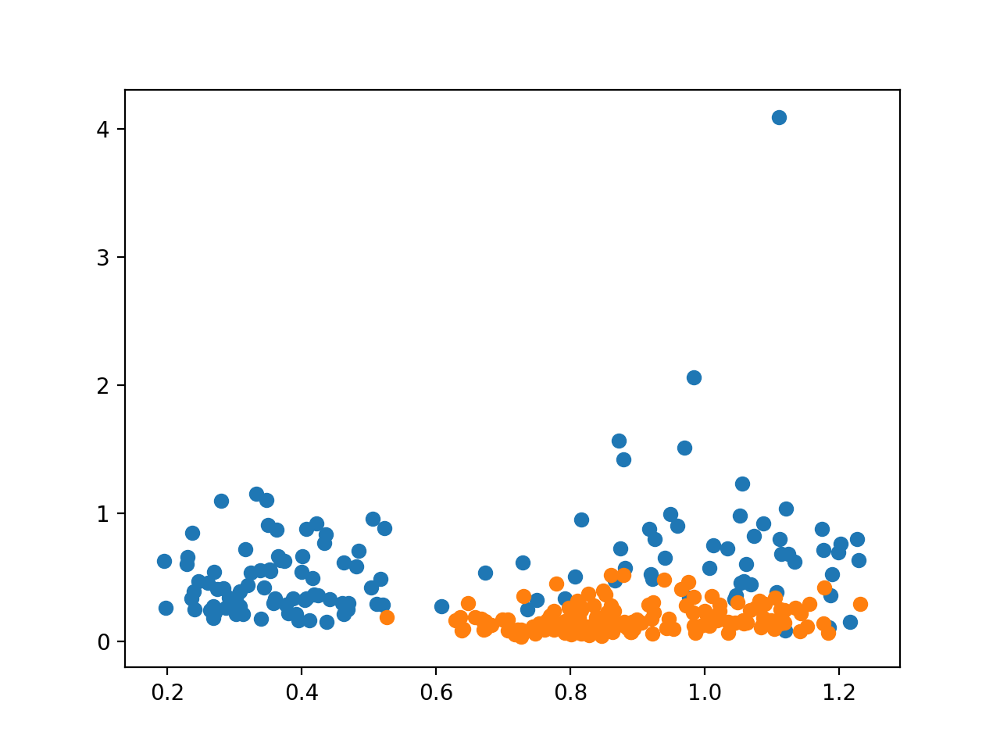

In [913]:
plt.figure()
# plt.scatter(Ks[lkat][:,1]-Ks[lkat][:,3],y)
# plt.scatter((Ks[lkat][:,1]-Ks[lkat][:,3])[low_sst_pv],y[low_sst_pv])
# plt.scatter((Ks[lkat][:,1]-Ks[lkat][:,3])[high_sst_pv],y[high_sst_pv])
plt.scatter((Wmxs[lkat][:,0,0]+Wmxs[lkat][:,1,2])[ori[lkat]],y[ori[lkat]])
plt.scatter((Wmxs[lkat][:,0,0]+Wmxs[lkat][:,1,2])[~ori[lkat]],y[~ori[lkat]])
mn,mx = y.min(),y.max()
# plt.plot((mn,mx),(mn,mx),c='k')


In [834]:
print(np.corrcoef(Ks[lkat][:,0],y)[0,1])
print(np.corrcoef(Ks[lkat][:,3],y)[0,1])
print(np.corrcoef(Ks[lkat][:,0]+Ks[lkat][:,3],y)[0,1])


0.02488329637873952
0.14199751168861166
0.10112648346659685


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


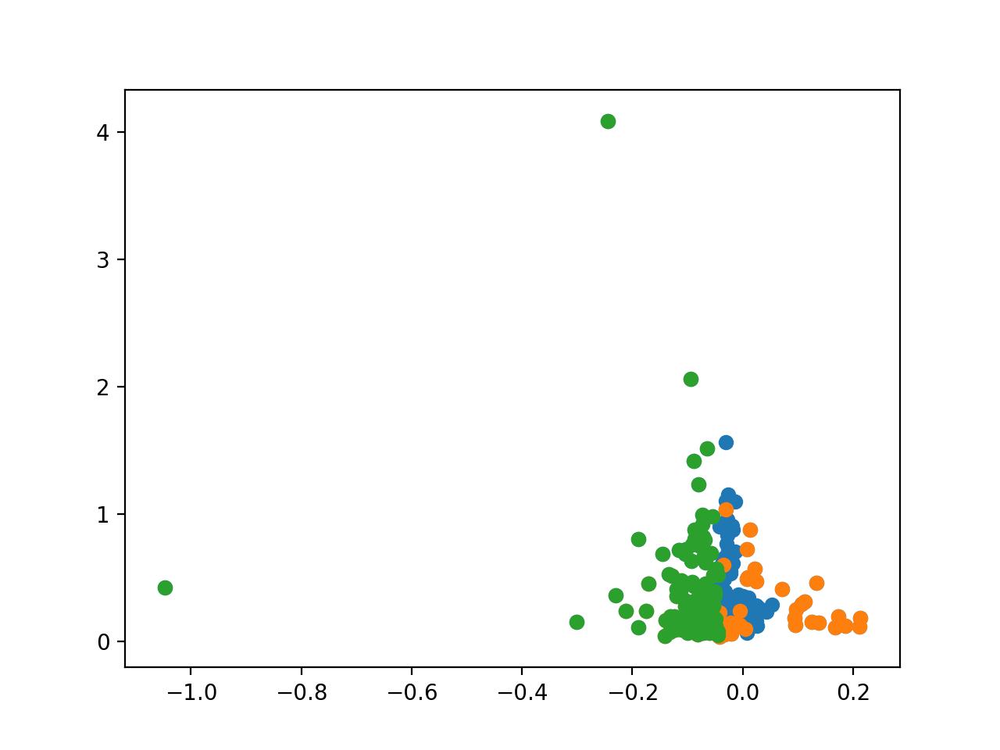

In [835]:
plt.figure()
plt.scatter(Wmys[lkat][:,1,0]-Wmys[lkat][:,1,3],y)
plt.scatter(Wmys[lkat][:,1,0][low_sst_pv]-Wmys[lkat][:,1,3][low_sst_pv],y[low_sst_pv])
plt.scatter(Wmys[lkat][:,1,0][high_sst_pv]-Wmys[lkat][:,1,3][high_sst_pv],y[high_sst_pv])
# plt.scatter(Wmys[lkat][:,1,3],y)
mn,mx = y.min(),y.max()
# plt.plot((mn,mx),(mn,mx),c='k')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


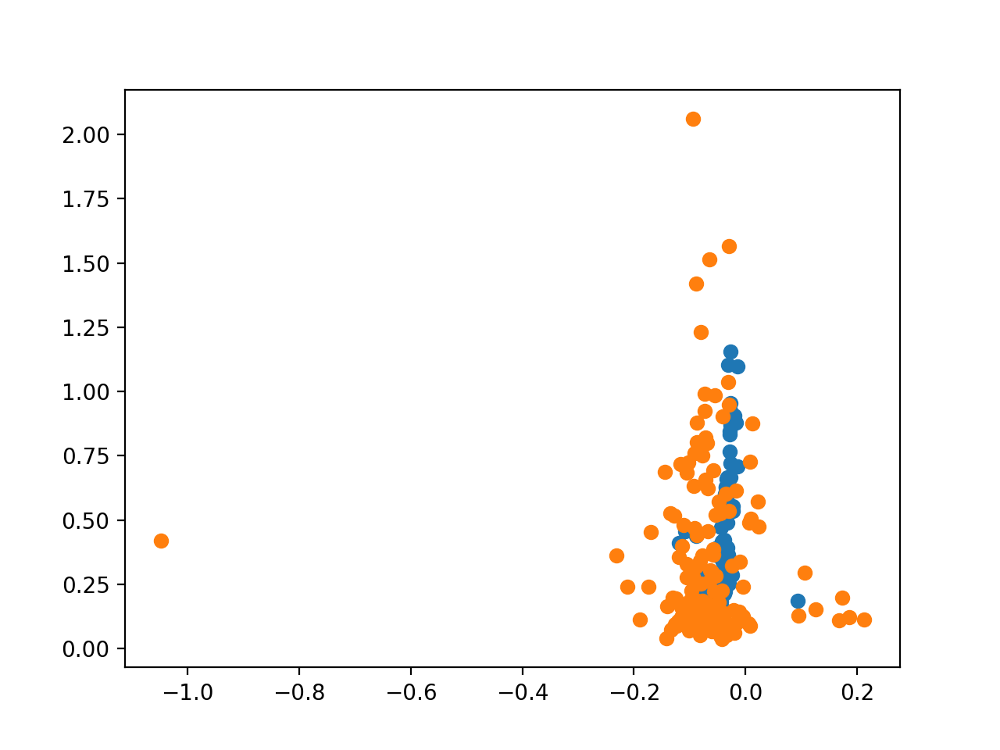

In [739]:
plt.figure()
plt.scatter(Wmys[lkat][:,1,0][low_ff]-Wmys[lkat][:,1,3][low_ff],y[low_ff])
plt.scatter(Wmys[lkat][:,1,0][high_ff]-Wmys[lkat][:,1,3][high_ff],y[high_ff])
# plt.scatter(Wmys[lkat][:,1,3],y)
mn,mx = y.min(),y.max()
# plt.plot((mn,mx),(mn,mx),c='k')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


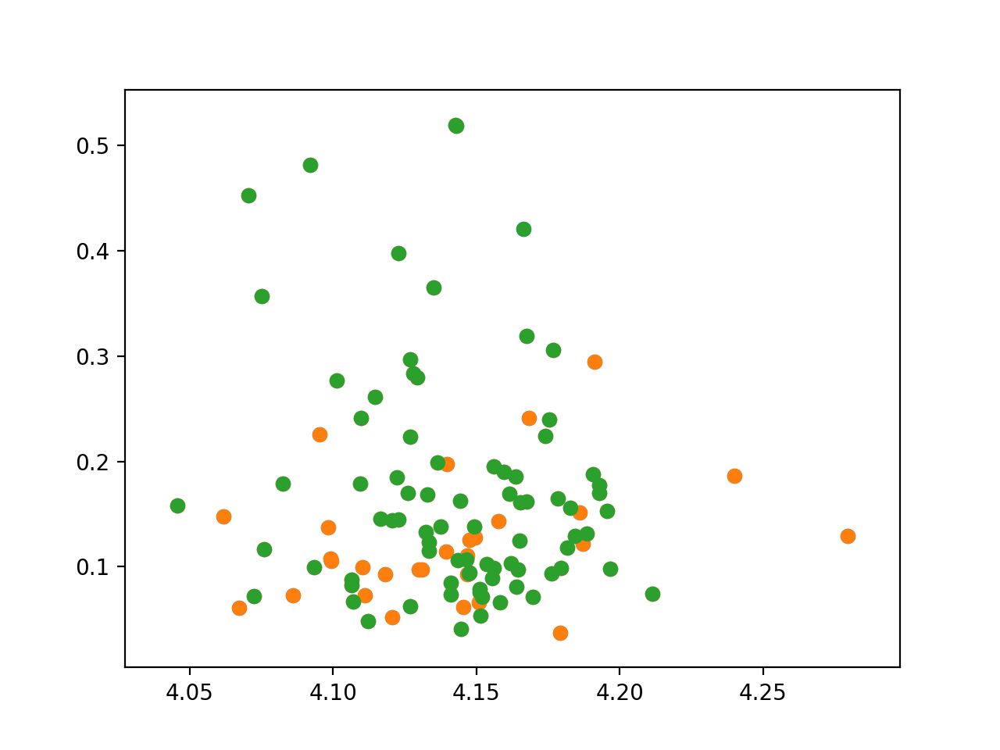

In [702]:
plt.figure()
plt.scatter(Wmys[lkat][:,0,0],y)
plt.scatter(Wmys[lkat][:,0,0][low_sst_pv],y[low_sst_pv])
plt.scatter(Wmys[lkat][:,0,0][high_sst_pv],y[high_sst_pv])
# plt.scatter(Wmys[lkat][:,1,3],y)
mn,mx = y.min(),y.max()
# plt.plot((mn,mx),(mn,mx),c='k')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


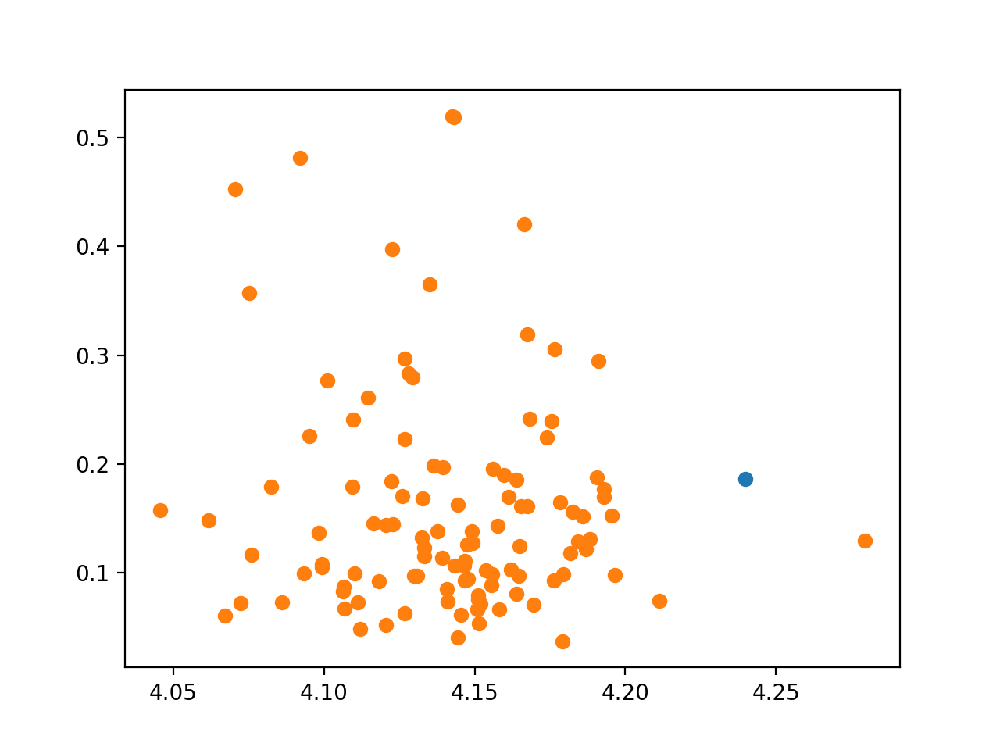

In [703]:
plt.figure()
plt.scatter(Wmys[lkat][:,0,0][low_ff],y[low_ff])
plt.scatter(Wmys[lkat][:,0,0][high_ff],y[high_ff])
# plt.scatter(Wmys[lkat][:,1,3],y)
mn,mx = y.min(),y.max()
# plt.plot((mn,mx),(mn,mx),c='k')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


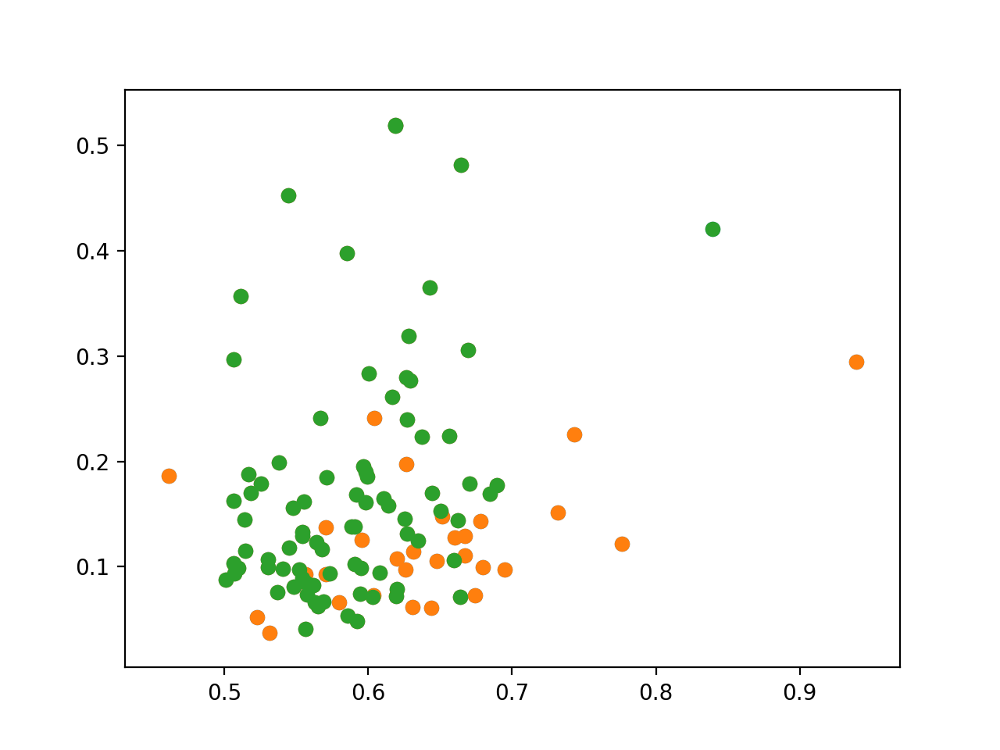

In [704]:
plt.figure()
plt.scatter(Wmxs[lkat][:,0,0],y)
plt.scatter(Wmxs[lkat][:,0,0][low_sst_pv],y[low_sst_pv])
plt.scatter(Wmxs[lkat][:,0,0][high_sst_pv],y[high_sst_pv])
# plt.scatter(Wmys[lkat][:,1,3],y)
mn,mx = y.min(),y.max()
# plt.plot((mn,mx),(mn,mx),c='k')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


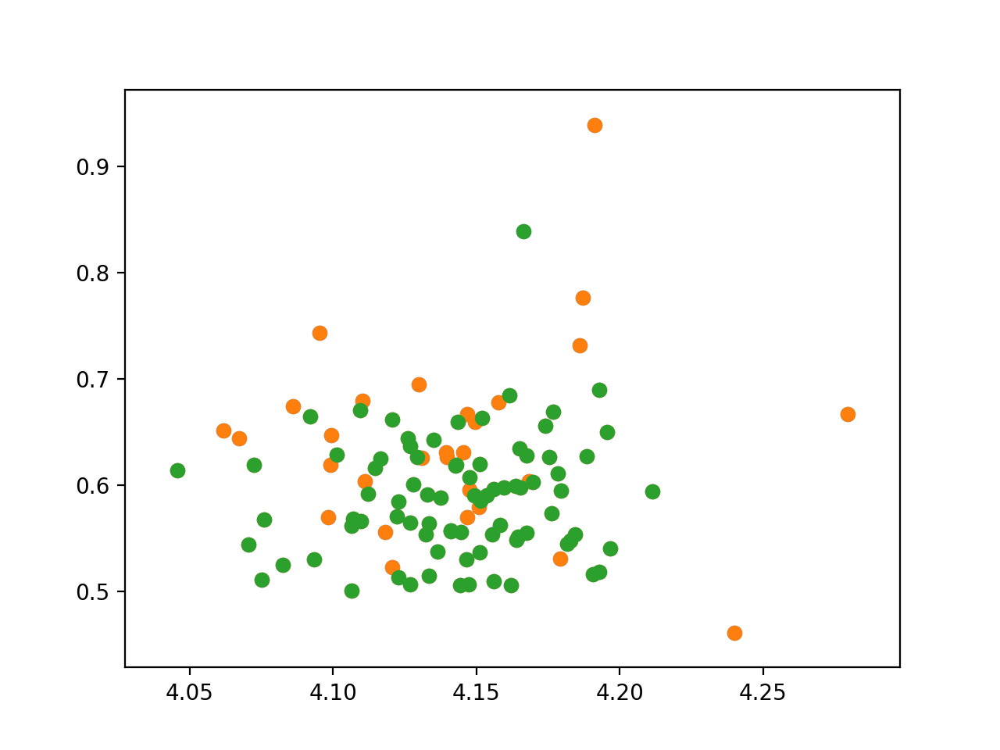

In [705]:
plt.figure()
plt.scatter(Wmys[lkat][:,0,0],Wmxs[lkat][:,0,0])
plt.scatter(Wmys[lkat][:,0,0][low_sst_pv],Wmxs[lkat][:,0,0][low_sst_pv])
plt.scatter(Wmys[lkat][:,0,0][high_sst_pv],Wmxs[lkat][:,0,0][high_sst_pv])
# plt.scatter(Wmys[lkat][:,1,3],y)
mn,mx = y.min(),y.max()
# plt.plot((mn,mx),(mn,mx),c='k')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


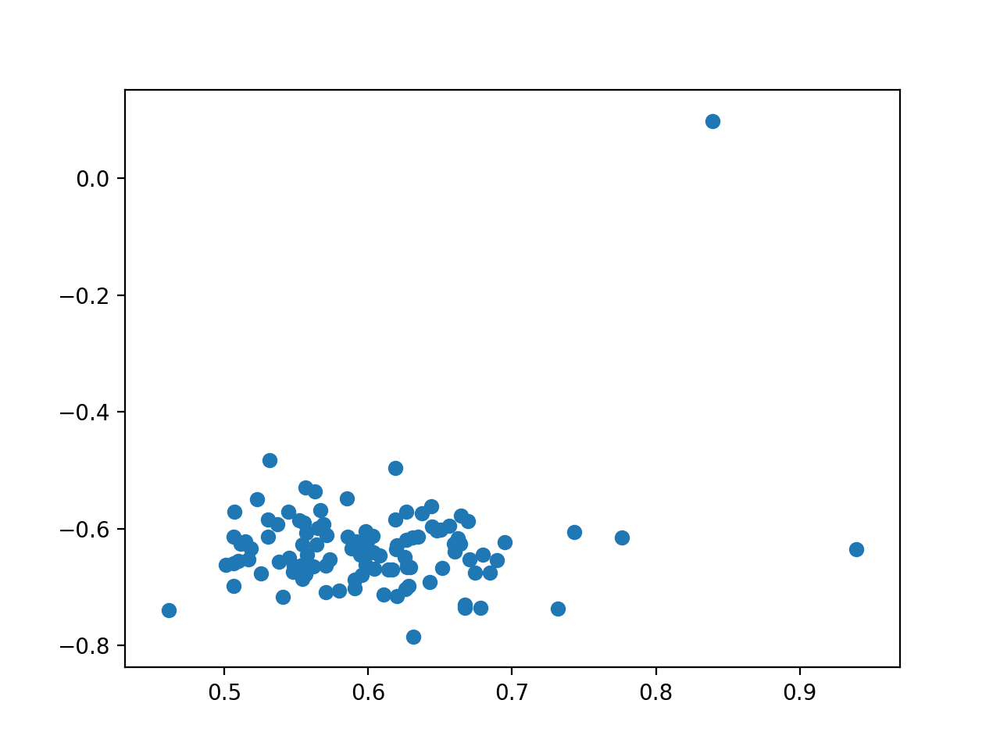

In [706]:
plt.figure()
plt.scatter(Wmxs[lkat][:,0,0],Wmxs[lkat][:,1,0])
# plt.scatter(Wmxs[lkat][:,0,0][low_sst_pv],y[low_sst_pv])
# plt.scatter(Wmxs[lkat][:,0,0][high_sst_pv],y[high_sst_pv])
# plt.scatter(Wmys[lkat][:,1,3],y)
mn,mx = y.min(),y.max()
# plt.plot((mn,mx),(mn,mx),c='k')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


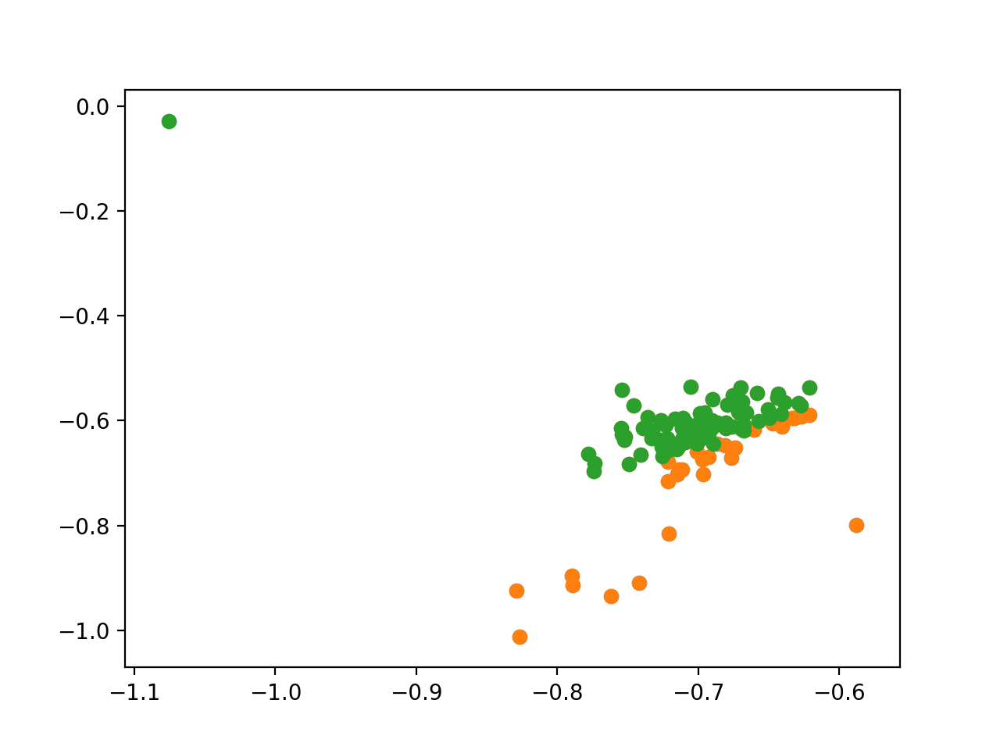

In [707]:
plt.figure()
plt.scatter(Wmys[lkat][:,1,0],Wmys[lkat][:,1,3])
plt.scatter(Wmys[lkat][:,1,0][low_sst_pv],Wmys[lkat][:,1,3][low_sst_pv])
plt.scatter(Wmys[lkat][:,1,0][high_sst_pv],Wmys[lkat][:,1,3][high_sst_pv])

In [980]:
basefold = '/Users/dan/Documents/notebooks/mossing-PC/shared_data/calnet_data/'

weights_files = []

folds = ['201014f','201014h','201015a']

all_weights_files = {}

for fold in folds:
    subfold = 'weights_%s/'%fold
    plots_fold = basefold + 'fit_graphics/' + subfold
    ut.mkdir(plots_fold)
    weights_fold = basefold + 'weights/' + subfold
    all_weights_files[fold] = glob.glob(weights_fold+'*.npy')

    all_weights_files[fold].sort()
# # weights_filenames = [s.split('/')[-1][:-4] for s in weights_files]


In [981]:
[x.shape for x in [Wmy,K,kappa,T]]


[(4, 4), (4,), (), (0,)]

In [985]:
nT = 1
fit_vars = {}
for fold in folds:
    weights_files = all_weights_files[fold]
    nfiles = len(weights_files)
    Ts = np.zeros((nfiles,nQ*(nT-1)))
    Ks = np.zeros((nfiles,nQ*(nS-1)))
    Wmys = np.zeros((nfiles,nQ,nQ))
    Wmxs = np.zeros((nfiles,nP,nQ))
    s02s = np.zeros((nfiles,nQ))
    YYs = np.zeros((nfiles,6,6,nQ*nS*nT))
    XXs = np.zeros((nfiles,6,6,nP*nS*nT))
    couplings = np.zeros((nfiles,6,6,nQ*nS*nT,nQ*nS*nT))
    couplings_pcpv_fixed = np.zeros((nfiles,6,6,nQ*nS*nT,nQ*nS*nT))
    couplings_fixed = np.zeros((nfiles,6,6,nQ*nS*nT,nQ*nS*nT,nQ))
    Xcouplings = np.zeros((nfiles,6,6,nP*nS*nT,nQ*nS*nT))
    phis = np.zeros((nfiles,6,6,nQ*nS*nT))
    losses = np.zeros((nfiles,))
    for iwt,weights_file in enumerate(weights_files):
        Wstar_dict = np.load(weights_file,allow_pickle=True)[()]
        Wmx,Wmy,Wsx,Wsy,s02,K,kappa,T,XX,XXp,Eta,Xi,h = Wstar_dict['as_list']
        losses[iwt] = Wstar_dict['loss']
    #     Wmx,Wmy,Wsx,Wsy,s02,K,kappa,T,XX,XXp,Eta,Xi,h1,h2 = Wstar_dict['as_list']
        WWmy = calnet.utils.gen_Weight_k_kappa_t(Wmy,K,kappa,T,nS=nS,nT=nT)
        WWmx = calnet.utils.gen_Weight_k_kappa_t(Wmx,K,kappa,T,nS=nS,nT=nT)
        tiled_s02 = np.tile(s02,nS*nT)

        all_phis = calnet.utils.fprime_miller_troyer(Eta,Xi**2+tiled_s02)
        for icelltype in range(nQ):
            mean_phi = np.mean(all_phis[:,icelltype::nQ])
            for istim in range(nN):
                iistim,jjstim = np.unravel_index(istim,(6,6))        
                these_phis = all_phis[istim].copy()#calnet.utils.fprime_miller_troyer(Eta[istim],Xi[istim]**2+tiled_s02)
                these_phis[icelltype::nQ] = mean_phi
                Phi = np.diag(these_phis)
                couplings_fixed[iwt,iistim,jjstim,:,:,icelltype] = Phi @ np.linalg.inv(np.eye(nQ*nS*nT) - WWmy @ Phi)
        mean_phi_pc = np.mean(all_phis[:,0::nQ])
        mean_phi_pv = np.mean(all_phis[:,3::nQ])
        for istim in range(nN):
            iistim,jjstim = np.unravel_index(istim,(6,6))        
            these_phis = all_phis[istim].copy()#calnet.utils.fprime_miller_troyer(Eta[istim],Xi[istim]**2+tiled_s02)

            these_phis[0::nQ] = mean_phi_pc
            these_phis[3::nQ] = mean_phi_pv
            Phi = np.diag(these_phis)
            couplings_pcpv_fixed[iwt,iistim,jjstim,:,:] = Phi @ np.linalg.inv(np.eye(nQ*nS*nT) - WWmy @ Phi)

        Ts[iwt] = T
        Ks[iwt] = K
        Wmys[iwt] = Wmy
        Wmxs[iwt] = Wmx
        s02s[iwt] = s02
        YYs[iwt] = sim_utils.f_miller_troyer(Eta,Xi**2+tiled_s02).reshape((6,6,nQ*nS*nT))
        XXs[iwt] = XX.reshape((6,6,nP*nS*nT))
        for istim in range(nN):
            iistim,jjstim = np.unravel_index(istim,(6,6))
            phis[iwt,iistim,jjstim] = calnet.utils.fprime_miller_troyer(Eta[istim],Xi[istim]**2+tiled_s02)
            Phi = np.diag(phis[iwt,iistim,jjstim])
            couplings[iwt,iistim,jjstim] = Phi @ np.linalg.inv(np.eye(nQ*nS*nT) - WWmy @ Phi)
            Xcouplings[iwt,iistim,jjstim] = WWmx @ Phi @ np.linalg.inv(np.eye(nQ*nS*nT) - WWmy @ Phi)
    # couplings = np.reshape(couplings,(couplings.shape[0],6,6,couplings.shape[2],couplings.shape[3]))
    # Xcouplings = np.reshape(Xcouplings,(Xcouplings.shape[0],6,6,Xcouplings.shape[2],Xcouplings.shape[3]))
    lkat = losses < 50
    fit_vars[fold] = {xx:x[lkat] for xx,x in zip(['Ts','Ks','Wmys','Wmxs','s02s','YYs','XXs'],[Ts,Ks,Wmys,Wmxs,s02s,YYs,XXs])}


In [987]:
dicti

{'Ts': array([], shape=(73, 0), dtype=float64),
 'Ks': array([[6.70074672e-02, 9.14598018e-01, 5.28301040e-03, 5.38900644e-02],
        [9.15268715e-03, 6.80749912e-01, 0.00000000e+00, 2.96698052e-02],
        [4.06809774e-02, 9.42180339e-01, 2.60447658e-02, 4.19172723e-03],
        [3.69774533e-02, 7.96905095e-01, 0.00000000e+00, 1.61168819e-01],
        [1.39926600e-01, 8.56810823e-01, 0.00000000e+00, 1.56204954e-01],
        [2.97652612e-02, 7.62814138e-01, 1.46208307e-02, 0.00000000e+00],
        [6.88774661e-03, 8.37598810e-01, 5.60525645e-02, 0.00000000e+00],
        [7.60514511e-02, 9.66389100e-01, 2.89997261e-02, 8.14350297e-03],
        [3.91322188e-02, 8.77552156e-01, 0.00000000e+00, 6.46878915e-02],
        [7.28610341e-02, 1.00000000e+00, 0.00000000e+00, 2.35839337e-04],
        [2.53998610e-02, 9.17727811e-01, 6.61489564e-03, 0.00000000e+00],
        [5.49553951e-02, 9.52405446e-01, 6.63099951e-03, 1.47104541e-03],
        [2.92200828e-02, 9.89914511e-01, 0.00000000e+00, 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


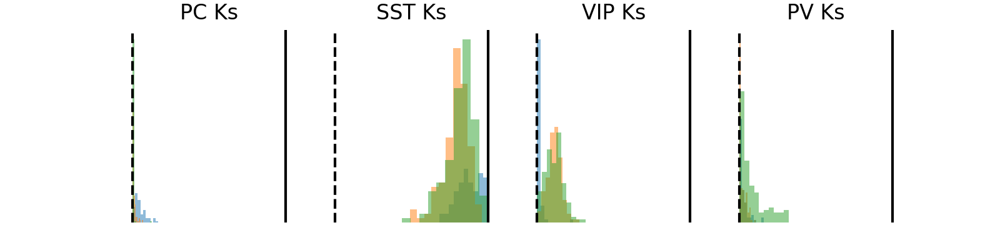

<IPython.core.display.Javascript object>


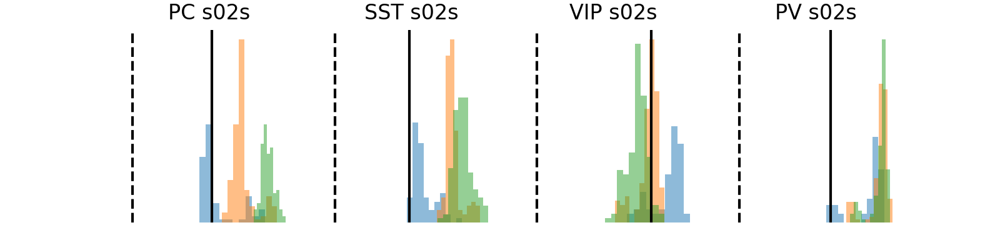

In [993]:
for entry in ['Ks','s02s']:
    plt.figure(figsize=(8,2))
    for i in range(4):
        plt.subplot(1,4,i+1)
        for fold in fit_vars:
            dicti = fit_vars[fold]
            plt.hist(dicti[entry][:,i],alpha=0.5)
        plt.axvline(0,c='k',linestyle='dashed')
        if np.nanmean(dicti[entry][:,i])>0:
            plt.axvline(1,c='k',linestyle='solid')
        else:
            plt.axvline(-1,c='k',linestyle='solid')
        plt.axis('off')
        plt.title(r'%s %s'%(lbls[i],entry))

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


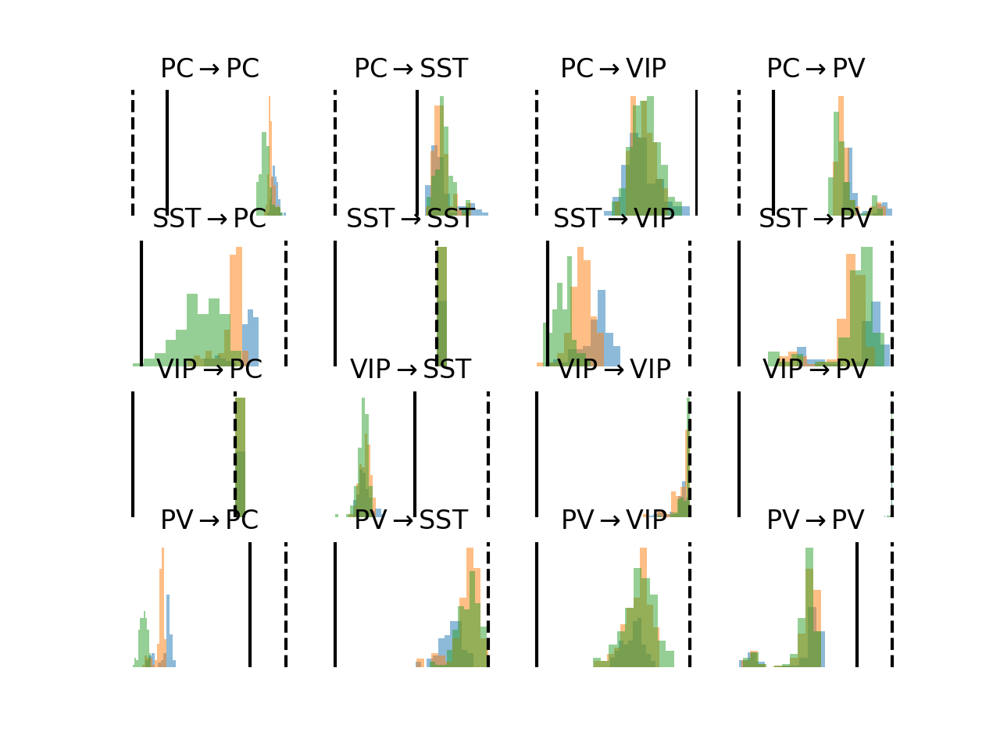

In [992]:
lbls = ['PC','SST','VIP','PV']
plt.figure()
for i in range(4):
    for j in range(4):
        plt.subplot(4,4,4*i+j+1)
        for fold in fit_vars:
            dicti = fit_vars[fold]
            plt.hist(dicti['Wmys'][:,i,j],alpha=0.5)
        plt.axvline(0,c='k',linestyle='dashed')
        if np.nanmean(dicti['Wmys'][:,i,j])>0:
            plt.axvline(1,c='k',linestyle='solid')
        else:
            plt.axvline(-1,c='k',linestyle='solid')
        plt.axis('off')
        plt.title(r'%s$\rightarrow$%s'%(lbls[i],lbls[j]))

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


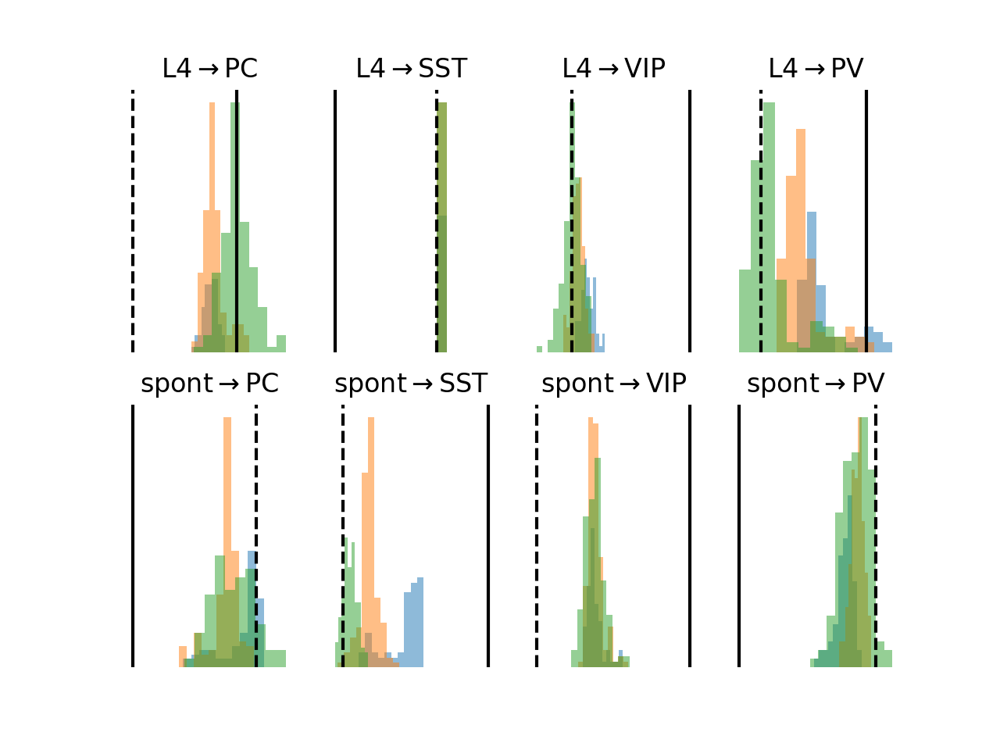

In [995]:
xlbls = ['L4','spont']
lbls = ['PC','SST','VIP','PV']
plt.figure()
for i in range(2):
    for j in range(4):
        plt.subplot(2,4,4*i+j+1)
        for fold in fit_vars:
            dicti = fit_vars[fold]
            plt.hist(dicti['Wmxs'][:,i,j],alpha=0.5)
        if np.nanmean(dicti['Wmxs'][:,i,j])>0:
            plt.axvline(1,c='k',linestyle='solid')
        else:
            plt.axvline(-1,c='k',linestyle='solid')
        plt.axvline(0,c='k',linestyle='dashed')
        plt.axis('off')
        plt.title(r'%s$\rightarrow$%s'%(xlbls[i],lbls[j]))

In [952]:
nfits = lkat.sum()
shapes = [Wmys.shape[1:],Wmxs.shape[1:],Ks.shape[1:]]
X = np.concatenate((Wmys[lkat].reshape((nfits,-1)),Wmxs[lkat].reshape((nfits,-1)),Ks[lkat].reshape((nfits,-1))),axis=1)
# X = Ks[lkat].reshape((nfits,-1))
X = sst.zscore(X,axis=0)
gd = ~np.isnan(X.sum(0))
X = X[:,gd]
y = couplings[lkat,:,:,4,0].mean(1).mean(1)


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2419: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd


In [953]:
linreg = sklm.Lasso(alpha=0.03).fit(X,y)


In [954]:
coefs = np.nan*np.ones_like(gd)
coefs[gd] = linreg.coef_
coef_list = calnet.utils.parse_thing(coefs,shapes)


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


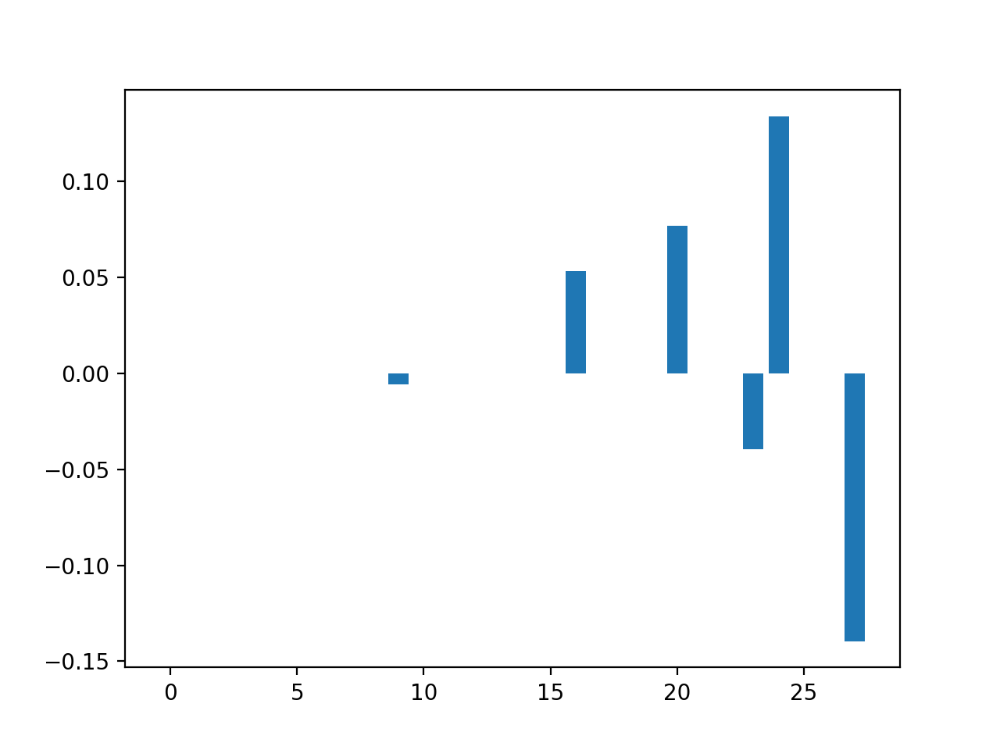

<BarContainer object of 28 artists>

In [955]:
plt.figure()
plt.bar(np.arange(coefs.size),coefs)


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


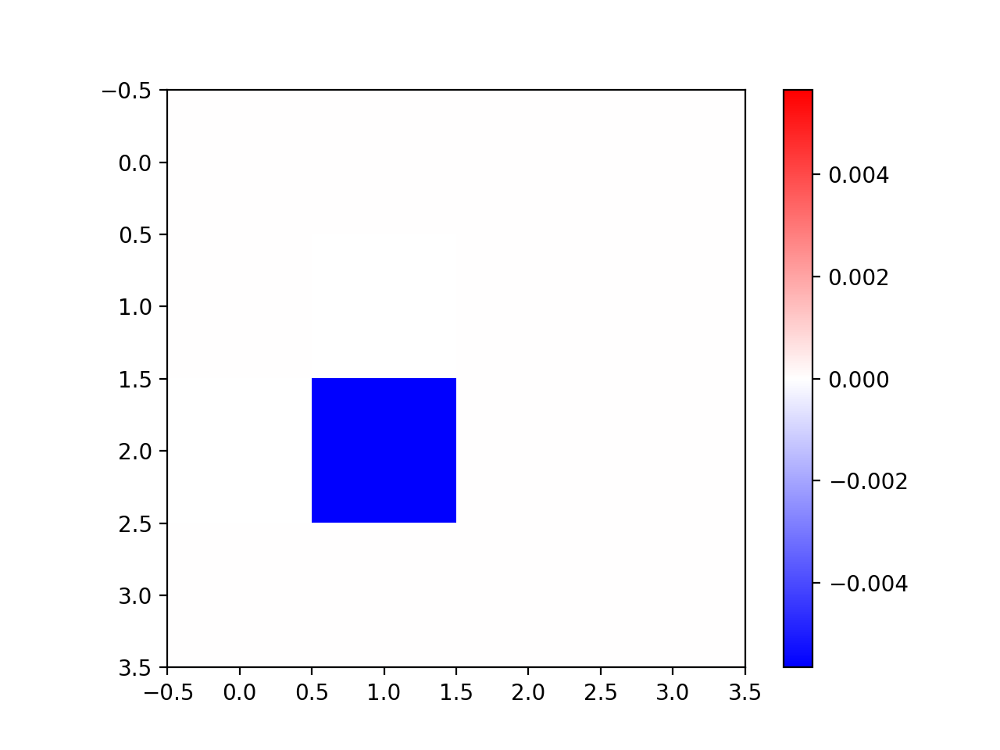

In [956]:
plt.figure()
from importlib import reload
reload(ut)
ut.imshow_hot_cold(coef_list[0])
plt.colorbar()


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


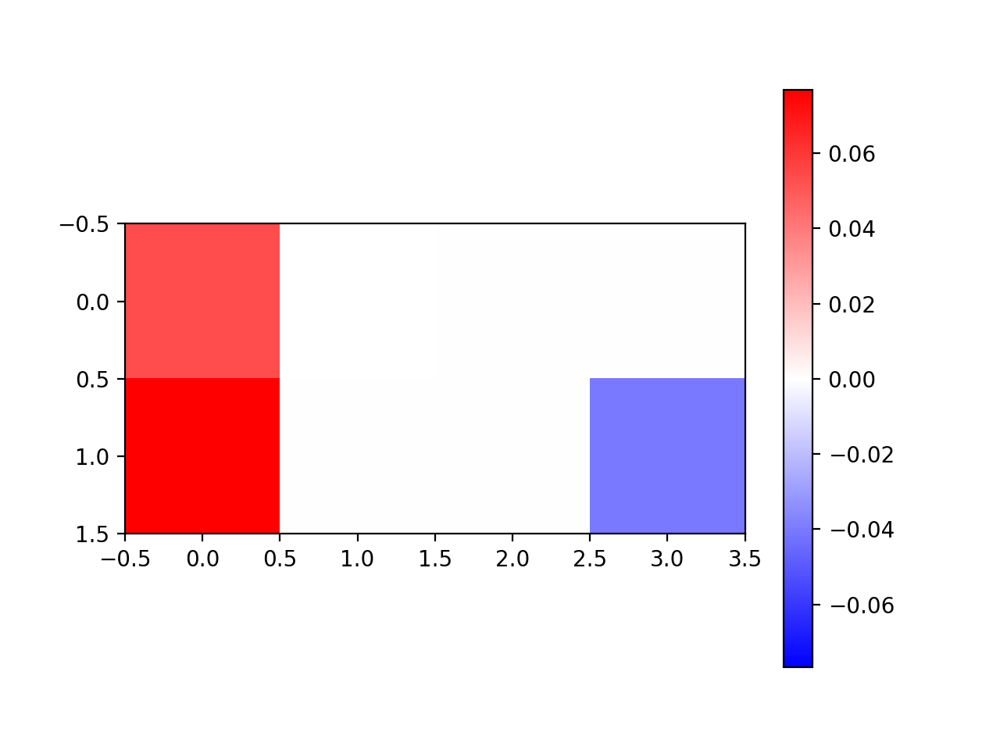

In [957]:
plt.figure()
ut.imshow_hot_cold(coef_list[1])
plt.colorbar()


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


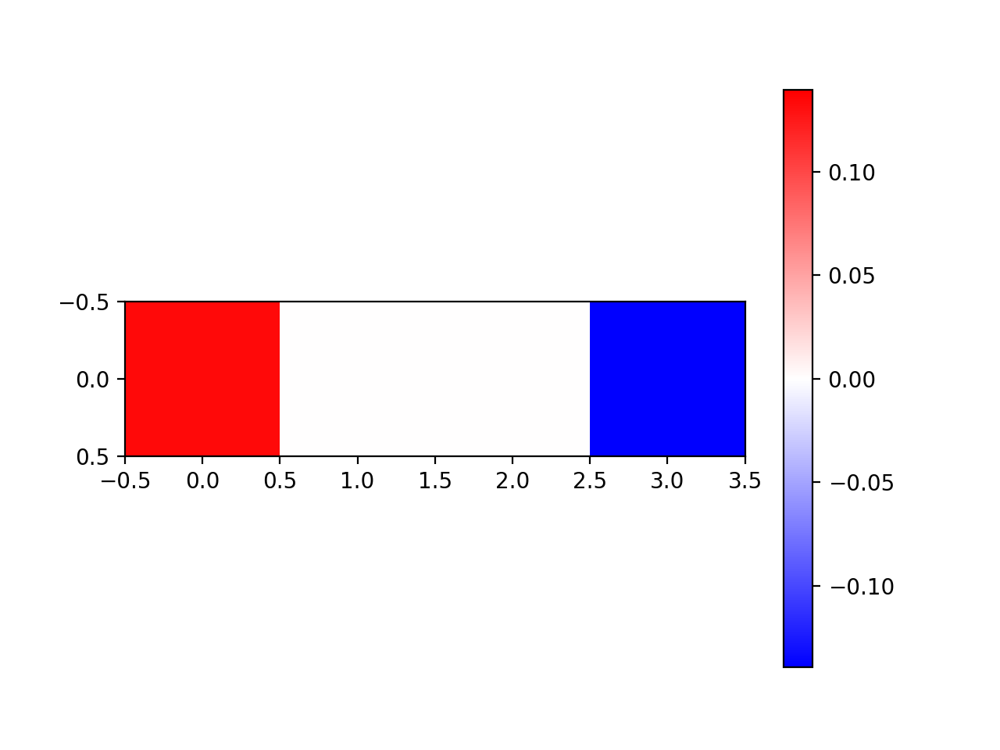

In [958]:
plt.figure()
ut.imshow_hot_cold(coef_list[2][np.newaxis])
plt.colorbar()

In [959]:
low_sst_pv = (Wmys[lkat][:,1,0]-Wmys[lkat][:,1,3] < -0.6)
high_sst_pv = (Wmys[lkat][:,1,0]-Wmys[lkat][:,1,3] > 0.05)

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


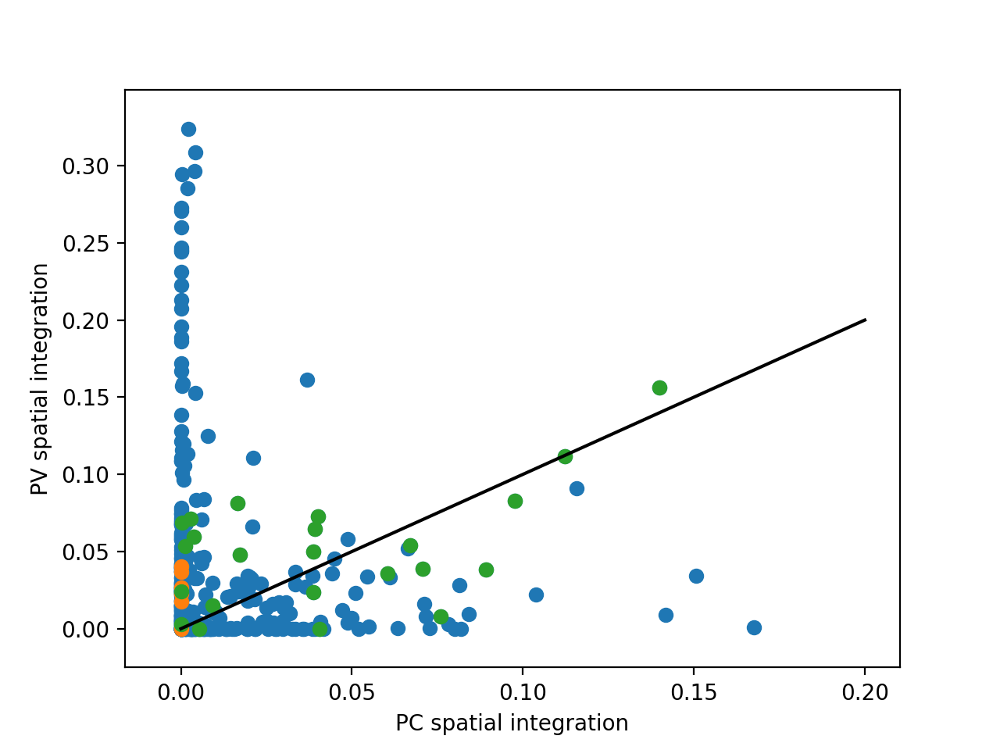

In [961]:
plt.figure()
plt.scatter(Ks[lkat][:,0],Ks[lkat][:,3])
plt.scatter(Ks[lkat][:,0][low_sst_pv],Ks[lkat][:,3][low_sst_pv])
plt.scatter(Ks[lkat][:,0][high_sst_pv],Ks[lkat][:,3][high_sst_pv])
plt.xlabel('PC spatial integration')
plt.ylabel('PV spatial integration')
plt.plot((0,0.2),(0,0.2),c='k')

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


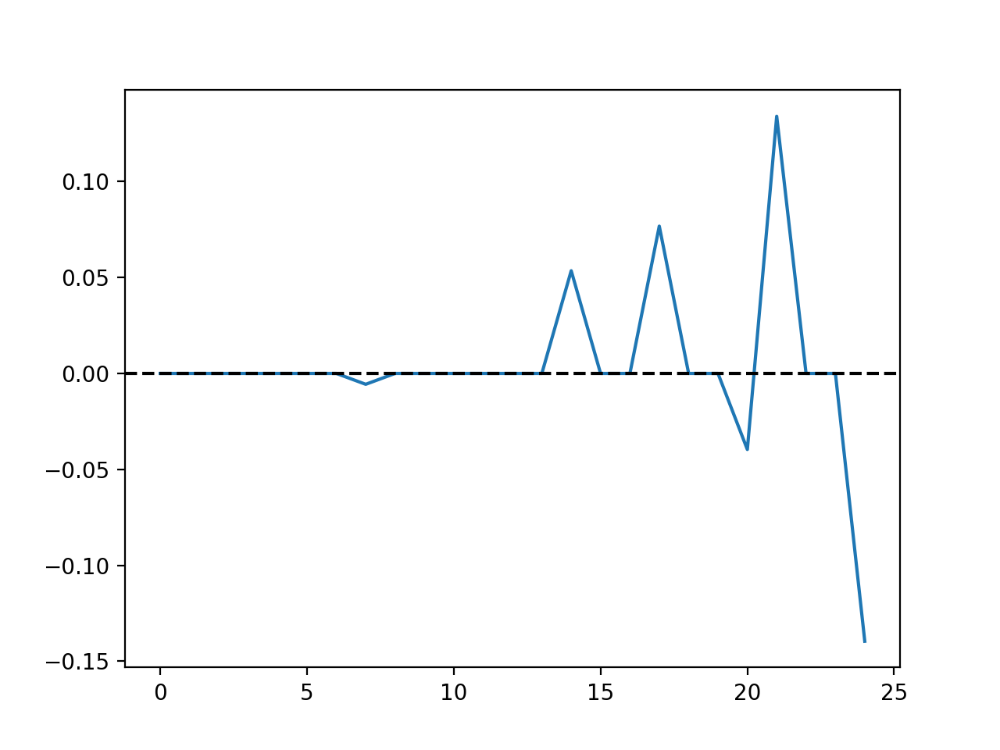

In [962]:
plt.figure()
plt.plot(linreg.coef_)
plt.axhline(0,c='k',linestyle='dashed')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


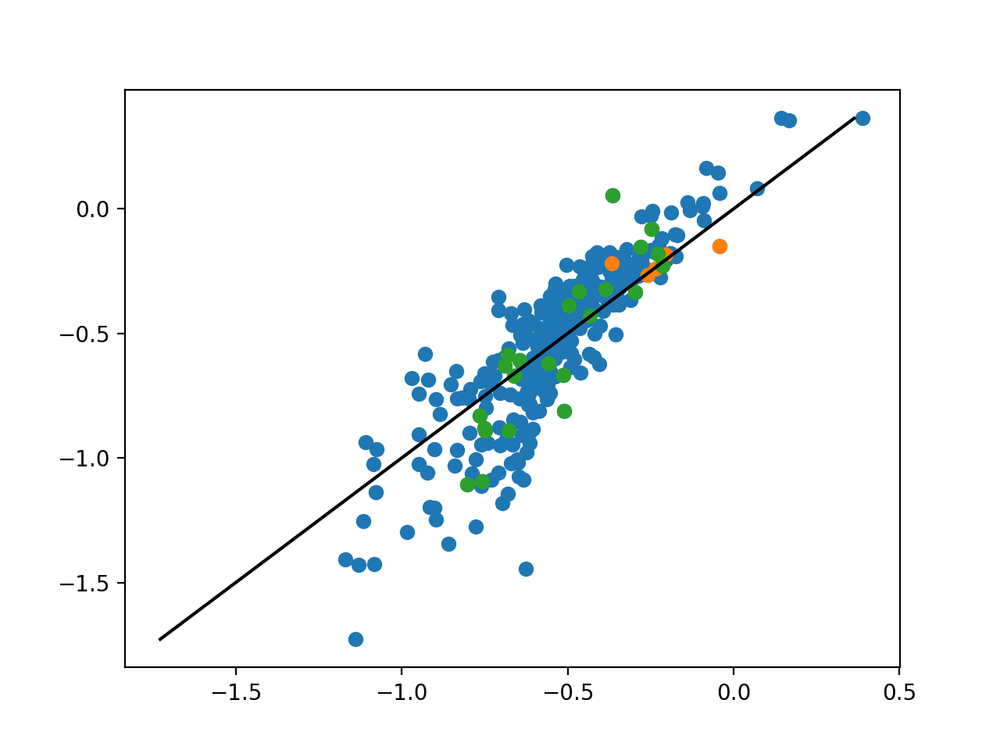

In [963]:
plt.figure()
plt.scatter(linreg.predict(X),y)
plt.scatter(linreg.predict(X)[low_sst_pv],y[low_sst_pv])
plt.scatter(linreg.predict(X)[high_sst_pv],y[high_sst_pv])
mn,mx = y.min(),y.max()
plt.plot((mn,mx),(mn,mx),c='k')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


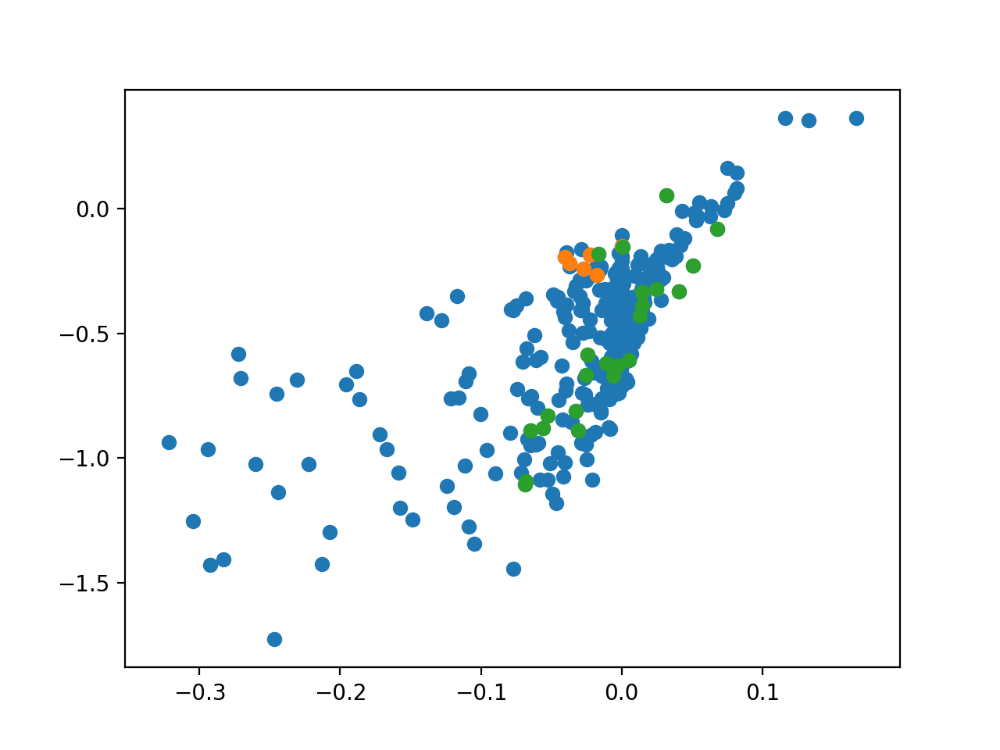

In [964]:
plt.figure()
plt.scatter(Ks[lkat][:,0]-Ks[lkat][:,3],y)
plt.scatter((Ks[lkat][:,0]-Ks[lkat][:,3])[low_sst_pv],y[low_sst_pv])
plt.scatter((Ks[lkat][:,0]-Ks[lkat][:,3])[high_sst_pv],y[high_sst_pv])
mn,mx = y.min(),y.max()
# plt.plot((mn,mx),(mn,mx),c='k')


In [965]:
print(np.corrcoef(Ks[lkat][:,0],y)[0,1])
print(np.corrcoef(-Ks[lkat][:,3],y)[0,1])
print(np.corrcoef(Ks[lkat][:,0]-Ks[lkat][:,3],y)[0,1])


0.5198981101528214
0.5481259882821216
0.6857685298857352


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


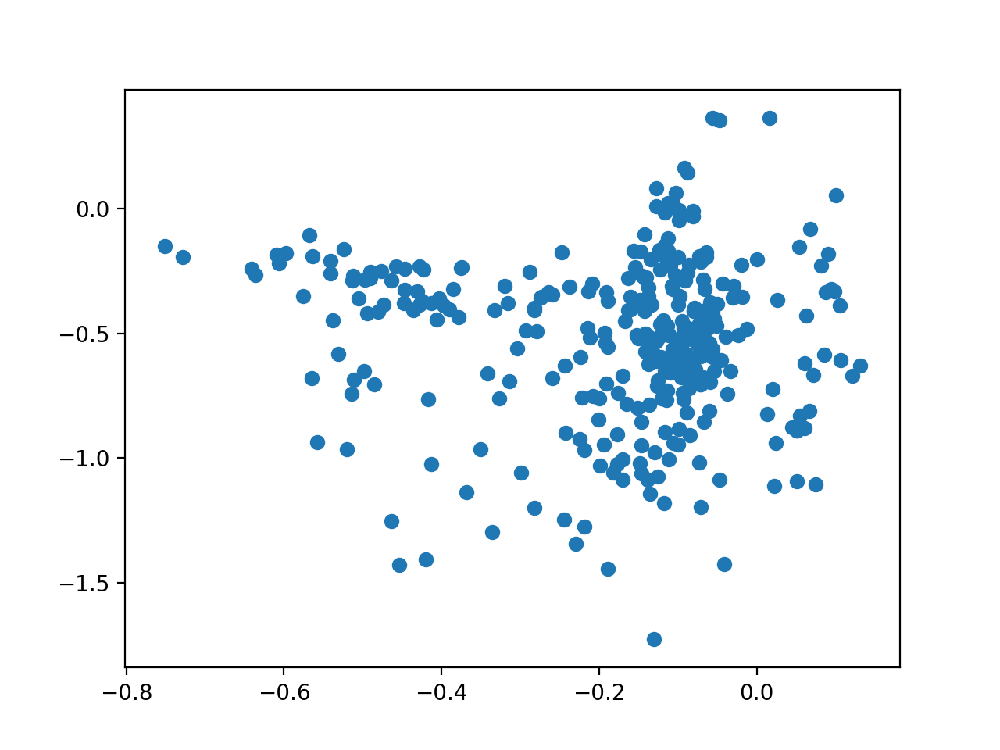

In [966]:
plt.figure()
plt.scatter(Wmys[lkat][:,1,0]-Wmys[lkat][:,1,3],y)
# plt.scatter(Wmys[lkat][:,1,3],y)
mn,mx = y.min(),y.max()
# plt.plot((mn,mx),(mn,mx),c='k')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


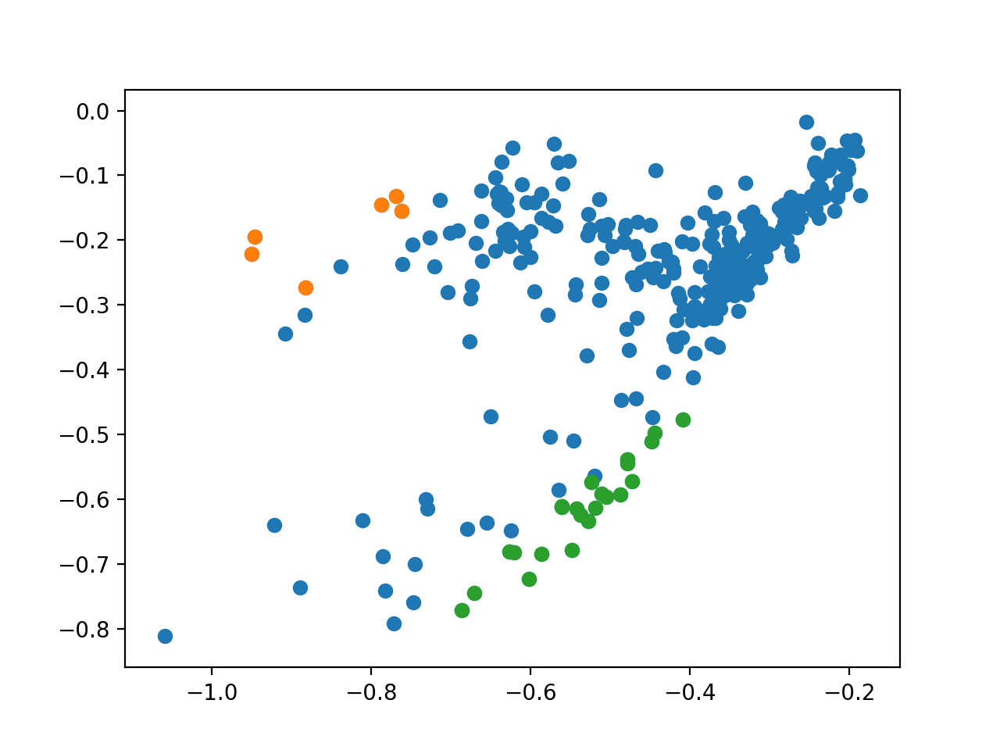

In [967]:
plt.figure()
plt.scatter(Wmys[lkat][:,1,0],Wmys[lkat][:,1,3])
plt.scatter(Wmys[lkat][:,1,0][low_sst_pv],Wmys[lkat][:,1,3][low_sst_pv])
plt.scatter(Wmys[lkat][:,1,0][high_sst_pv],Wmys[lkat][:,1,3][high_sst_pv])

In [968]:
nfits = lkat.sum()
shapes = [Wmys.shape[1:],Wmxs.shape[1:],Ks.shape[1:]]
X = np.concatenate((Wmys[lkat].reshape((nfits,-1)),Wmxs[lkat].reshape((nfits,-1)),Ks[lkat].reshape((nfits,-1))),axis=1)
# X = Ks[lkat].reshape((nfits,-1))
X = sst.zscore(X,axis=0)
gd = ~np.isnan(X.sum(0))
X = X[:,gd]
y = (np.abs(couplings[lkat,:,:,4,0] - couplings_pcpv_fixed[lkat,:,:,4,0])).mean(1).mean(1)
# y = np.abs(couplings[lkat,:,:,4,0] - couplings_fixed[lkat,:,:,4,0,1]).mean(1).mean(1)


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:2419: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd


In [969]:
big_pc_rf = (Ks[lkat][:,0]-Ks[lkat][:,3]>0.01)

In [970]:
linreg = sklm.Lasso(alpha=0.01).fit(X,y)
linreg = sklm.Lasso(alpha=0.01).fit(X[~big_pc_rf],y[~big_pc_rf])

In [971]:
coefs = np.nan*np.ones_like(gd)
coefs[gd] = linreg.coef_
coef_list = calnet.utils.parse_thing(coefs,shapes)


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


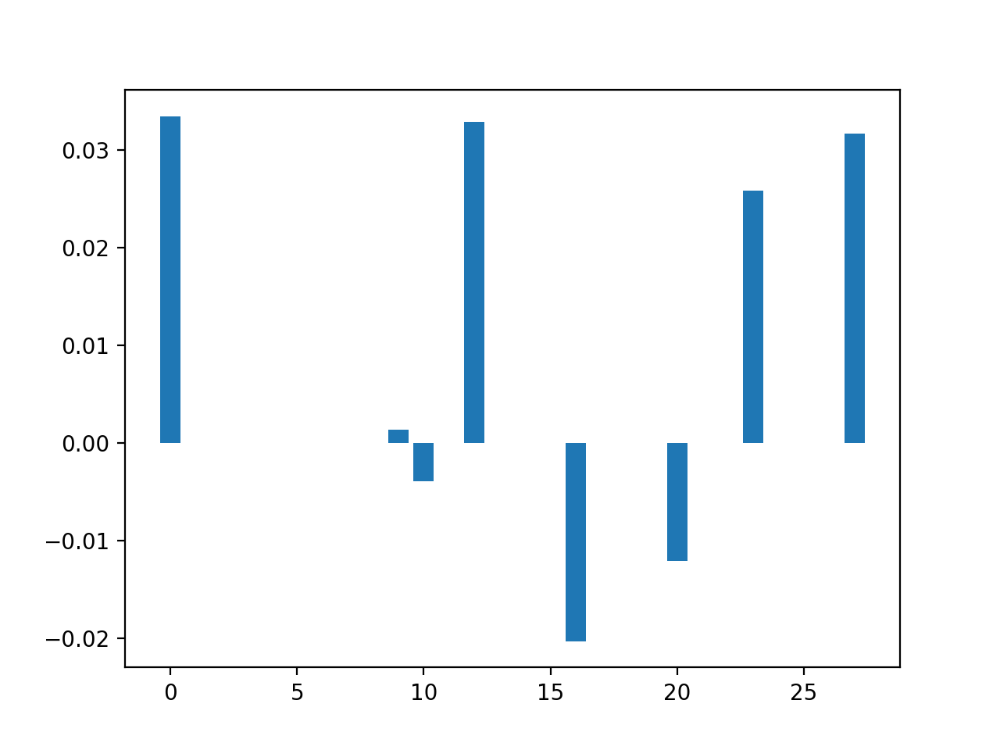

<BarContainer object of 28 artists>

In [972]:
plt.figure()
plt.bar(np.arange(coefs.size),coefs)


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


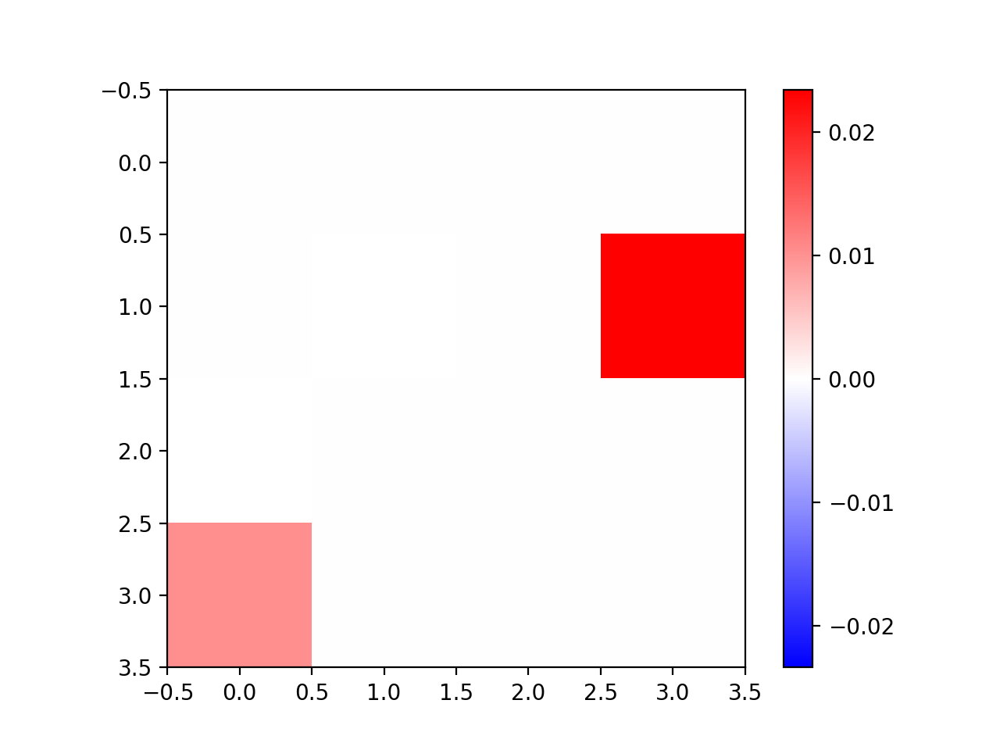

In [376]:
plt.figure()
from importlib import reload
reload(ut)
ut.imshow_hot_cold(coef_list[0])
plt.colorbar()


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


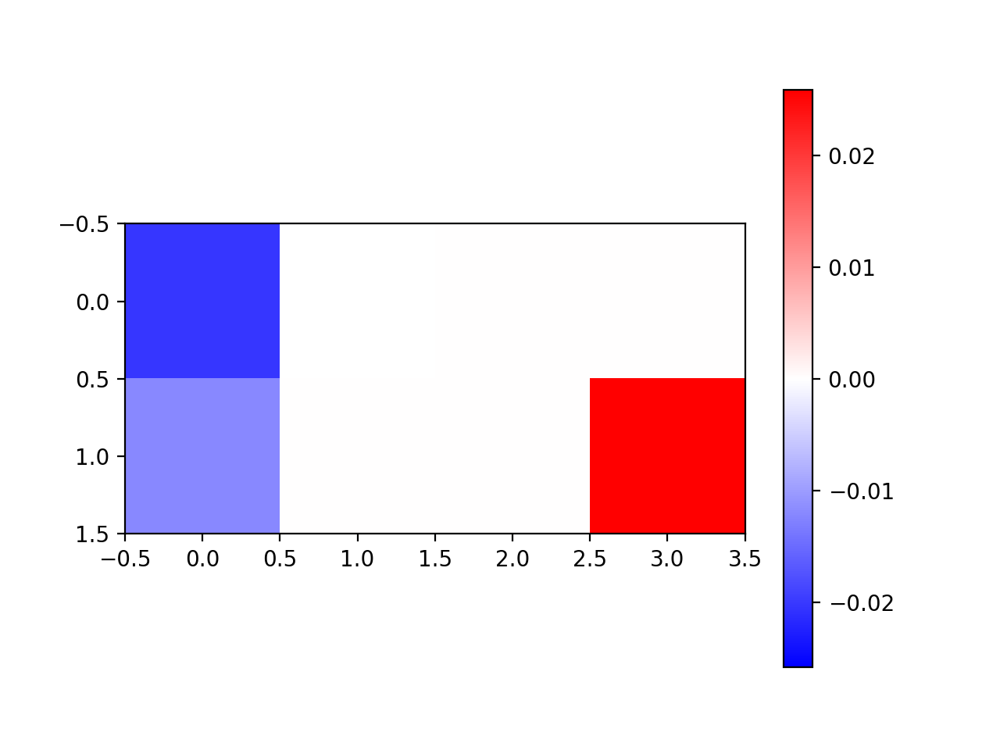

In [973]:
plt.figure()
ut.imshow_hot_cold(coef_list[1])
plt.colorbar()


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


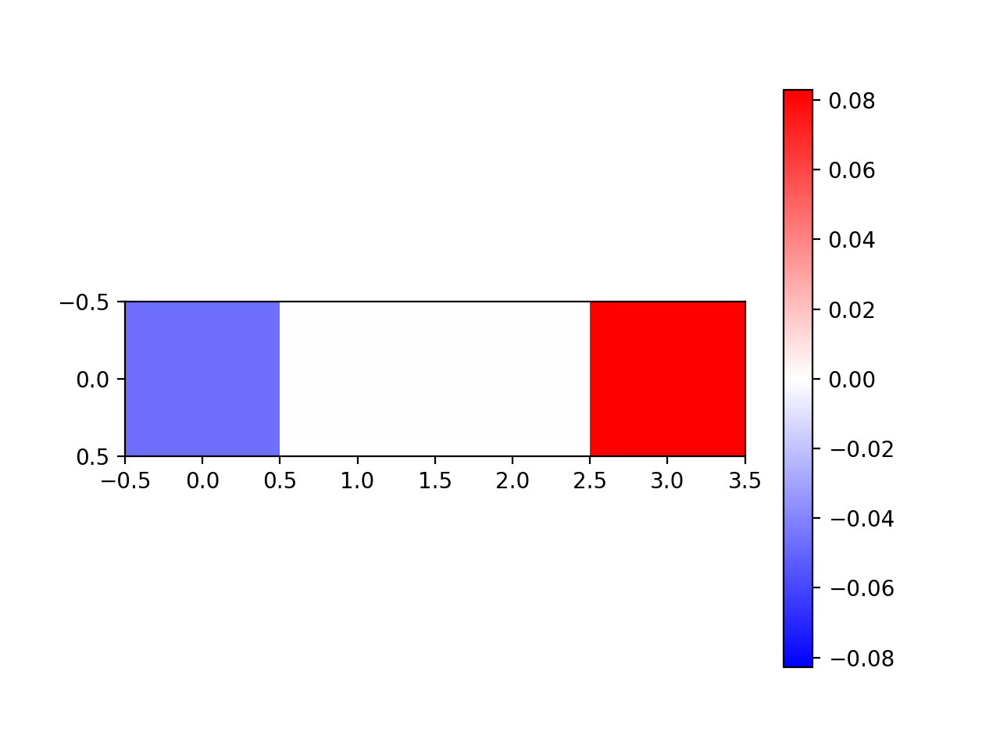

In [377]:
plt.figure()
ut.imshow_hot_cold(coef_list[2][np.newaxis])
plt.colorbar()

In [974]:
low_sst_pv = (Wmys[lkat][:,1,0]-Wmys[lkat][:,1,3] < -0.6)
high_sst_pv = (Wmys[lkat][:,1,0]-Wmys[lkat][:,1,3] > 0.05)

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


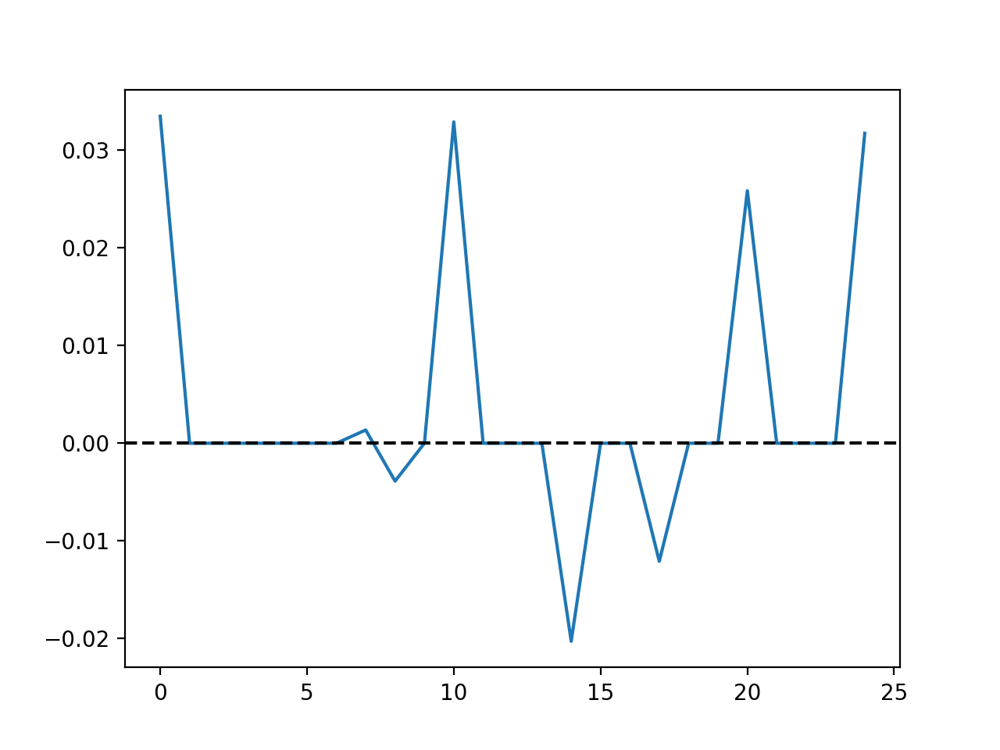

In [975]:
plt.figure()
plt.plot(linreg.coef_)
plt.axhline(0,c='k',linestyle='dashed')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


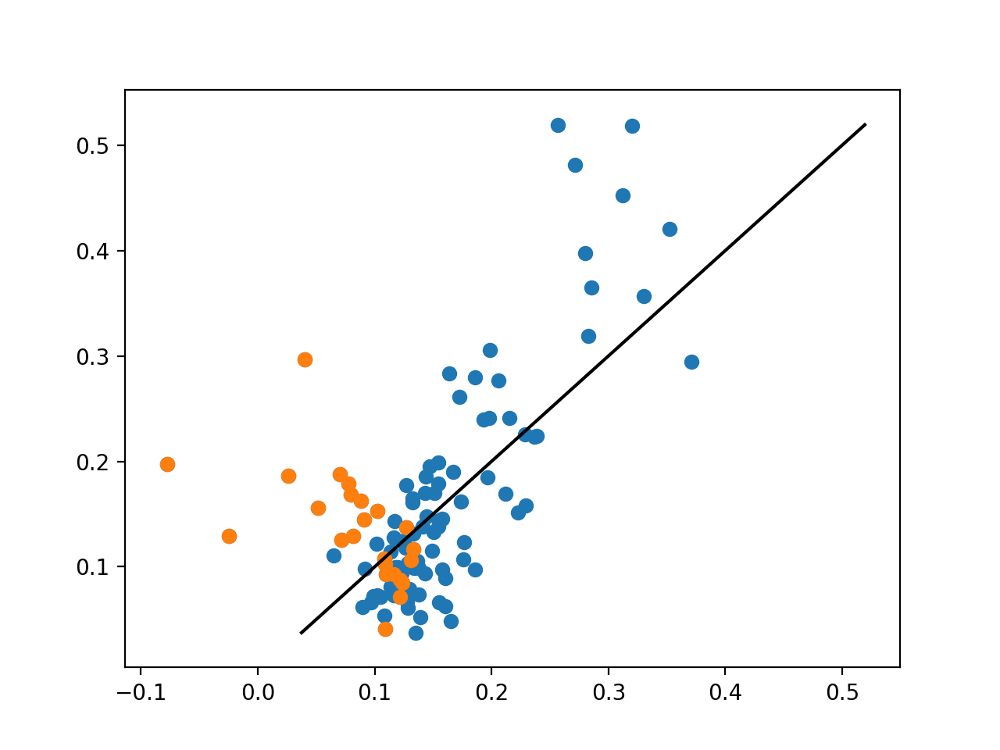

In [381]:
plt.figure()
plt.scatter(linreg.predict(X),y)
plt.scatter(linreg.predict(X)[big_pc_rf],y[big_pc_rf])
mn,mx = y.min(),y.max()
plt.plot((mn,mx),(mn,mx),c='k')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


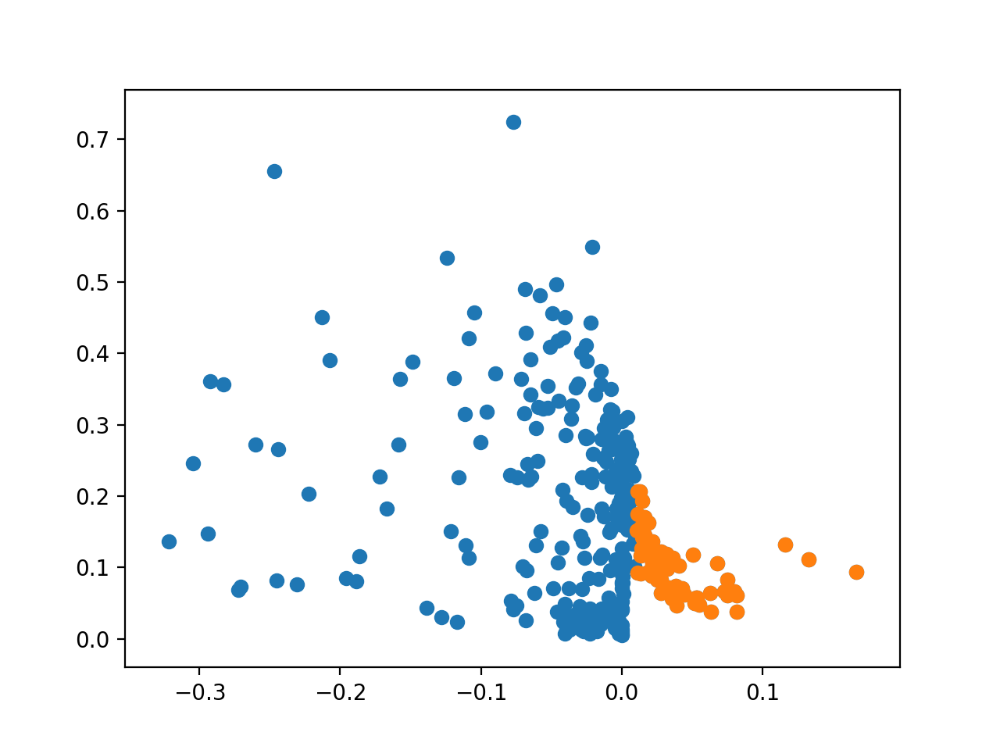

In [976]:
plt.figure()
plt.scatter(Ks[lkat][:,0]-Ks[lkat][:,3],y)
plt.scatter((Ks[lkat][:,0]-Ks[lkat][:,3])[big_pc_rf],y[big_pc_rf])
mn,mx = y.min(),y.max()
# plt.plot((mn,mx),(mn,mx),c='k')


In [977]:
print(np.corrcoef(Ks[lkat][:,0],y)[0,1])
print(np.corrcoef(-Ks[lkat][:,3],y)[0,1])
print(np.corrcoef(Ks[lkat][:,0]-Ks[lkat][:,3],y)[0,1])

print(np.corrcoef((Ks[lkat][:,0]-Ks[lkat][:,3])[big_pc_rf],y[big_pc_rf])[0,1])
print(np.corrcoef((Ks[lkat][:,0]-Ks[lkat][:,3])[~big_pc_rf],y[~big_pc_rf])[0,1])

-0.18475022914001155
-0.23935964202410787
-0.28339847855182715
-0.4268657189046921
-0.16272657654231112


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


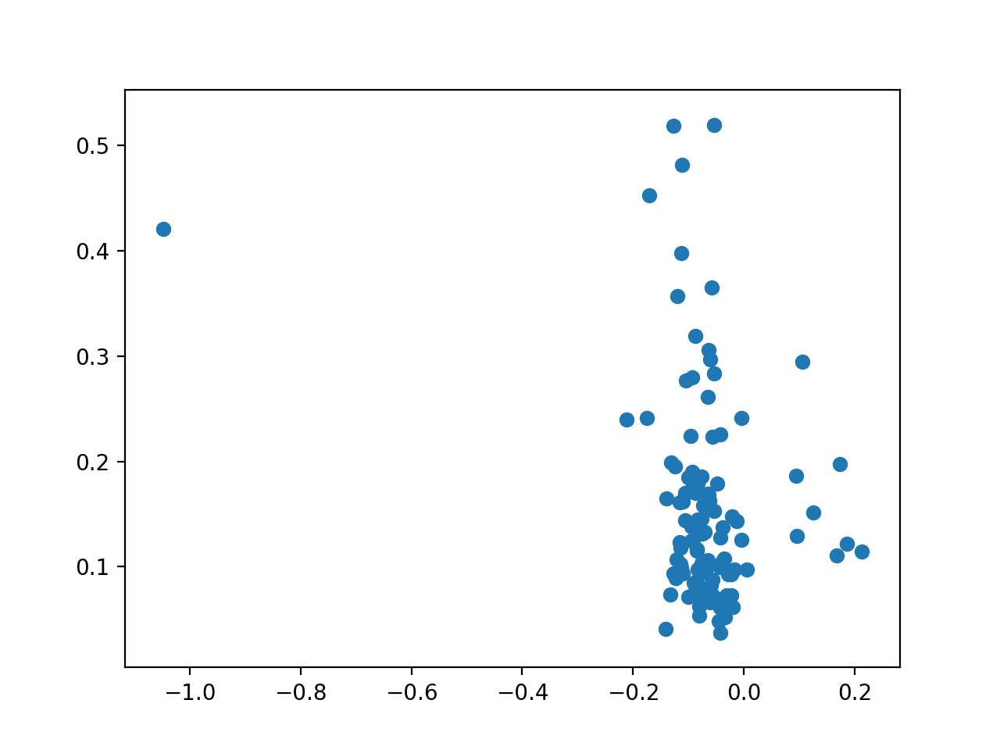

In [370]:
plt.figure()
plt.scatter(Wmys[lkat][:,1,0]-Wmys[lkat][:,1,3],y)
# plt.scatter(Wmys[lkat][:,1,3],y)
mn,mx = y.min(),y.max()
# plt.plot((mn,mx),(mn,mx),c='k')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


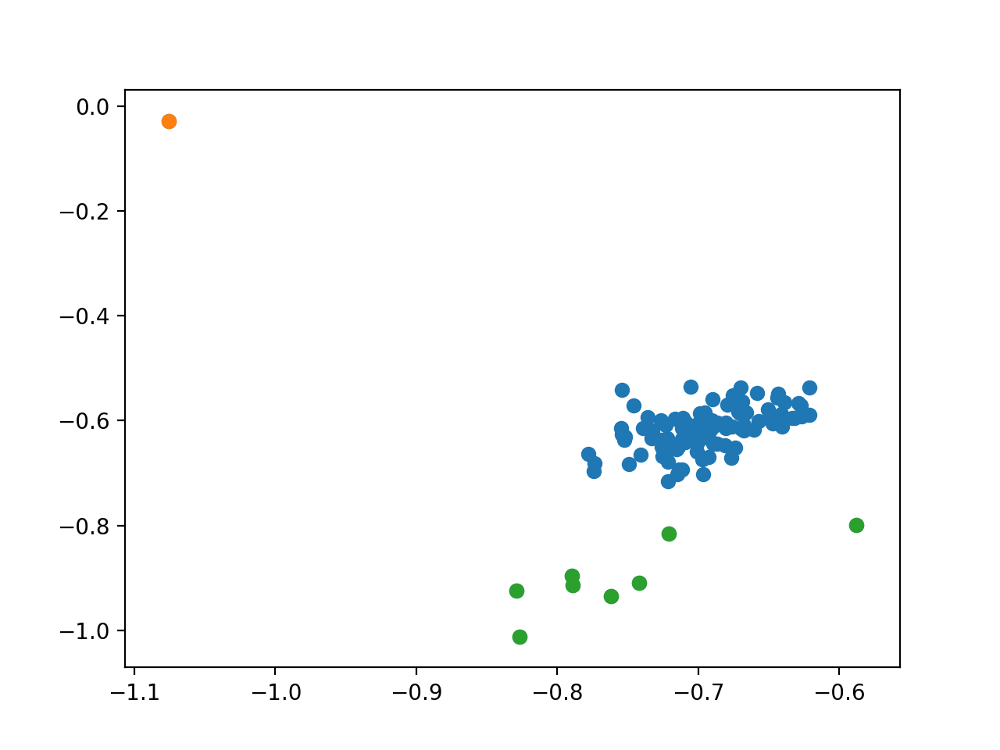

In [371]:
plt.figure()
plt.scatter(Wmys[lkat][:,1,0],Wmys[lkat][:,1,3])
plt.scatter(Wmys[lkat][:,1,0][low_sst_pv],Wmys[lkat][:,1,3][low_sst_pv])
plt.scatter(Wmys[lkat][:,1,0][high_sst_pv],Wmys[lkat][:,1,3][high_sst_pv])